# Boeing

## Exogeneous variables to investigate and why

| #  | Variable Name            | Yahoo Ticker         | Relevance                                                              |
|----|--------------------------|----------------------|------------------------------------------------------------------------|
| 1  | Steel Prices             | SLX                  | Boeing uses a lot of steel → input cost sensitivity                   |
| 2  | Crude Oil Prices         | CL=F                 | Indirect impact via airline costs and demand                          |
| 3  | Aerospace Sector ETF     | ITA                  | Captures industry sentiment and peer performance                      |
| 4  | Industrial Sector ETF    | XLI                  | Proxy for macroeconomic manufacturing trends                          |
| 5  | 10-Year Treasury Yield   | ^TNX                 | Financial environment, cost of borrowing                              |
| 6  | Volatility Index (VIX)   | ^VIX                 | Market uncertainty → impacts investment & orders                      |
| 7  | USD Strength             | DX-Y.NYB             | Impacts Boeing’s international competitiveness                        |
| 8  | Transportation ETF       | IYT                  | Proxy for logistics/demand in goods transport                         |
| 9  | US Manufacturing PMI     | external (e.g. FRED: NAPM) | Sentiment-based forward indicator of demand                     |
| 10 | Airline ETF              | JETS                 | Tracks health of Boeing’s largest customers (airlines)                |



In [3]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
# Suppress common statsmodels warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", message="No supported index is available")
warnings.filterwarnings("ignore", message="A date index has been provided, but it has no associated frequency")

In [4]:
#load libraries
# Core libraries
import os
os.environ['PYTHONHASHSEED'] = '22'
import random
import time
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Statistical and time series analysis
from scipy.stats import spearmanr, pearsonr
from scipy.stats import pearsonr
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Forecasting
from pmdarima import auto_arima

# Machine learning
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBRegressor

# Deep learning (LSTM)
import tensorflow as tf
import keras_tuner
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping
from keras_tuner.tuners import RandomSearch
from keras_tuner import HyperModel

# loading data
import yfinance as yf

#!pip install xgboost
#!pip install keras-tuner --quiet
#!pip install pmdarima

#preventinf memory full error
import gc
from keras import backend as K

In [5]:
#setting random seeed
seed = 22
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

In [6]:
"""#Download data (BA and Exo Variables)

# selecting time period for the COVID-19 phase
start_date = "2020-01-01"
end_date = "2021-03-31"

# defining tickers and labels
tickers = {
    "BA": "Boeing",
    "SLX": "Steel ETF",
    "CL=F": "Crude Oil",
    "ITA": "Aerospace ETF",
    "XLI": "Industrial ETF",
    "^TNX": "10Y Yield",
    "^VIX": "Volatility Index",
    "DX-Y.NYB": "USD Index",
    "IYT": "Transport ETF",
    "JETS": "Airline ETF"

}

data_frames = []

for ticker, label in tickers.items():
    try:
        print(f"Downloading {label} ({ticker})...")
        df = yf.download(ticker, start=start_date, end=end_date)["Adj Close"]
        df.name = label
        data_frames.append(df)
        time.sleep(2)  # Adding delay to avoid hitting the limit again
    except Exception as e:
        print(f"Failed to download {ticker}: {e}")

# combining all columns into one DataFrame
combined_df = pd.concat(data_frames, axis=1)

# Save combined dataset as well
combined_df.to_csv("boeing_exo_variables_combined.csv")

# Preview
print("\nCombined data preview:")
print(combined_df.head())"""

'#Download data (BA and Exo Variables)\n\n# selecting time period for the COVID-19 phase\nstart_date = "2020-01-01"\nend_date = "2021-03-31"\n\n# defining tickers and labels\ntickers = {\n    "BA": "Boeing",\n    "SLX": "Steel ETF",\n    "CL=F": "Crude Oil",\n    "ITA": "Aerospace ETF",\n    "XLI": "Industrial ETF",\n    "^TNX": "10Y Yield",\n    "^VIX": "Volatility Index",\n    "DX-Y.NYB": "USD Index",\n    "IYT": "Transport ETF",\n    "JETS": "Airline ETF"\n\n}\n\ndata_frames = []\n\nfor ticker, label in tickers.items():\n    try:\n        print(f"Downloading {label} ({ticker})...")\n        df = yf.download(ticker, start=start_date, end=end_date)["Adj Close"]\n        df.name = label\n        data_frames.append(df)\n        time.sleep(2)  # Adding delay to avoid hitting the limit again\n    except Exception as e:\n        print(f"Failed to download {ticker}: {e}")\n\n# combining all columns into one DataFrame\ncombined_df = pd.concat(data_frames, axis=1)\n\n# Save combined dataset a

## Basic EDA for BA and exogeneous variables 

In [8]:
# data doenloaded via google cloab instead
# uploading here

# Load the full combined file
df = pd.read_csv("boeing_exo_data/boeing_exo_variables_combined.csv", skiprows = 1, index_col=0, parse_dates=True, date_format="%Y-%m-%d")

# Drop the first row (which is still the leftover 'Date' label)
df = df[df.index != "Date"].copy()

# Convert all columns to numeric (force errors to NaN)
df = df.apply(pd.to_numeric, errors="coerce")

# Check structure
print(df.info())
print(df.head())
print("\nMissing values:\n", df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
Index: 313 entries, 2020-01-02 to 2021-03-30
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   BA        313 non-null    float64
 1   SLX       313 non-null    float64
 2   CL=F      313 non-null    float64
 3   ITA       313 non-null    float64
 4   XLI       313 non-null    float64
 5   ^TNX      313 non-null    float64
 6   ^VIX      313 non-null    float64
 7   DX-Y.NYB  313 non-null    float64
 8   IYT       313 non-null    float64
 9   JETS      313 non-null    float64
dtypes: float64(10)
memory usage: 26.9+ KB
None
                    BA        SLX       CL=F         ITA        XLI   ^TNX  \
Ticker                                                                       
2020-01-02  331.348572  31.094812  61.180000  107.825531  75.932243  1.882   
2020-01-03  330.791901  30.661240  63.049999  109.058441  75.785889  1.788   
2020-01-06  331.766083  30.366728  63.270000  109.205475

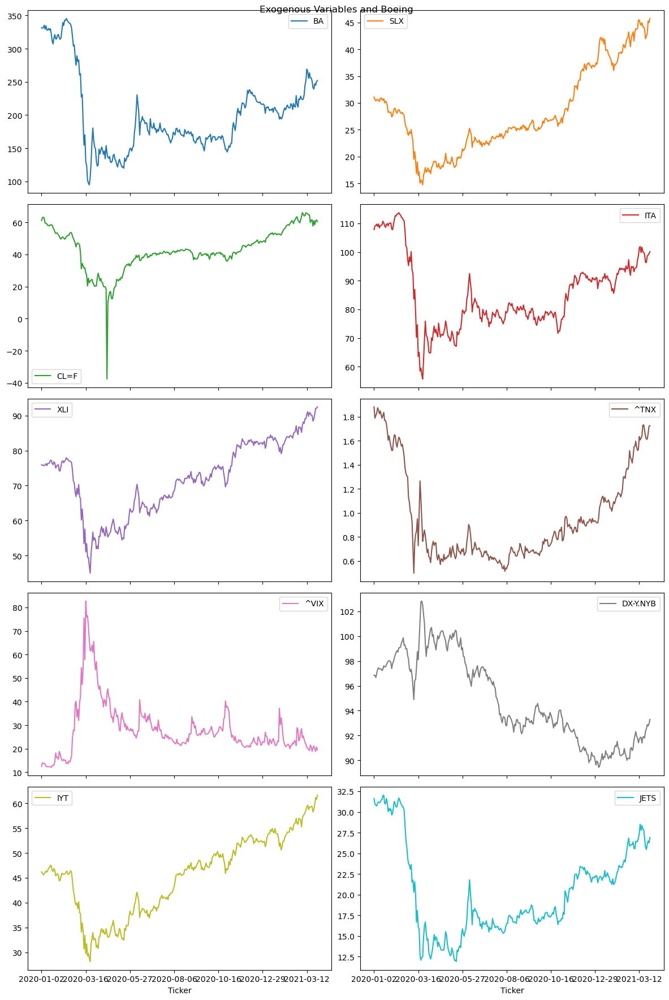

In [9]:
# Basic visual EDA
df.plot(subplots=True, figsize=(12, 18), layout=(5, 2), title="Exogenous Variables and Boeing")
plt.tight_layout()
plt.show()

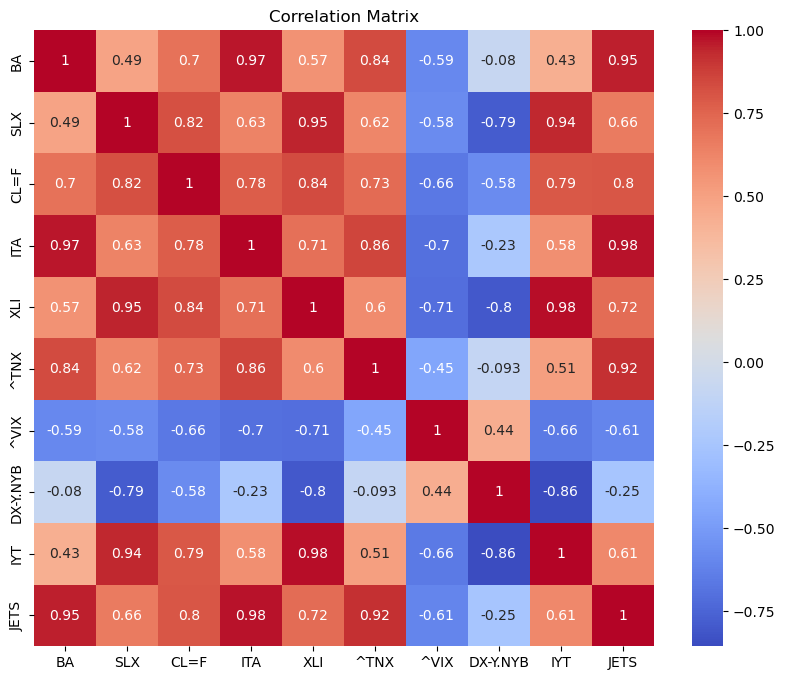

In [10]:
#correlation heatmap
corr = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

These exo variables look promising! Seem to floow a similar pattern and plenty of strong correlation between variables

#### Checking for stationality

In [13]:
#ADF tests
#Ho: Time series is non-stationary
#Ha: Time series is stationary 
#for each ticker, if p is less than 0.05 the test was significant and we reject Ho.. thus stationary


# Initialize result list
adf_results = []

# Looping over each column (including Boeing and exogenous variables)
for column in df.columns:
    series = df[column].dropna()
    
    try:
        result = adfuller(series)
        adf_results.append({
            'Variable': column,
            'ADF Statistic': result[0],
            'p-value': result[1],
            'Stationary': 'Yes' if result[1] < 0.05 else 'No'
        })
    except Exception as e:
        adf_results.append({
            'Variable': column,
            'ADF Statistic': None,
            'p-value': None,
            'Stationary': 'Error',
            'Error': str(e)
        })

# converting results to DataFrame
adf_df = pd.DataFrame(adf_results)
print(adf_df)

   Variable  ADF Statistic   p-value Stationary
0        BA      -2.348879  0.156688         No
1       SLX       0.174499  0.970795         No
2      CL=F      -1.362642  0.600049         No
3       ITA      -2.304918  0.170387         No
4       XLI      -0.802012  0.818530         No
5      ^TNX      -1.628068  0.468502         No
6      ^VIX      -2.938516  0.041049        Yes
7  DX-Y.NYB      -1.065244  0.728731         No
8       IYT      -0.240123  0.933567         No
9      JETS      -1.931395  0.317439         No


Need to ensure all are stationary before doing granger tests to avoid getting spurious results, inflated p-values, or invalid inference.

The Granger test assumes:
- Time series are covariance stationary
- constant mean/variance over time


In [15]:
# Getting first difference for all bar ^VIX
# making copy of original DataFrame
df_diff = df.copy()

# List of non-stationary series from ADF output
non_stationary = ['BA', 'SLX', 'CL=F', 'ITA', 'XLI', '^TNX', 'DX-Y.NYB', 'IYT', 'JETS']
stationary = ['^VIX'] 

# Difference only non-stationary series
df_diff_nonstat = df[non_stationary].diff()

# Drop NaNs from differenced data
df_diff_nonstat = df_diff_nonstat.dropna()

# Slice ^VIX data to match df_diff_nonstat index exactly
df_vix_clean = df.loc[df_diff_nonstat.index, stationary]

# Concatenate differenced and stationary series
df_diff = pd.concat([df_diff_nonstat, df_vix_clean], axis=1)

# Check the final DataFrame
print(df_diff.head())

                  BA       SLX      CL=F       ITA       XLI   ^TNX  DX-Y.NYB  \
Ticker                                                                          
2020-01-03 -0.556671 -0.433573  1.869999  1.232910 -0.146355 -0.094 -0.010002   
2020-01-06  0.974182 -0.294512  0.220001  0.147034  0.027435  0.023 -0.169998   
2020-01-07  3.519073  0.212702 -0.570000  0.493164 -0.155510  0.016  0.310005   
2020-01-08 -5.875061  0.098169 -3.090000 -0.730278  0.256142  0.047  0.320000   
2020-01-09  4.940613 -0.204519 -0.049999  0.825134  0.320152 -0.016  0.149994   

                 IYT      JETS   ^VIX  
Ticker                                 
2020-01-03 -0.318718 -0.676195  14.02  
2020-01-06 -0.274178 -0.129082  13.85  
2020-01-07  0.159363 -0.096315  13.79  
2020-01-08  0.377285  0.329655  13.45  
2020-01-09  0.208561  0.150928  12.54  


In [16]:
#checking for stationality again (same hypotheses)

# Initialize result list
adf_results = []

# Using the differenced DataFrame
for column in df_diff.columns:
    series = df_diff[column].dropna()

    try:
        result = adfuller(series)
        adf_results.append({
            'Variable': column,
            'ADF Statistic': result[0],
            'p-value': result[1],
            'Stationary': 'Yes' if result[1] < 0.05 else 'No'
        })
    except Exception as e:
        adf_results.append({
            'Variable': column,
            'ADF Statistic': None,
            'p-value': None,
            'Stationary': 'Error',
            'Error': str(e)
        })

# converting to dataframe and show
adf_df = pd.DataFrame(adf_results)
print(adf_df)

   Variable  ADF Statistic       p-value Stationary
0        BA     -10.150719  7.964596e-18        Yes
1       SLX      -5.204165  8.621556e-06        Yes
2      CL=F     -12.297424  7.583421e-23        Yes
3       ITA      -5.663108  9.282238e-07        Yes
4       XLI      -4.721658  7.661281e-05        Yes
5      ^TNX      -6.822856  1.981554e-09        Yes
6  DX-Y.NYB      -8.494498  1.286773e-13        Yes
7       IYT      -4.718810  7.756599e-05        Yes
8      JETS      -5.942577  2.242810e-07        Yes
9      ^VIX      -2.956026  3.921015e-02        Yes


### Granger Causality test 
Looking for strongest candidates for exogeneous variables for this period

In [18]:
# Setting max lag for Granger test
MAX_LAG = 5

# Initialize result list
granger_results = []

# Looping through each exogenous variable
for exo_var in df_diff.columns:
    if exo_var == 'BA':
        continue  # Skip target itself

    try:
        # Subset DataFrame for this test (BA and current exogenous var)
        test_data = df_diff[['BA', exo_var]].dropna()

        # Granger causality test
        result = grangercausalitytests(test_data, maxlag=MAX_LAG, verbose=False)

        # Extract p-values for each lag
        p_values = [round(result[i + 1][0]['ssr_ftest'][1], 4) for i in range(MAX_LAG)]

        # Store min p-value and associated variable
        granger_results.append({
            'Exogenous Variable': exo_var,
            'Min p-value': min(p_values),
            'Lag with Min p': p_values.index(min(p_values)) + 1,
            'Causal (p < 0.05)': 'Yes' if min(p_values) < 0.05 else 'No'
        })

    except Exception as e:
        granger_results.append({
            'Exogenous Variable': exo_var,
            'Min p-value': None,
            'Lag with Min p': None,
            'Causal (p < 0.05)': 'Error',
            'Error': str(e)
        })

# Showing results
granger_df = pd.DataFrame(granger_results)
print(granger_df.sort_values("Min p-value"))

  Exogenous Variable  Min p-value  Lag with Min p Causal (p < 0.05)
8               ^VIX       0.0000               4               Yes
5           DX-Y.NYB       0.0004               5               Yes
7               JETS       0.0090               3               Yes
3                XLI       0.0220               1               Yes
6                IYT       0.0468               2               Yes
4               ^TNX       0.0732               1                No
2                ITA       0.1149               1                No
1               CL=F       0.1775               5                No
0                SLX       0.4470               1                No


In [19]:
# Define target variable
target = 'BA'

# Define exogenous variables to test
variables_to_test = ['XLI', 'DX-Y.NYB', 'IYT', 'JETS', '^VIX']

max_lag = 5

# Run tests one by one for detailed output
for var in variables_to_test:
    print(f"\n Granger Causality Test: {var} ➡ {target} (Lags 1–{max_lag})")
    test_data = df_diff[[target, var]].dropna()
    grangercausalitytests(test_data, maxlag=max_lag, verbose=True)


 Granger Causality Test: XLI ➡ BA (Lags 1–5)

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2963  , p=0.0220  , df_denom=308, df_num=1
ssr based chi2 test:   chi2=5.3479  , p=0.0207  , df=1
likelihood ratio test: chi2=5.3024  , p=0.0213  , df=1
parameter F test:         F=5.2963  , p=0.0220  , df_denom=308, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.5089  , p=0.0830  , df_denom=305, df_num=2
ssr based chi2 test:   chi2=5.1000  , p=0.0781  , df=2
likelihood ratio test: chi2=5.0585  , p=0.0797  , df=2
parameter F test:         F=2.5089  , p=0.0830  , df_denom=305, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7969  , p=0.1478  , df_denom=302, df_num=3
ssr based chi2 test:   chi2=5.5156  , p=0.1377  , df=3
likelihood ratio test: chi2=5.4669  , p=0.1406  , df=3
parameter F test:         F=1.7969  , p=0.1478  , df_denom=302, df_num=3

Granger Causality
number of lags (no zero) 4
ss

In [20]:
#seeing if a different lag could correlate with the other variables
#including all variables in case better p value for later lags

# Set higher max lag for Granger test
MAX_LAG = 20

# Initialize result list
granger_results_20 = []

# Loop through each exogenous variable
for exo_var in df_diff.columns:
    if exo_var == 'BA':
        continue  # Skipping the dependent variable

    try:
        # Prepare input data
        test_data = df_diff[['BA', exo_var]].dropna()

        # Run Granger causality test
        result = grangercausalitytests(test_data, maxlag=MAX_LAG, verbose=False)

        # Extract p-values across lags
        p_values = [round(result[i + 1][0]['ssr_ftest'][1], 4) for i in range(MAX_LAG)]

        # Store the lowest p-value and associated lag
        granger_results_20.append({
            'Exogenous Variable': exo_var,
            'Min p-value': min(p_values),
            'Lag with Min p': p_values.index(min(p_values)) + 1,
            'Causal (p < 0.05)': 'Yes' if min(p_values) < 0.05 else 'No',
            'All p-values': p_values #storing to plot later
        })

    except Exception as e:
        granger_results_20.append({
            'Exogenous Variable': exo_var,
            'Min p-value': None,
            'Lag with Min p': None,
            'Causal (p < 0.05)': 'Error',
            'Error': str(e)
        })

# Display results
granger_df_20 = pd.DataFrame(granger_results_20)
print(granger_df_20.sort_values("Min p-value"))

  Exogenous Variable  Min p-value  Lag with Min p Causal (p < 0.05)  \
8               ^VIX       0.0000               4               Yes   
4               ^TNX       0.0001               9               Yes   
5           DX-Y.NYB       0.0001              16               Yes   
7               JETS       0.0002              12               Yes   
3                XLI       0.0220               1               Yes   
6                IYT       0.0468               2               Yes   
2                ITA       0.1149               1                No   
1               CL=F       0.1445               6                No   
0                SLX       0.4470               1                No   

                                        All p-values  
8  [0.2406, 0.065, 0.0038, 0.0, 0.0, 0.0, 0.0, 0....  
4  [0.0732, 0.2909, 0.4703, 0.5961, 0.2128, 0.001...  
5  [0.4535, 0.9079, 0.01, 0.0153, 0.0004, 0.0009,...  
7  [0.5086, 0.1213, 0.009, 0.0211, 0.0238, 0.0305...  
3  [0.022, 0.0

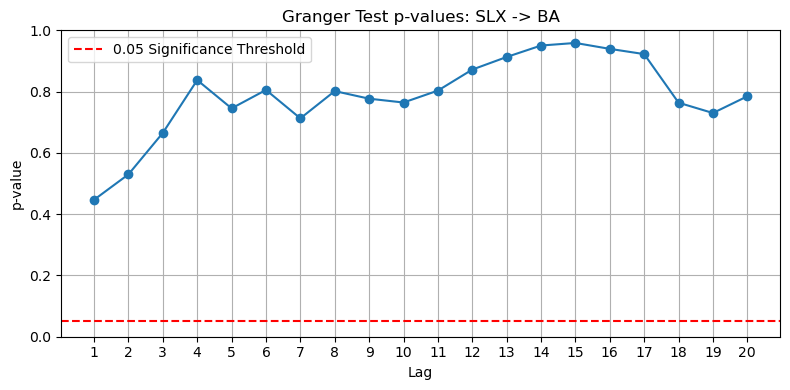

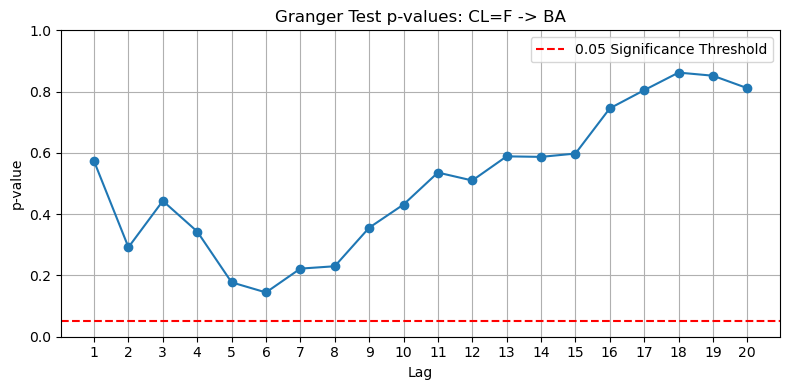

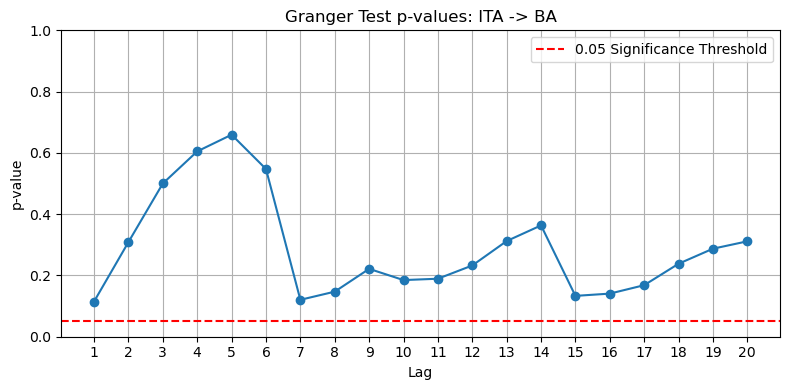

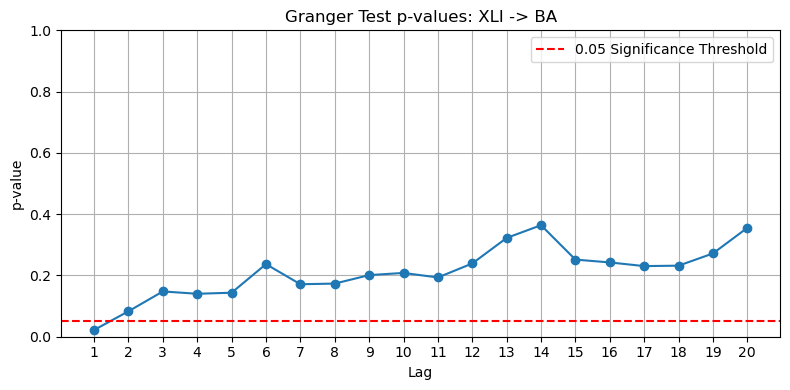

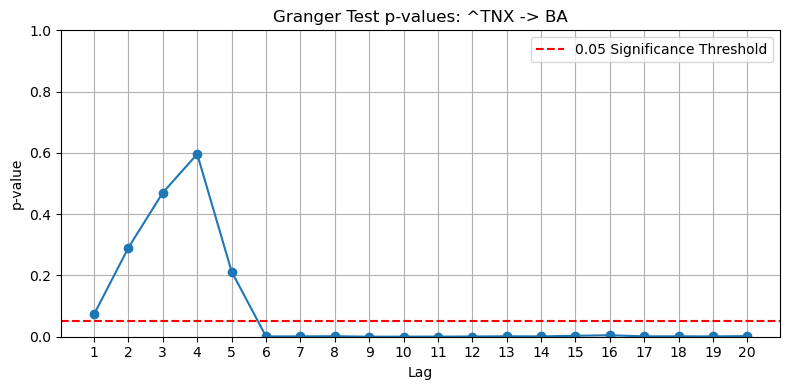

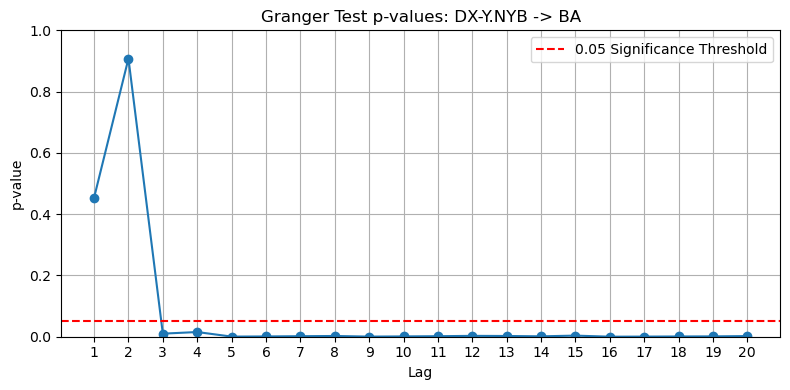

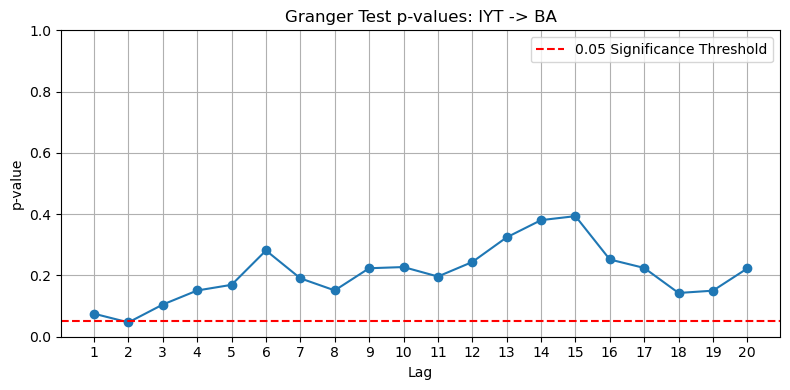

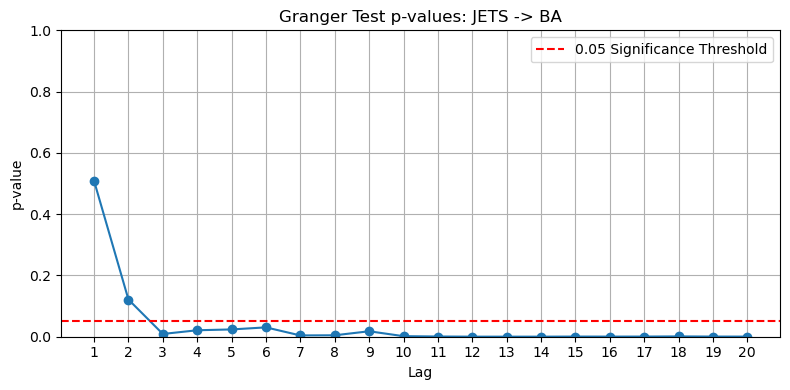

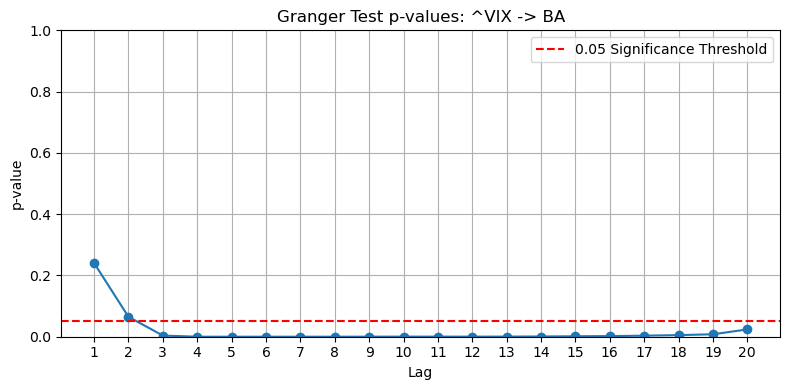

In [21]:
# Plot p-values across lags for each exogenous variable
for result in granger_results_20:
    if 'All p-values' not in result:
        continue  # Skip if p-values not stored due to error

    plt.figure(figsize=(8, 4))
    plt.plot(range(1, MAX_LAG + 1), result['All p-values'], marker='o')
    plt.axhline(y=0.05, color='red', linestyle='--', label='0.05 Significance Threshold')
    plt.title(f"Granger Test p-values: {result['Exogenous Variable']} -> BA")
    plt.xlabel("Lag")
    plt.ylabel("p-value")
    plt.xticks(range(1, MAX_LAG + 1))
    plt.ylim(0, 1)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [22]:
# Print the full p-values from the correct DataFrame
for idx, row in granger_df_20.iterrows():
    print(f"{row['Exogenous Variable']} → p-values: {row.get('All p-values', 'Missing')}")


SLX → p-values: [0.447, 0.5299, 0.6653, 0.8376, 0.7453, 0.8054, 0.7127, 0.8017, 0.7769, 0.7644, 0.8033, 0.8719, 0.913, 0.9504, 0.9588, 0.9395, 0.9224, 0.7638, 0.7301, 0.7847]
CL=F → p-values: [0.5729, 0.292, 0.4433, 0.3434, 0.1775, 0.1445, 0.2223, 0.23, 0.3557, 0.4314, 0.5358, 0.5099, 0.5887, 0.587, 0.5978, 0.7454, 0.8047, 0.8621, 0.8519, 0.8112]
ITA → p-values: [0.1149, 0.3089, 0.5002, 0.6049, 0.6593, 0.5474, 0.1205, 0.1471, 0.2215, 0.1849, 0.1893, 0.2325, 0.3122, 0.3633, 0.1333, 0.1407, 0.1682, 0.2382, 0.2873, 0.3114]
XLI → p-values: [0.022, 0.083, 0.1478, 0.1402, 0.1436, 0.2369, 0.1713, 0.1734, 0.2011, 0.2082, 0.1934, 0.2391, 0.3224, 0.364, 0.2517, 0.2425, 0.2305, 0.2319, 0.2718, 0.3554]
^TNX → p-values: [0.0732, 0.2909, 0.4703, 0.5961, 0.2128, 0.001, 0.0011, 0.0016, 0.0001, 0.0003, 0.0004, 0.0007, 0.0014, 0.0011, 0.0031, 0.0048, 0.0012, 0.0013, 0.0011, 0.002]
DX-Y.NYB → p-values: [0.4535, 0.9079, 0.01, 0.0153, 0.0004, 0.0009, 0.0017, 0.0024, 0.0004, 0.001, 0.0017, 0.0028, 0.0024, 0

## Building ARIMA model

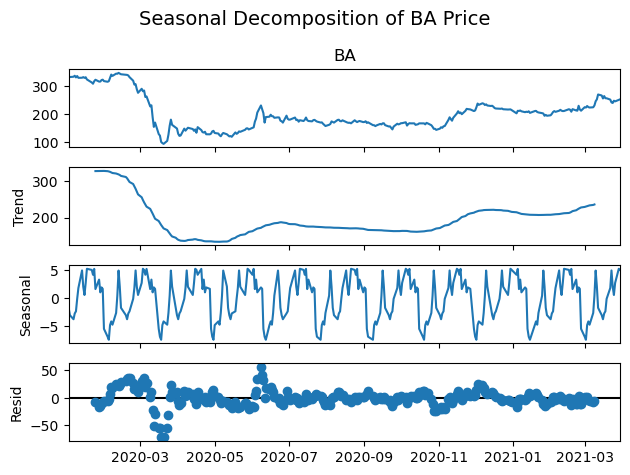

In [24]:
#already know it needs to be differenced once for stationlity
#looking at seasonality

# Extracting BA price series
ba_series = df['BA'].dropna()
ba_series.index = pd.to_datetime(ba_series.index)

# Try daily seasonality 
decomposition = seasonal_decompose(ba_series, model='additive', period=30)
decomposition.plot()
plt.suptitle('Seasonal Decomposition of BA Price', fontsize=14)
plt.tight_layout()
plt.show()

Seasonality looks fairly weak here... some recurring patterns, but nothing too sharp. Could be weekly cycles (maybe 5–7 days), but the amplitude’s small, so probably not worth going full SARIMA (but will test anyway with autoarima to be sure). Trend is clearly non-stationary early on, so using differencing still makes sense. Residuals look a bit noisy early in the series but settle down... might be some room for exogenous variables to help

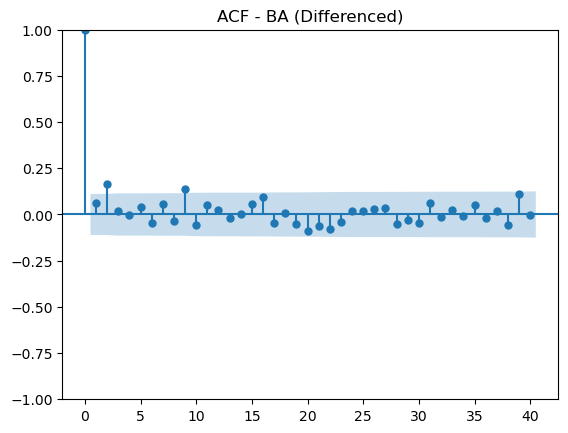

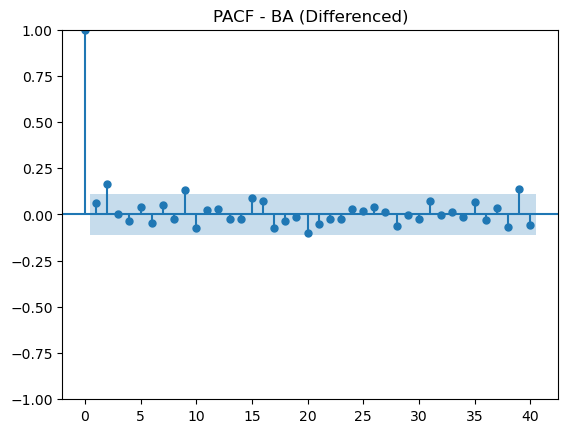

In [26]:
#ACF PACF plots
# First difference
ba_diff = ba_series.diff().dropna()

# Plot ACF & PACF
plot_acf(ba_diff, lags=40)
plt.title('ACF - BA (Differenced)')
plt.show()

plot_pacf(ba_diff, lags=40)
plt.title('PACF - BA (Differenced)')
plt.show()

Looks like (1,1,1) could be best. Will use auto arima to see if this is confirmed

In [28]:
auto_model = auto_arima(ba_series, seasonal=True, m=30,
                        stepwise=True, trace=True,
                        suppress_warnings=True, max_order=10)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[30] intercept   : AIC=inf, Time=2.25 sec
 ARIMA(0,1,0)(0,0,0)[30] intercept   : AIC=2257.996, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[30] intercept   : AIC=2260.008, Time=0.56 sec
 ARIMA(0,1,1)(0,0,1)[30] intercept   : AIC=2260.076, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[30]             : AIC=2256.247, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[30] intercept   : AIC=2259.334, Time=0.37 sec
 ARIMA(0,1,0)(0,0,1)[30] intercept   : AIC=2259.103, Time=0.40 sec
 ARIMA(0,1,0)(1,0,1)[30] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,1,0)(0,0,0)[30] intercept   : AIC=2258.746, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[30] intercept   : AIC=2259.056, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[30] intercept   : AIC=2256.831, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[30]          
Total fit time: 5.026 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                

In [29]:
#trying a grid search to see if any other seasonality is sensile
def evaluate_sarima_configs(y, order_list, seasonal_order_list, seasonal_period, forecast_horizon=7):
    results = []

    train = y.iloc[:-forecast_horizon]
    test = y.iloc[-forecast_horizon:]

    for order in order_list:
        for seasonal in seasonal_order_list:
            seasonal_order = (seasonal[0], seasonal[1], seasonal[2], seasonal_period)
            try:
                model = SARIMAX(train, order=order, seasonal_order=seasonal_order,
                                enforce_stationarity=False, enforce_invertibility=False)
                model_fit = model.fit(disp=False)

                forecast = model_fit.forecast(steps=forecast_horizon)

                rmse = np.sqrt(mean_squared_error(test, forecast))
                mae = mean_absolute_error(test, forecast)

                results.append({
                    'order': order,
                    'seasonal_order': seasonal_order,
                    'RMSE': round(rmse, 2),
                    'MAE': round(mae, 2),
                    'AIC': round(model_fit.aic, 2)
                })

            except Exception as e:
                results.append({
                    'order': order,
                    'seasonal_order': seasonal_order,
                    'RMSE': None,
                    'MAE': None,
                    'AIC': None,
                    'Error': str(e)
                })

    return pd.DataFrame(results)

In [32]:
order_list = [(0, 1, 0), (1, 1, 1), (0, 1, 1),(0,1,2)]
seasonal_order_list = [(1, 0, 0), (0, 0, 1), (1, 0, 1)]

for m in [5, 7, 20, 21, 22, 30]:
    print(f"Evaluating for seasonal period: {m}")
    results = evaluate_sarima_configs(ba_series, order_list, seasonal_order_list, seasonal_period=m)
    print(results.sort_values('RMSE'))

Evaluating for seasonal period: 5
        order seasonal_order  RMSE   MAE      AIC
11  (0, 1, 2)   (1, 0, 1, 5)  7.46  5.73  2155.69
10  (0, 1, 2)   (0, 0, 1, 5)  8.61  7.24  2154.39
9   (0, 1, 2)   (1, 0, 0, 5)  8.68  7.32  2173.68
4   (1, 1, 1)   (0, 0, 1, 5)  9.51  8.26  2165.46
2   (0, 1, 0)   (1, 0, 1, 5)  9.71  8.50  2174.34
5   (1, 1, 1)   (1, 0, 1, 5)  9.73  8.52  2167.36
7   (0, 1, 1)   (0, 0, 1, 5)  9.75  8.55  2167.04
1   (0, 1, 0)   (0, 0, 1, 5)  9.81  8.62  2172.35
3   (1, 1, 1)   (1, 0, 0, 5)  9.81  8.61  2171.78
6   (0, 1, 1)   (1, 0, 0, 5)  9.83  8.64  2180.02
8   (0, 1, 1)   (1, 0, 1, 5)  9.87  8.69  2169.02
0   (0, 1, 0)   (1, 0, 0, 5)  9.89  8.71  2179.11
Evaluating for seasonal period: 7
        order seasonal_order   RMSE    MAE      AIC
10  (0, 1, 2)   (0, 0, 1, 7)   9.77   8.46  2141.55
11  (0, 1, 2)   (1, 0, 1, 7)   9.77   8.47  2143.52
9   (0, 1, 2)   (1, 0, 0, 7)   9.78   8.47  2160.35
4   (1, 1, 1)   (0, 0, 1, 7)  10.65   9.37  2151.68
3   (1, 1, 1)   (1, 0,

### Best seasonality from grid search
(0, 1, 2)  (1, 0, 1, 30)   RMSE=6.07  MAE=5.37  AIC=1960.75

In [35]:
auto_model = auto_arima(ba_series, seasonal=False, m=30,
                        stepwise=True, trace=True,
                        suppress_warnings=True, max_order=10)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2256.037, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2257.996, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2258.746, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2259.056, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2256.247, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2254.056, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2252.073, Time=0.12 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2254.058, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2256.831, Time=0.11 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2255.815, Time=0.45 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2250.241, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2257.285, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2252.221, Time=0.18 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=2252.224, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]          

Going to use (1,1,1) and (0,1,2) from auto arima... maybe bringing in seasonality (0,1,0) to compare

I will choose best model based on evealuations and then continue with that model for my exogeneous variables

### ARIMA model choice: (0,1,2)

Going to stick with (0,1,2) model without seasonality as it is better in the 3, and 7 day forecasts which are more critical for volatility and trend signals, especially with exogenous inputs. Alo because it has more stable MA structure: the 2 MA terms may help better absorb shocks from external predictors.

And t was recommended by Auto ARIMA (when seasonality was set to False), so it’s already optimized for in-sample AIC.


## Gettning results for Baseline models (no exo variables)
- No seasonality -ARIMAX- (0, 1, 2)
- With seasonality -SARIMAX- (0, 1, 2) seasonality: (1, 0, 1, 30)

In [39]:
#define models

def mean_absolute_percentage_error(y_true, y_pred):
    """Avoids division by zero issues."""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def rolling_forecast_baseline_model(
    df,
    model_order,
    forecast_horizons,
    train_end_date,
    test_start_date,
    output_csv_path,
    seasonal_order=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq('B')
    series = df['BA'].dropna()

    train = series[series.index <= train_end_date]
    test = series[series.index >= test_start_date]

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(0, len(test) - h + 1):
            train_series = pd.concat([train, test.iloc[:i]])

            try:
                model = SARIMAX(
                    train_series,
                    order=model_order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                results = model.fit(disp=False)
                forecast = results.get_forecast(steps=h)
                pred = forecast.predicted_mean.iloc[-1]
                actual = test.iloc[i + h - 1]

                if not np.isnan(pred) and not np.isnan(actual):
                    preds.append(pred)
                    actuals.append(actual)
                    dates.append(test.index[i + h - 1])
            except Exception as e:
                continue

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            model_name = f"SARIMA{model_order}" if seasonal_order else f"ARIMA{model_order}"
            all_metrics.append({
                'model': model_name,
                'seasonal': bool(seasonal_order),
                'horizon': h,
                'rmse': rmse,
                'mae': mae,
                'mape': mape
            })

            # Print results
            print(f"\n{model_name} {'(Seasonal)' if seasonal_order else ''} - Horizon {h}")
            print(f"  RMSE: {rmse:.2f}")
            print(f"  MAE:  {mae:.2f}")
            print(f"  MAPE: {mape:.2f}%")

            # Plot
            plt.figure(figsize=(10, 4))
            plt.plot(dates, actuals, label='Actual')
            plt.plot(dates, preds, label='Forecast')
            plt.title(f"{model_name} {'(Seasonal)' if seasonal_order else ''} - {h}-Day Horizon")
            plt.xlabel('Date')
            plt.ylabel('BA Close Price')
            plt.legend()
            plt.tight_layout()
            plt.show()

    df_metrics = pd.DataFrame(all_metrics)

    if not df_metrics.empty:
        if not os.path.exists(output_csv_path):
            df_metrics.to_csv(output_csv_path, index=False)
        else:
            df_metrics.to_csv(output_csv_path, mode='a', header=False, index=False)
        print(f"\n Saved metrics to {output_csv_path}")

    return df_metrics


ARIMA(0, 1, 2)  - Horizon 1
  RMSE: 6.66
  MAE:  5.14
  MAPE: 2.28%


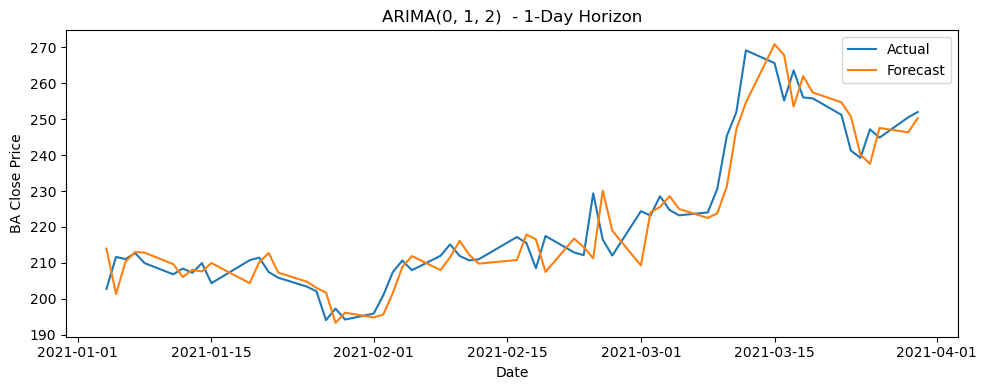


ARIMA(0, 1, 2)  - Horizon 3
  RMSE: 10.22
  MAE:  7.55
  MAPE: 3.30%


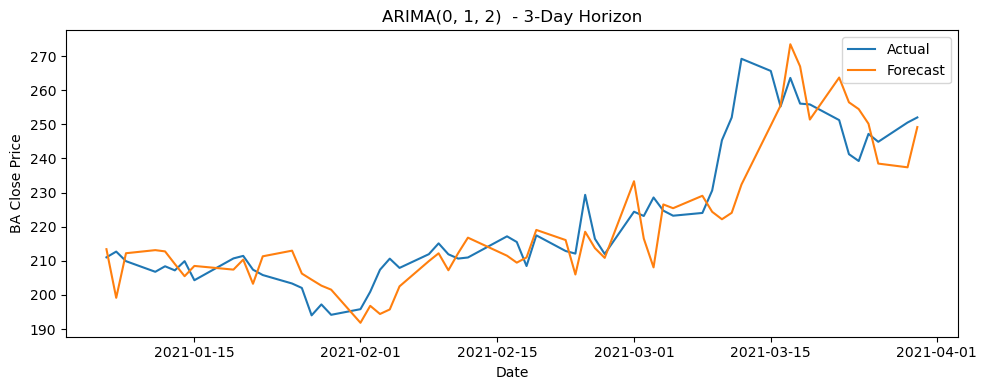


ARIMA(0, 1, 2)  - Horizon 7
  RMSE: 16.19
  MAE:  12.15
  MAPE: 5.25%


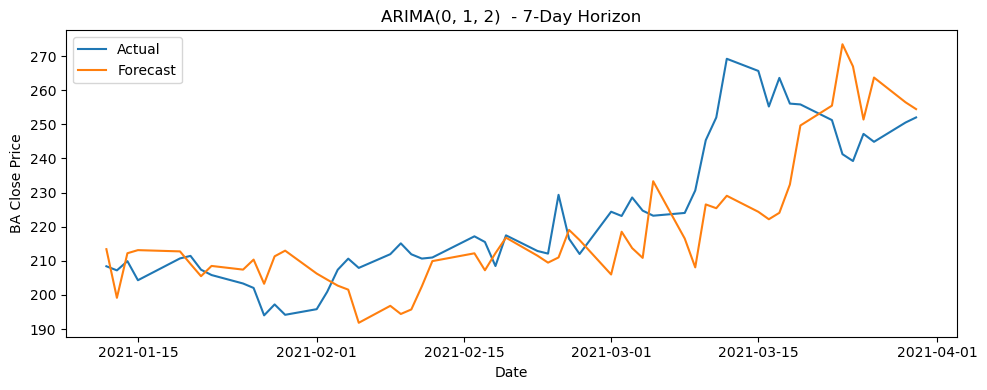


 Saved metrics to baseline_metrics.csv

SARIMA(0, 1, 2) (Seasonal) - Horizon 1
  RMSE: 6.65
  MAE:  5.14
  MAPE: 2.29%


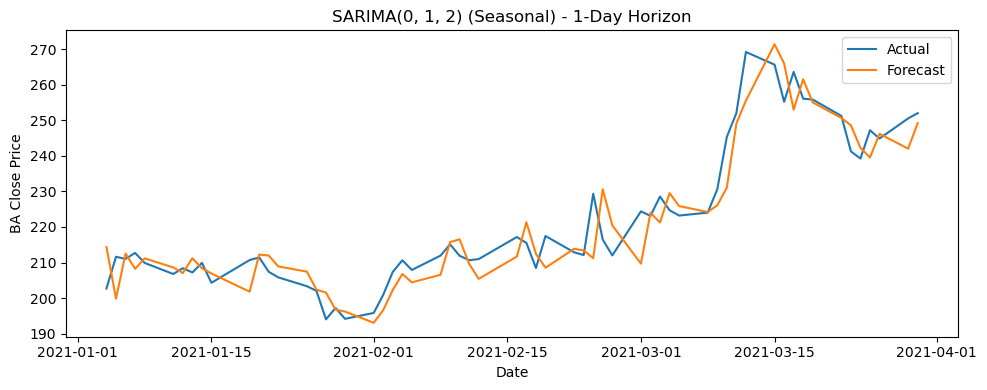


SARIMA(0, 1, 2) (Seasonal) - Horizon 3
  RMSE: 10.49
  MAE:  8.19
  MAPE: 3.64%


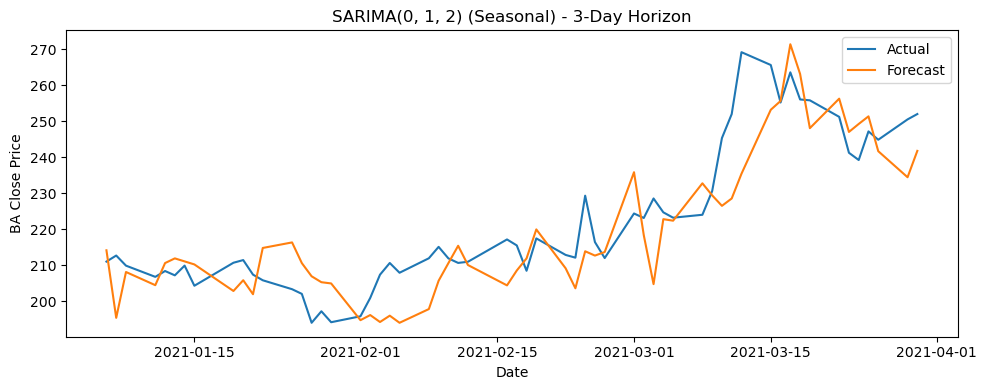


SARIMA(0, 1, 2) (Seasonal) - Horizon 7
  RMSE: 15.84
  MAE:  12.88
  MAPE: 5.70%


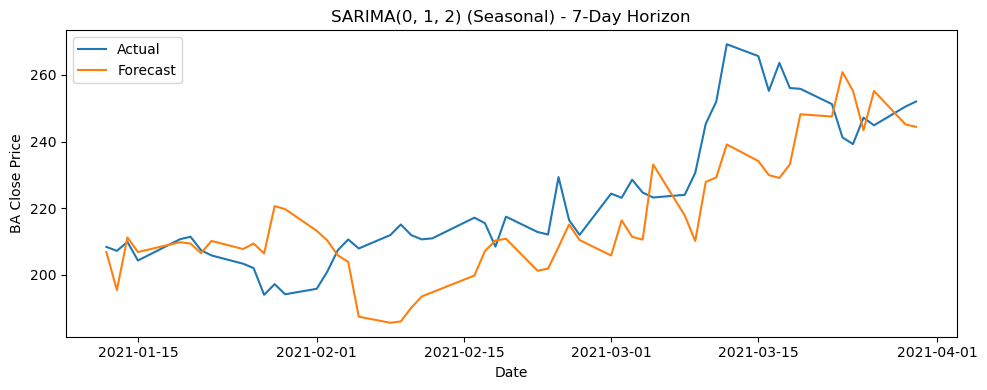


 Saved metrics to baseline_metrics.csv


In [40]:
#running baseline functions
forecast_horizons = [1, 3, 7]
train_end = "2020-12-31"
test_start = "2021-01-01"

# ARIMA(0,1,2) - baseline non-seasonal
baseline_arima_012 = rolling_forecast_baseline_model(
    df=df,
    model_order=(0, 1, 2),
    forecast_horizons=forecast_horizons,
    train_end_date=train_end,
    test_start_date=test_start,
    output_csv_path="baseline_metrics.csv",
    seasonal_order=None
)

# Seasonal ARIMA(0,1,2)(1,0,1)[30] - baseline seasonal
baseline_seasonal = rolling_forecast_baseline_model(
    df=df,
    model_order=(0, 1, 2),
    forecast_horizons=forecast_horizons,
    train_end_date=train_end,
    test_start_date=test_start,
    output_csv_path="baseline_metrics.csv",
    seasonal_order=(1, 0, 1, 30)
)

### Using exo variables with ARIMA
 #### Using "best lags"
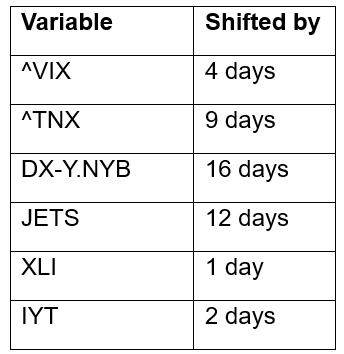

 #### Or sensible lags, with earlier best options
 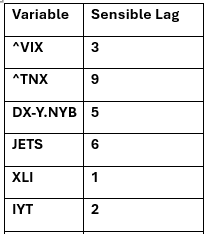

In [44]:
# Define sensible lag choices
exog_lags_sensible = {
    '^VIX': 3,
    '^TNX': 9,
    'DX-Y.NYB': 5,
    'JETS': 6,
    'XLI': 1,
    'IYT': 2
}

# Define best lag choices
exog_lags_best = {
    '^VIX': 4,
    '^TNX': 9,
    'DX-Y.NYB': 16,
    'JETS': 12,
    'XLI': 1,
    'IYT': 2
}

# CHOOSE which to use in this cell
exog_vars = exog_lags_sensible  # or exog_lags_best

### Testing grouped variable's impact on ARIMAX model

In [46]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def rolling_forecast_sarimax_with_metrics(
    target_df,
    exog_df,
    exog_lags,
    model_order,
    forecast_horizons,
    train_end_date,
    test_start_date,
    output_csv_path,
    seasonal_order=None,
    plot=True,
    append_csv=True
):
    # Align indices
    target_df = target_df.copy()
    target_df.index = pd.to_datetime(target_df.index)
    target_df = target_df.asfreq('B')

    exog_df = exog_df.copy()
    exog_df.index = pd.to_datetime(exog_df.index)
    exog_df = exog_df.asfreq('B')

    # Generate lagged exogenous variables
    for var, lag in exog_lags.items():
        exog_df[f'{var}_lag{lag}'] = exog_df[var].shift(lag)

    exog_df.dropna(inplace=True)

    exog_cols = [f'{var}_lag{lag}' for var, lag in exog_lags.items()]

    # Align target to the lagged exog index
    target = target_df.loc[exog_df.index]
    exog = exog_df[exog_cols]

    train_y = target[target.index <= train_end_date]
    test_y = target[target.index >= test_start_date]
    train_X = exog[exog.index <= train_end_date]
    test_X = exog[exog.index >= test_start_date]

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(0, len(test_y) - h + 1):
            y_train = pd.concat([train_y, test_y.iloc[:i]])
            X_train = pd.concat([train_X, test_X.iloc[:i]])
            X_forecast = test_X.iloc[i:i + h]

            try:
                model = SARIMAX(
                    y_train,
                    exog=X_train,
                    order=model_order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                results = model.fit(disp=False)
                forecast = results.get_forecast(steps=h, exog=X_forecast)

                pred = forecast.predicted_mean.iloc[-1]
                actual = test_y.iloc[i + h - 1]

                if not np.isnan(pred) and not np.isnan(actual):
                    preds.append(pred)
                    actuals.append(actual)
                    dates.append(test_y.index[i + h - 1])
            except:
                continue

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            all_metrics.append({
                'model': f"SARIMAX{model_order}" + (f" + Season{seasonal_order}" if seasonal_order else ""),
                'horizon': h,
                'rmse': rmse,
                'mae': mae,
                'mape': mape,
                'exog_vars': ','.join(exog_cols)
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label='Actual')
                plt.plot(dates, preds, label='Forecast')
                plt.title(f"SARIMAX{model_order}{' + Seasonal' if seasonal_order else ''} Horizon={h}")
                plt.xlabel('Date')
                plt.ylabel('BA Price')
                plt.legend()
                plt.tight_layout()
                plt.show()

            print(f"Horizon {h}: RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

    df_metrics = pd.DataFrame(all_metrics)
    if append_csv and os.path.exists(output_csv_path):
        df_existing = pd.read_csv(output_csv_path)
        df_combined = pd.concat([df_existing, df_metrics], ignore_index=True)
        df_combined.to_csv(output_csv_path, index=False)
    else:
        df_metrics.to_csv(output_csv_path, index=False)

    print(f"\n Metrics saved to: {output_csv_path}")
    return df_metrics

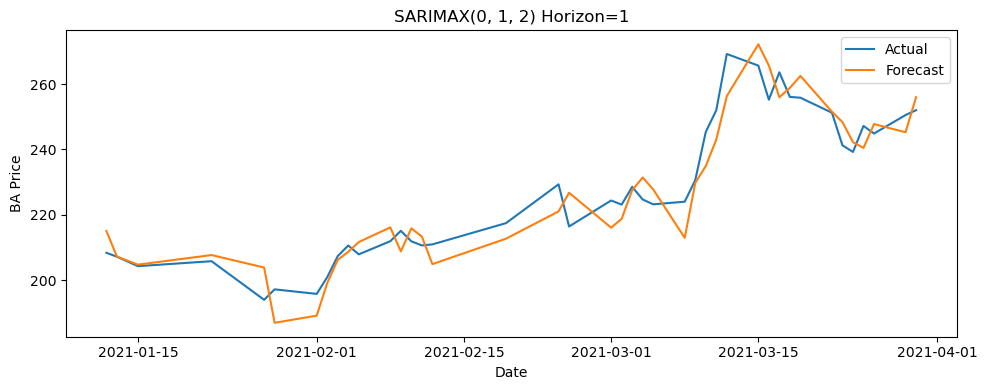

Horizon 1: RMSE=6.41, MAE=5.45, MAPE=2.38


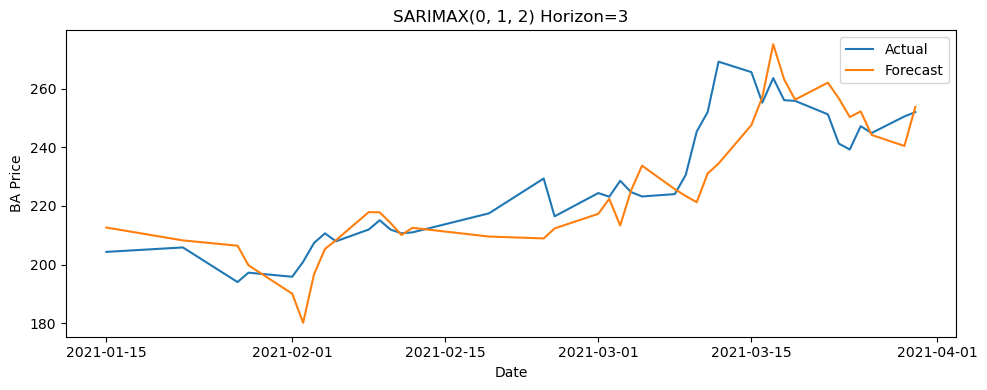

Horizon 3: RMSE=11.53, MAE=8.48, MAPE=3.64


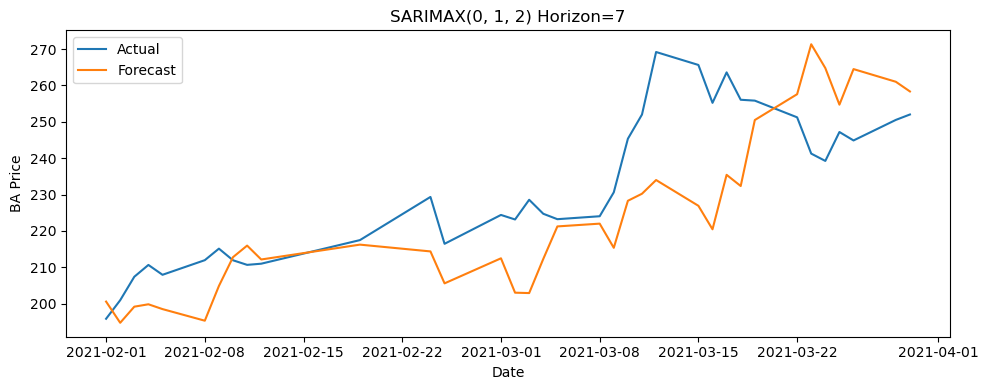

Horizon 7: RMSE=17.71, MAE=14.31, MAPE=5.98

 Metrics saved to: grouped_sarimax_sensible.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(0, 1, 2)",1,6.405792,5.449427,2.384118,"^VIX_lag3,^TNX_lag9,DX-Y.NYB_lag5,JETS_lag6,XL..."
1,"SARIMAX(0, 1, 2)",3,11.529835,8.477144,3.636535,"^VIX_lag3,^TNX_lag9,DX-Y.NYB_lag5,JETS_lag6,XL..."
2,"SARIMAX(0, 1, 2)",7,17.710982,14.310146,5.977446,"^VIX_lag3,^TNX_lag9,DX-Y.NYB_lag5,JETS_lag6,XL..."


In [47]:
# grouped exo variables non-seasonal (sensible lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['BA'],           # original data, with raw BA values
    exog_df=df_diff,        # differenced exogenous variables.. if stationary, not diff-ed 
    exog_lags=exog_lags_sensible,
    model_order=(0, 1, 2),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=None,
    output_csv_path="grouped_sarimax_sensible.csv",
    plot=True,
    append_csv=False
)

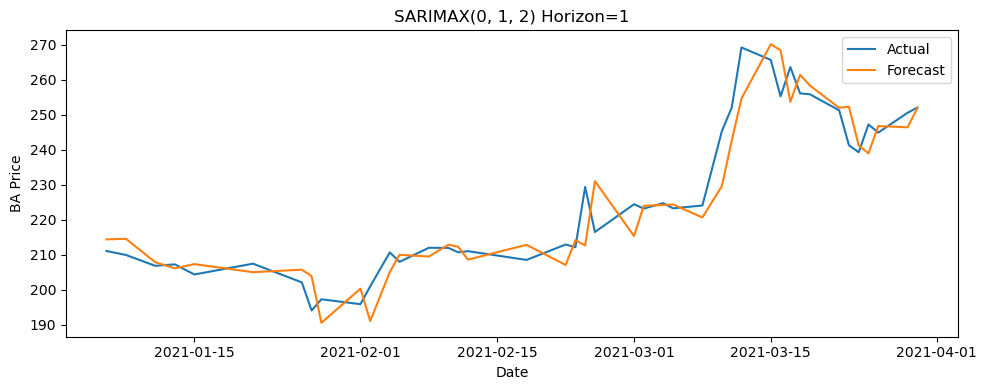

Horizon 1: RMSE=7.08, MAE=5.40, MAPE=2.36


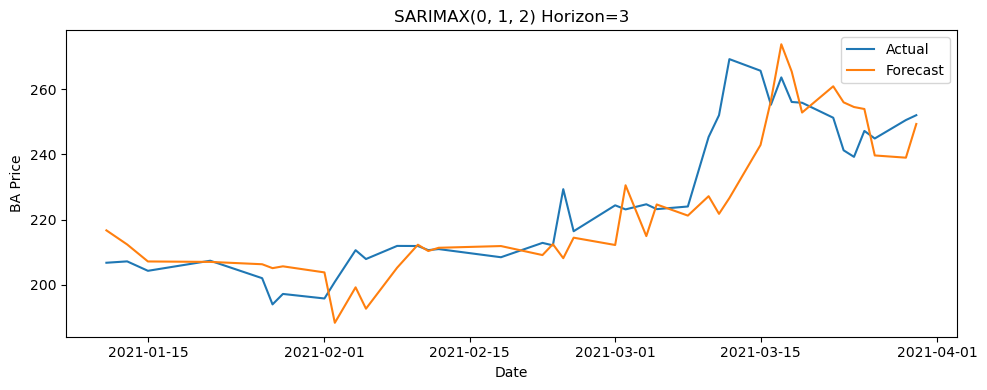

Horizon 3: RMSE=12.54, MAE=9.11, MAPE=3.90


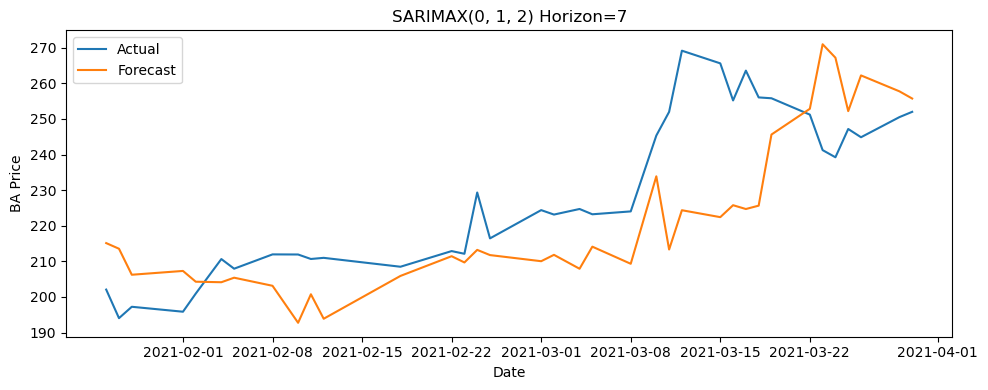

Horizon 7: RMSE=19.61, MAE=15.39, MAPE=6.50

 Metrics saved to: grouped_sarimax_best.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(0, 1, 2)",1,7.082647,5.395572,2.361356,"^VIX_lag4,^TNX_lag9,DX-Y.NYB_lag16,JETS_lag12,..."
1,"SARIMAX(0, 1, 2)",3,12.536818,9.110986,3.903435,"^VIX_lag4,^TNX_lag9,DX-Y.NYB_lag16,JETS_lag12,..."
2,"SARIMAX(0, 1, 2)",7,19.613989,15.385083,6.501656,"^VIX_lag4,^TNX_lag9,DX-Y.NYB_lag16,JETS_lag12,..."


In [48]:
# grouped exo variables non-seasonal (best lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['BA'],           # original, non-differenced target
    exog_df=df_diff,              # differenced/stationary exogenous inputs
    exog_lags=exog_lags_best,     # best lags configuration
    model_order=(0, 1, 2),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=None,
    output_csv_path="grouped_sarimax_best.csv",
    plot=True,
    append_csv=False
)

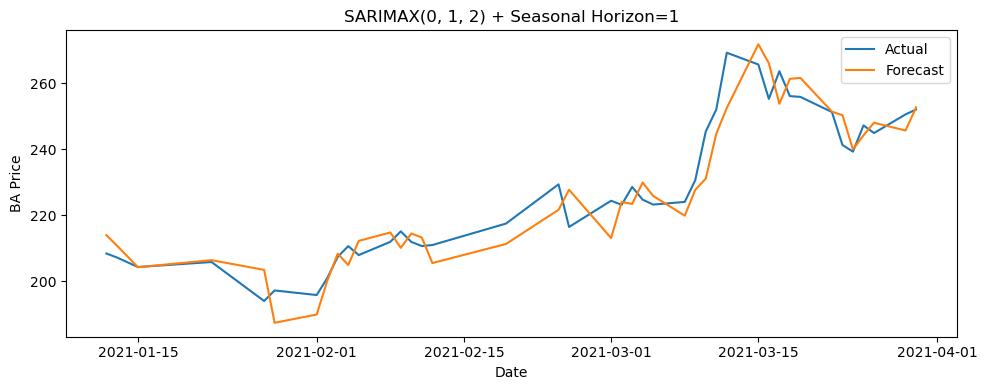

Horizon 1: RMSE=6.64, MAE=5.37, MAPE=2.34


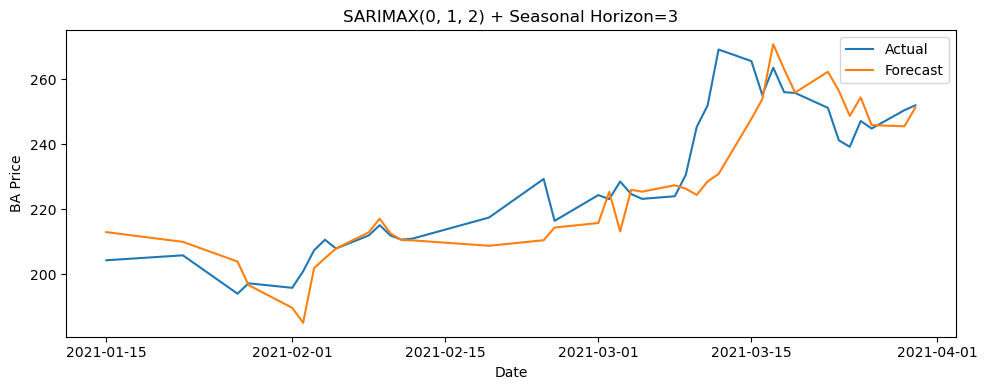

Horizon 3: RMSE=11.02, MAE=7.53, MAPE=3.20


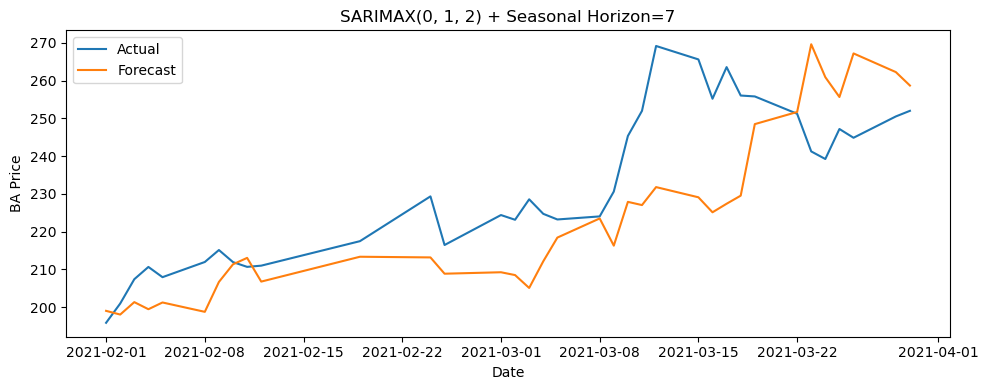

Horizon 7: RMSE=17.63, MAE=13.96, MAPE=5.79

 Metrics saved to: grouped_sarimax_sensible_seasonal.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(0, 1, 2) + Season(1, 0, 1, 30)",1,6.635273,5.369059,2.338475,"^VIX_lag3,^TNX_lag9,DX-Y.NYB_lag5,JETS_lag6,XL..."
1,"SARIMAX(0, 1, 2) + Season(1, 0, 1, 30)",3,11.016513,7.528519,3.199813,"^VIX_lag3,^TNX_lag9,DX-Y.NYB_lag5,JETS_lag6,XL..."
2,"SARIMAX(0, 1, 2) + Season(1, 0, 1, 30)",7,17.631805,13.962550,5.791852,"^VIX_lag3,^TNX_lag9,DX-Y.NYB_lag5,JETS_lag6,XL..."


In [49]:
# grouped exo variables seasonal (sensible lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['BA'],                      # original target, not differenced
    exog_df=df_diff,                         # pre-stationarised exogenous variables
    exog_lags=exog_lags_sensible,
    model_order=(0, 1, 2),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=(1, 0, 1, 30),            # 30-day seasonality
    output_csv_path="grouped_sarimax_sensible_seasonal.csv",
    plot=True,
    append_csv=False
)

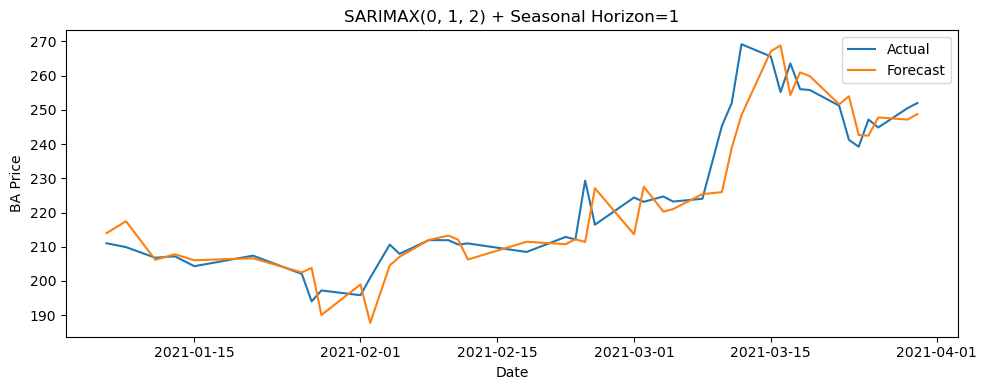

Horizon 1: RMSE=7.85, MAE=5.63, MAPE=2.44


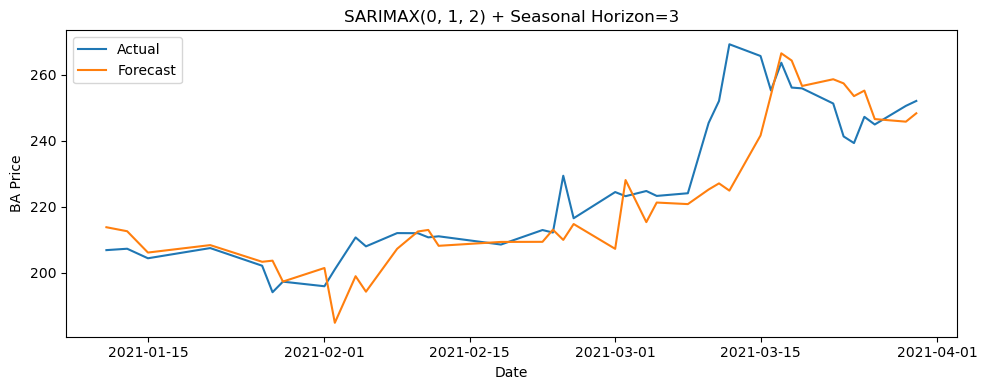

Horizon 3: RMSE=12.17, MAE=8.23, MAPE=3.51


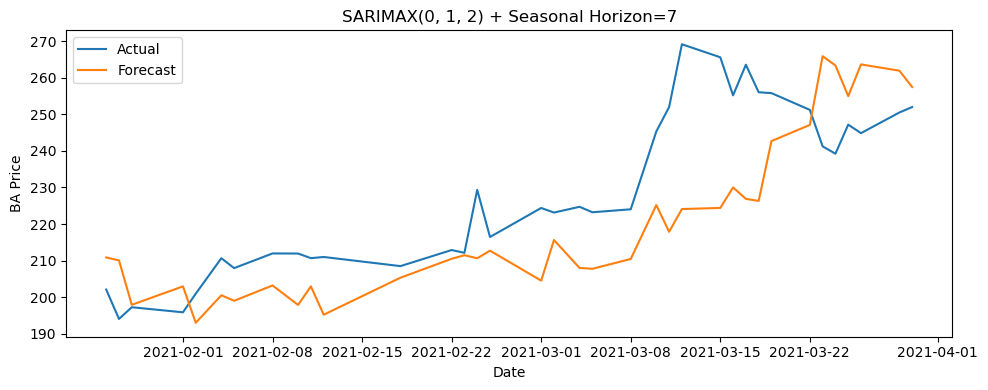

Horizon 7: RMSE=18.91, MAE=15.27, MAPE=6.42

 Metrics saved to: grouped_sarimax_best_seasonal.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(0, 1, 2) + Season(1, 0, 1, 30)",1,7.854237,5.633221,2.441567,"^VIX_lag4,^TNX_lag9,DX-Y.NYB_lag16,JETS_lag12,..."
1,"SARIMAX(0, 1, 2) + Season(1, 0, 1, 30)",3,12.168874,8.228148,3.513334,"^VIX_lag4,^TNX_lag9,DX-Y.NYB_lag16,JETS_lag12,..."
2,"SARIMAX(0, 1, 2) + Season(1, 0, 1, 30)",7,18.913271,15.267641,6.421619,"^VIX_lag4,^TNX_lag9,DX-Y.NYB_lag16,JETS_lag12,..."


In [50]:
# grouped exo variables seasonal (best lags)
rolling_forecast_sarimax_with_metrics(
    target_df=df['BA'],                      # original (non-differenced) target
    exog_df=df_diff,                         # differenced/stationary exogenous inputs
    exog_lags=exog_lags_best,
    model_order=(0, 1, 2),
    forecast_horizons=[1, 3, 7],
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    seasonal_order=(1, 0, 1, 30),
    output_csv_path="grouped_sarimax_best_seasonal.csv",
    plot=True,
    append_csv=False
)

### Evaluation exo variables individually

In [52]:
# One-by-one exogenous variable SARIMAX evaluation with metrics + seasonal + plots + CSV
def evaluate_single_exog_var_with_metrics(
    target_df,                  # original data, raw BA
    exog_df,                    # differenced/stationary exogenous input
    var_name,
    lag,
    model_order,
    forecast_horizons,
    train_end_date,
    test_start_date,
    output_csv_path,
    seasonal_order=None,
    append_csv=True,
    plot=True
):
    target_df = target_df.copy()
    target_df.index = pd.to_datetime(target_df.index)
    target_df = target_df.asfreq('B')

    exog_df = exog_df.copy()
    exog_df.index = pd.to_datetime(exog_df.index)
    exog_df = exog_df.asfreq('B')

    lagged_col = f'{var_name}_lag{lag}'
    exog_df[lagged_col] = exog_df[var_name].shift(lag)
    exog_df.dropna(inplace=True)

    exog = exog_df[[lagged_col]]
    target = target_df['BA'].loc[exog_df.index]  # align with lagged exog

    train_y = target[target.index <= train_end_date]
    test_y = target[target.index >= test_start_date]
    train_X = exog[exog.index <= train_end_date]
    test_X = exog[exog.index >= test_start_date]

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(0, len(test_y) - h + 1):
            y_train = pd.concat([train_y, test_y.iloc[:i]])
            X_train = pd.concat([train_X, test_X.iloc[:i]])
            X_forecast = test_X.iloc[i:i + h]

            try:
                model = SARIMAX(
                    y_train,
                    exog=X_train,
                    order=model_order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                results = model.fit(disp=False)
                forecast = results.get_forecast(steps=h, exog=X_forecast)
                pred = forecast.predicted_mean.iloc[-1]
                actual = test_y.iloc[i + h - 1]

                if not np.isnan(pred) and not np.isnan(actual):
                    preds.append(pred)
                    actuals.append(actual)
                    dates.append(test_y.index[i + h - 1])
            except:
                continue

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"{var_name} (lag={lag}) - Horizon {h} | RMSE: {rmse:.2f}, MAE: {mae:.2f}, MAPE: {mape:.2f}%")

            all_metrics.append({
                'model': f"SARIMAX{model_order}" + (f" + Season{seasonal_order}" if seasonal_order else ""),
                'exog_var': var_name,
                'lag': lag,
                'horizon': h,
                'rmse': rmse,
                'mae': mae,
                'mape': mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label='Actual')
                plt.plot(dates, preds, label='Forecast')
                plt.title(f"{var_name} (lag={lag}) Horizon={h}{' + Seasonal' if seasonal_order else ''}")
                plt.xlabel("Date")
                plt.ylabel("BA Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    df_metrics = pd.DataFrame(all_metrics)
    if append_csv and os.path.exists(output_csv_path):
        df_existing = pd.read_csv(output_csv_path)
        df_combined = pd.concat([df_existing, df_metrics], ignore_index=True)
        df_combined.to_csv(output_csv_path, index=False)
    else:
        df_metrics.to_csv(output_csv_path, index=False)

    print(f"\n Metrics for {var_name} saved to: {output_csv_path}")
    return df_metrics

^VIX (lag=3) - Horizon 1 | RMSE: 6.60, MAE: 5.27, MAPE: 2.34%


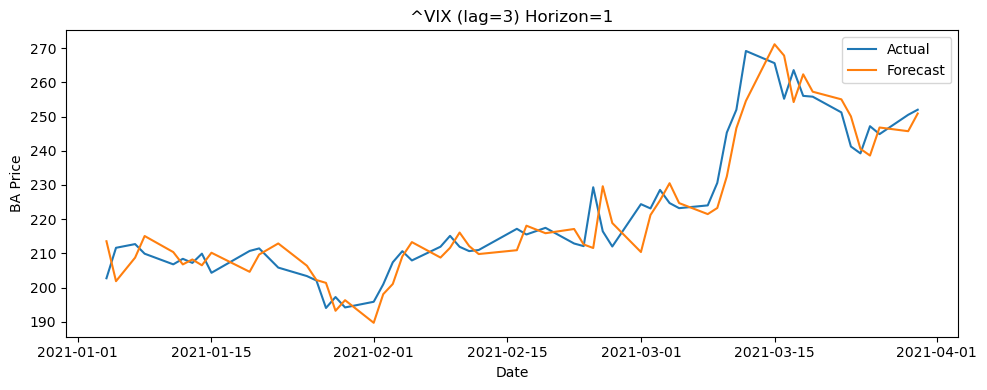

^VIX (lag=3) - Horizon 3 | RMSE: 10.59, MAE: 8.01, MAPE: 3.50%


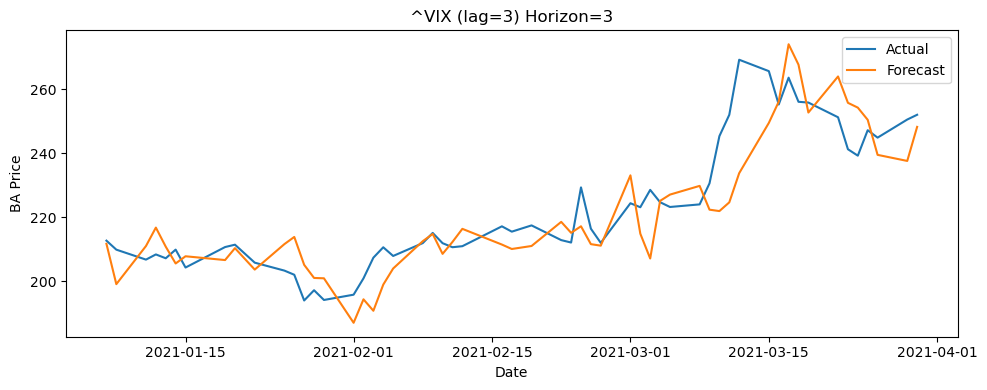

^VIX (lag=3) - Horizon 7 | RMSE: 16.43, MAE: 12.72, MAPE: 5.49%


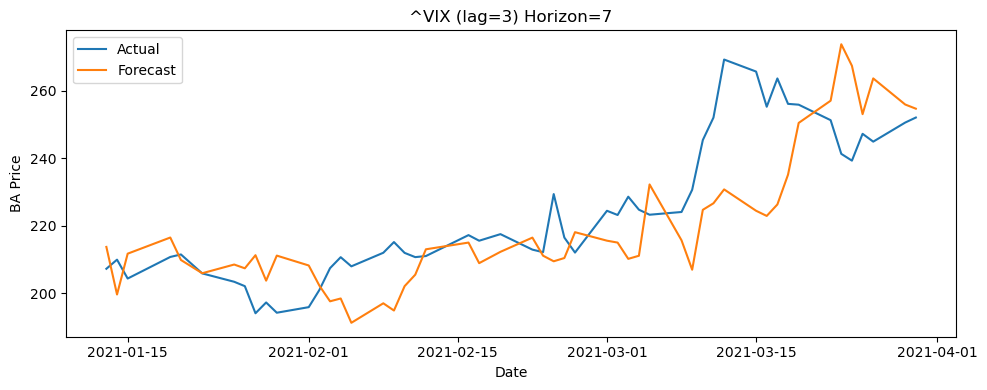


 Metrics for ^VIX saved to: exo_eval_sensible.csv
^TNX (lag=9) - Horizon 1 | RMSE: 6.52, MAE: 5.16, MAPE: 2.29%


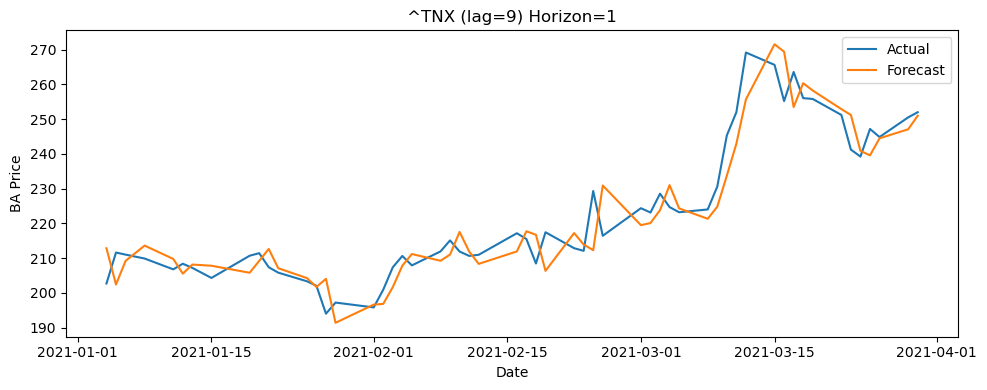

^TNX (lag=9) - Horizon 3 | RMSE: 10.54, MAE: 7.96, MAPE: 3.45%


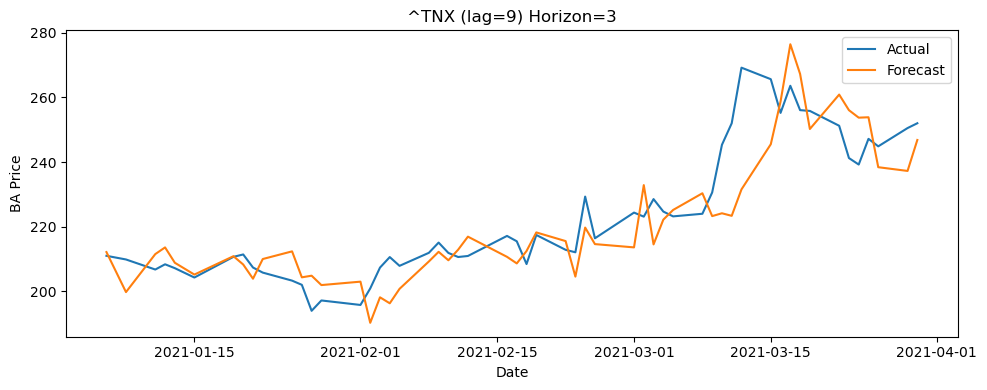

^TNX (lag=9) - Horizon 7 | RMSE: 16.27, MAE: 12.07, MAPE: 5.15%


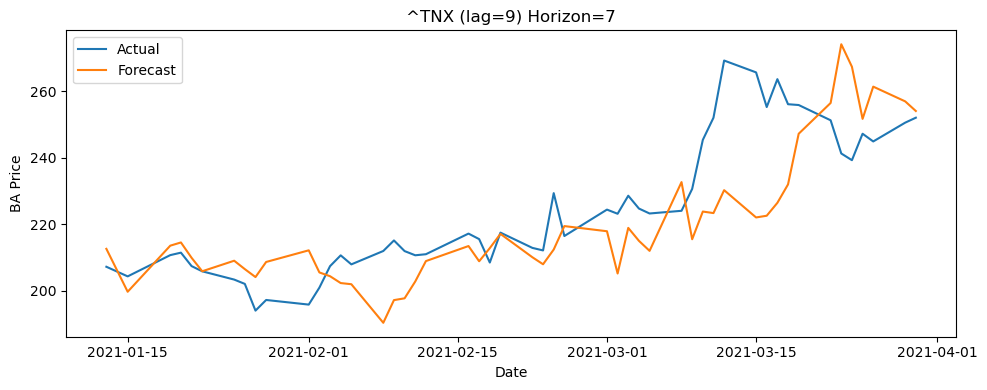


 Metrics for ^TNX saved to: exo_eval_sensible.csv
DX-Y.NYB (lag=5) - Horizon 1 | RMSE: 6.74, MAE: 5.53, MAPE: 2.47%


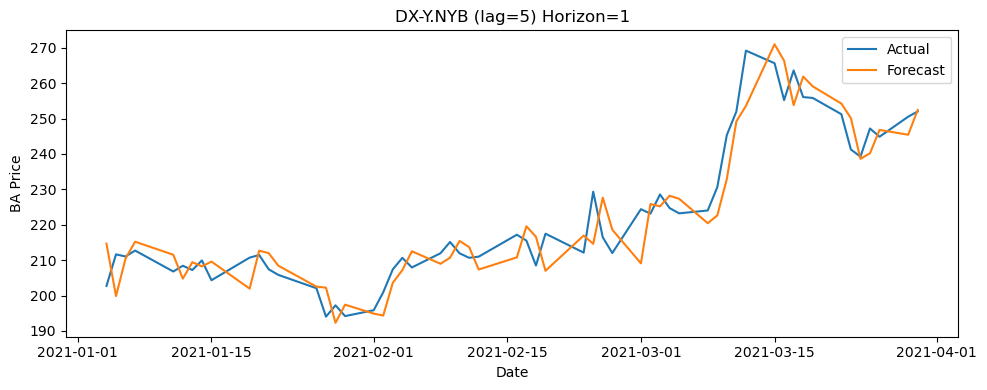

DX-Y.NYB (lag=5) - Horizon 3 | RMSE: 10.66, MAE: 8.06, MAPE: 3.52%


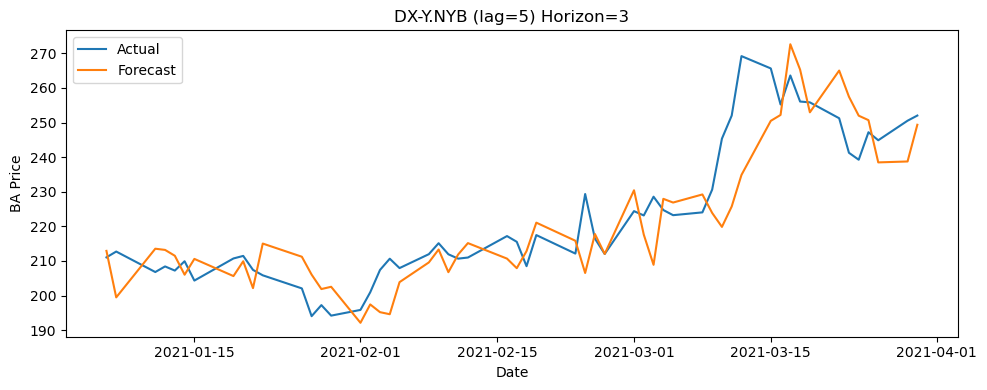

DX-Y.NYB (lag=5) - Horizon 7 | RMSE: 16.69, MAE: 12.80, MAPE: 5.53%


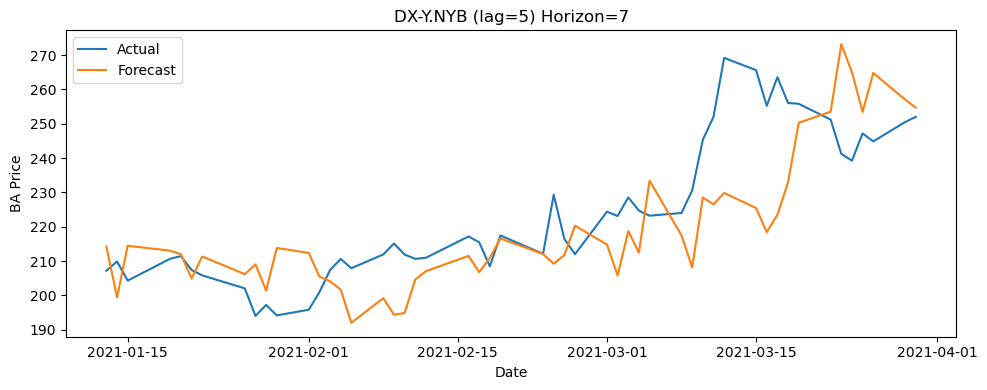


 Metrics for DX-Y.NYB saved to: exo_eval_sensible.csv
JETS (lag=6) - Horizon 1 | RMSE: 6.53, MAE: 5.21, MAPE: 2.31%


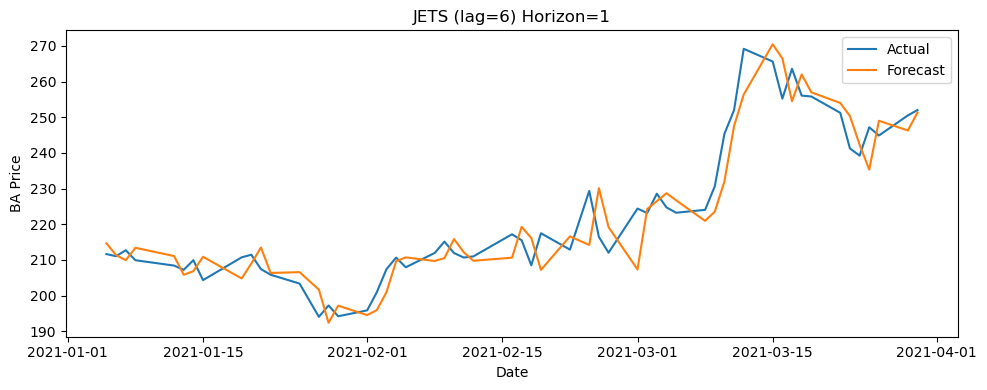

JETS (lag=6) - Horizon 3 | RMSE: 10.89, MAE: 7.78, MAPE: 3.38%


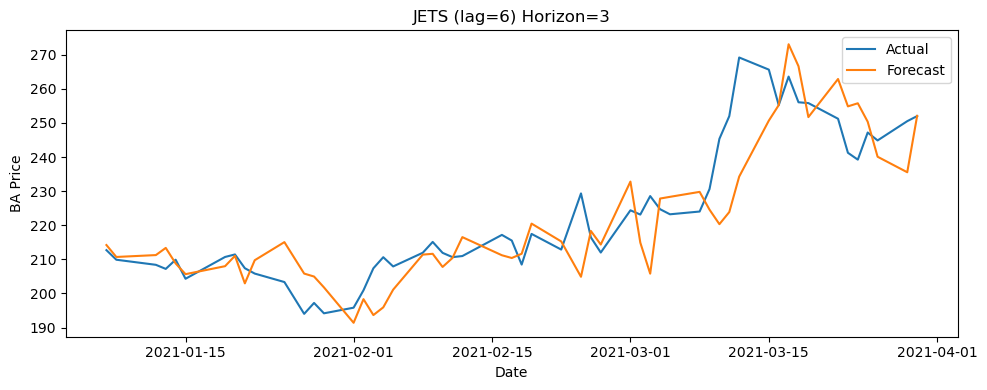

JETS (lag=6) - Horizon 7 | RMSE: 16.86, MAE: 12.85, MAPE: 5.54%


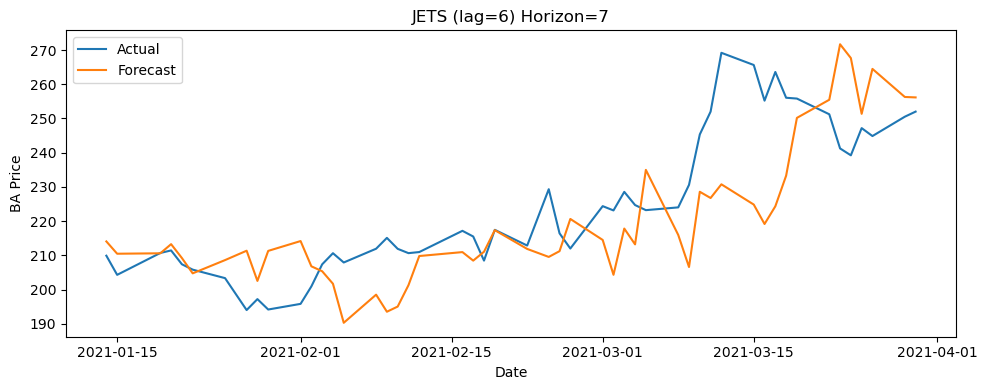


 Metrics for JETS saved to: exo_eval_sensible.csv
XLI (lag=1) - Horizon 1 | RMSE: 6.49, MAE: 5.02, MAPE: 2.22%


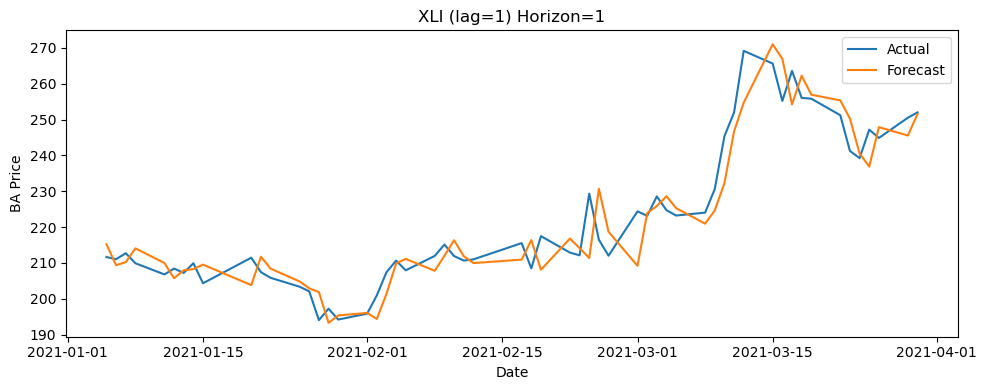

XLI (lag=1) - Horizon 3 | RMSE: 10.42, MAE: 7.59, MAPE: 3.30%


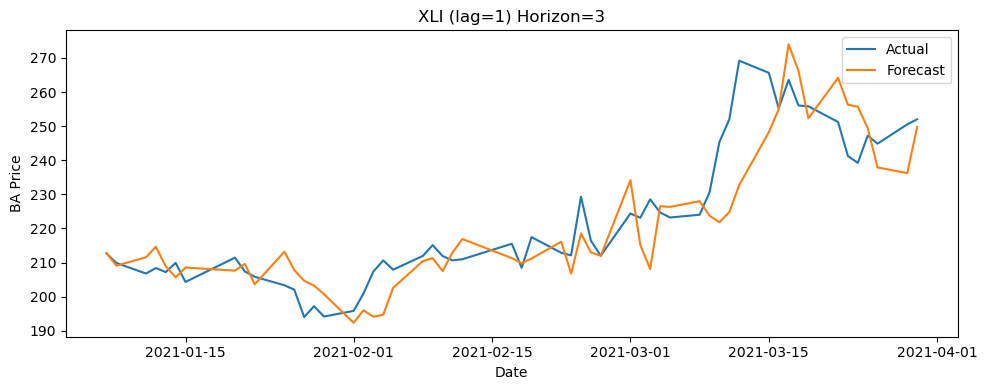

XLI (lag=1) - Horizon 7 | RMSE: 16.71, MAE: 12.63, MAPE: 5.44%


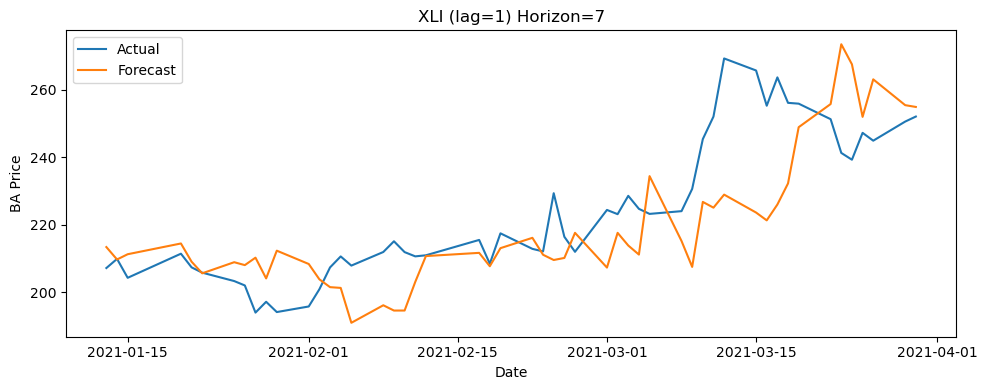


 Metrics for XLI saved to: exo_eval_sensible.csv
IYT (lag=2) - Horizon 1 | RMSE: 6.89, MAE: 5.35, MAPE: 2.38%


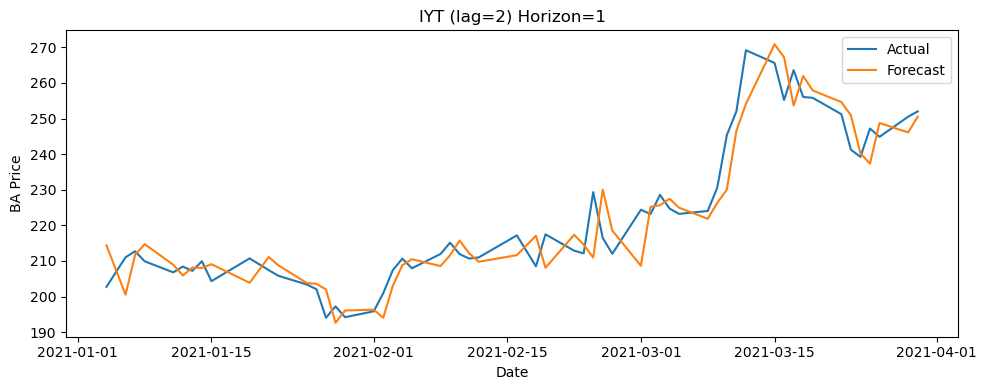

IYT (lag=2) - Horizon 3 | RMSE: 10.13, MAE: 7.27, MAPE: 3.16%


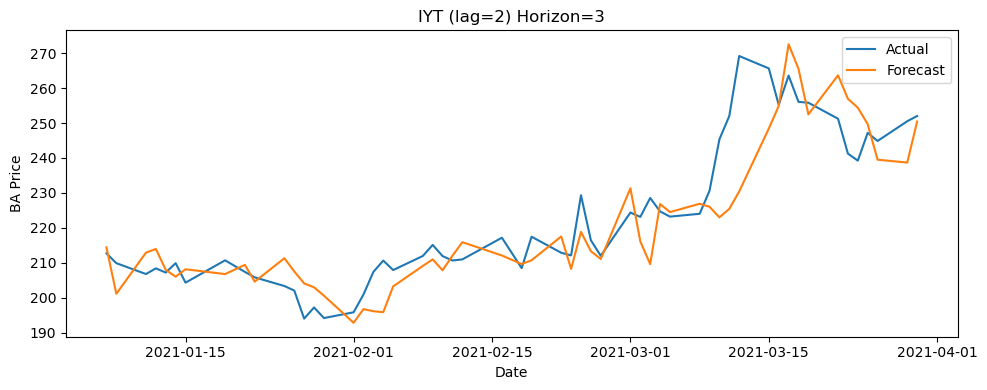

IYT (lag=2) - Horizon 7 | RMSE: 16.45, MAE: 12.49, MAPE: 5.37%


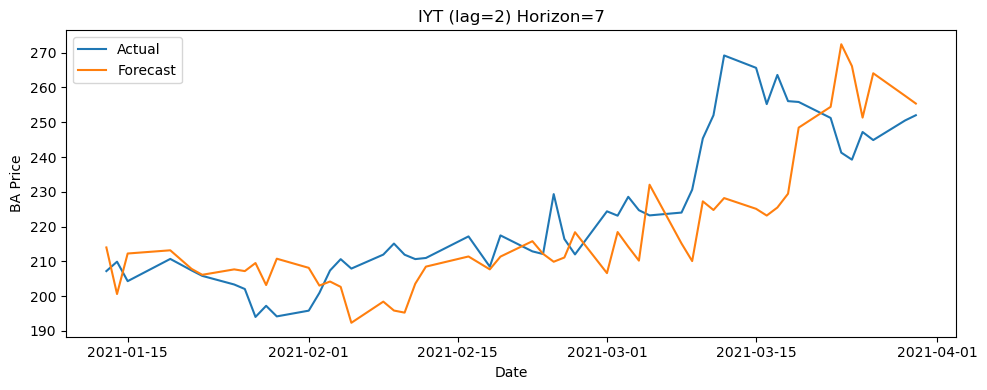


 Metrics for IYT saved to: exo_eval_sensible.csv


In [53]:
for var, lag in exog_lags_sensible.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original BA data
        exog_df=df_diff,                # stationary exog inputs
        var_name=var,
        lag=lag,
        model_order=(0, 1, 2),
        forecast_horizons=[1, 3, 7],
        train_end_date="2020-12-31",
        test_start_date="2021-01-01",
        output_csv_path="exo_eval_sensible.csv",
        seasonal_order=None,
        append_csv=True,
        plot=True
    )

^VIX (lag=4) - Horizon 1 | RMSE: 6.81, MAE: 5.33, MAPE: 2.37%


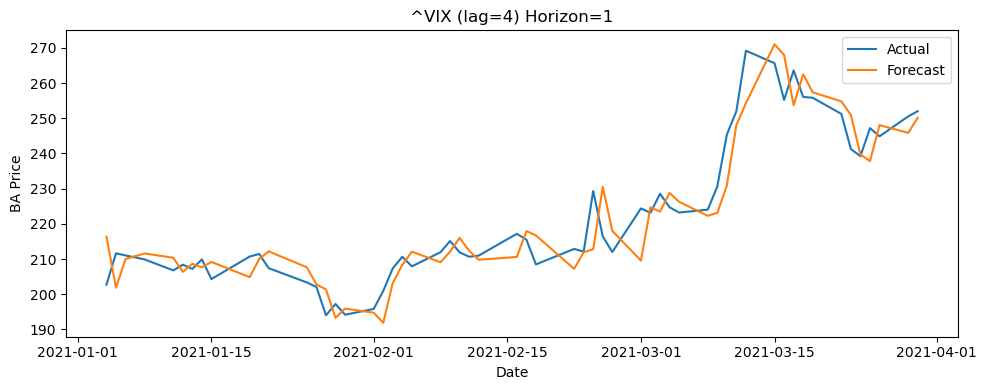

^VIX (lag=4) - Horizon 3 | RMSE: 11.07, MAE: 8.17, MAPE: 3.57%


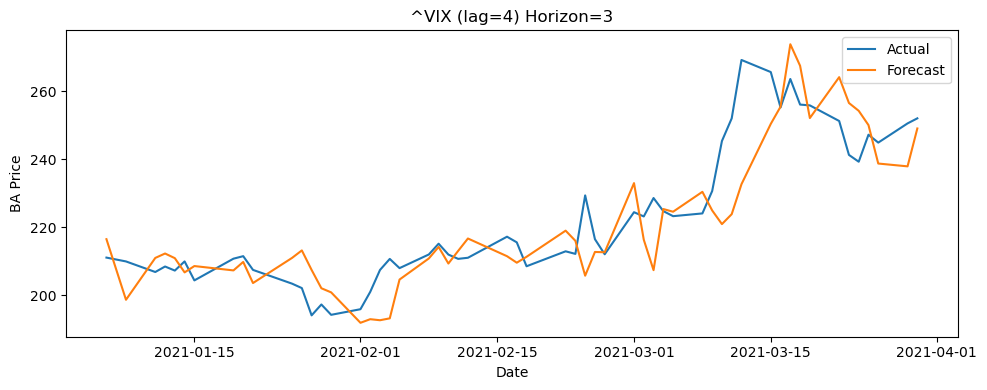

^VIX (lag=4) - Horizon 7 | RMSE: 16.90, MAE: 13.10, MAPE: 5.67%


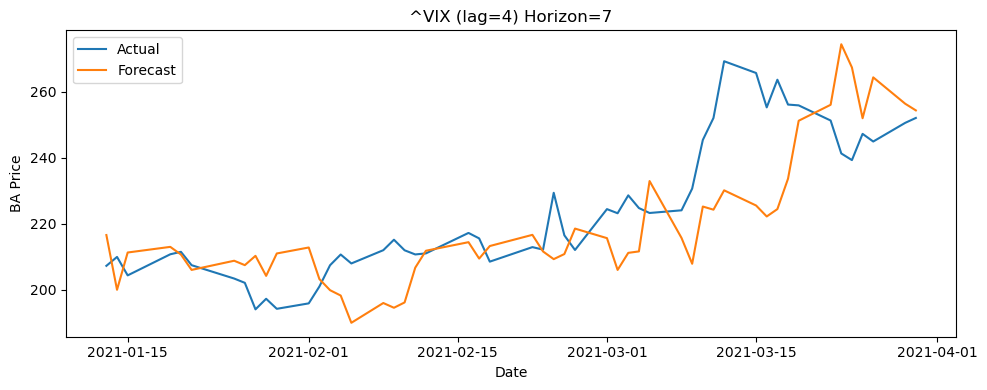


 Metrics for ^VIX saved to: exo_eval_best.csv
^TNX (lag=9) - Horizon 1 | RMSE: 6.52, MAE: 5.16, MAPE: 2.29%


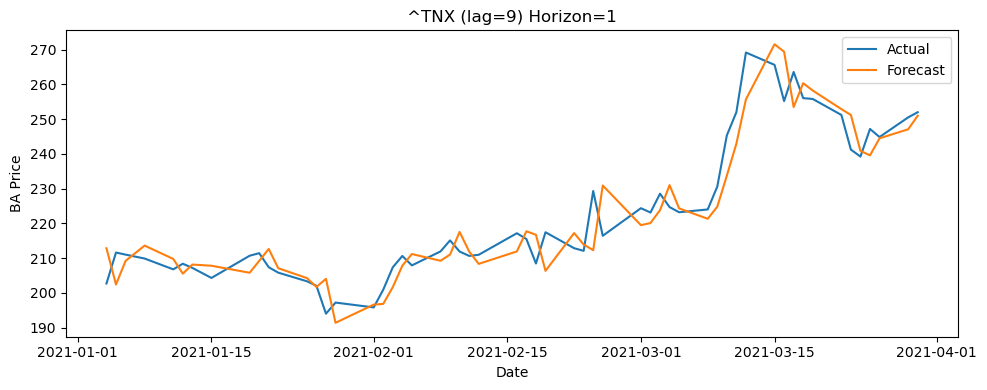

^TNX (lag=9) - Horizon 3 | RMSE: 10.54, MAE: 7.96, MAPE: 3.45%


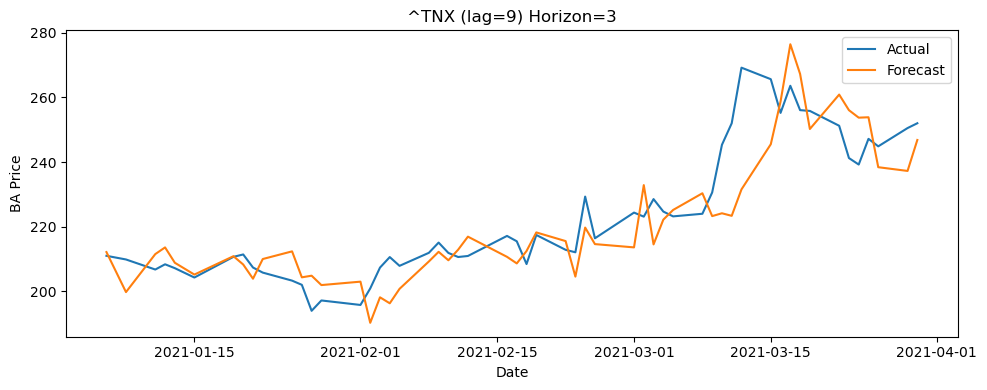

^TNX (lag=9) - Horizon 7 | RMSE: 16.27, MAE: 12.07, MAPE: 5.15%


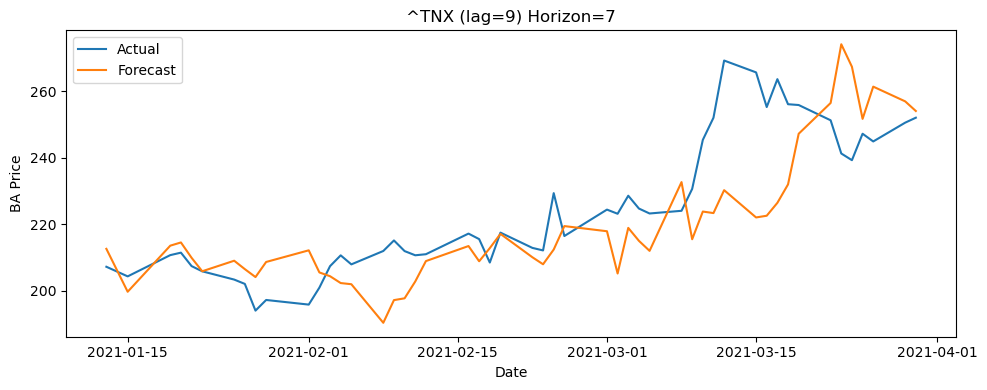


 Metrics for ^TNX saved to: exo_eval_best.csv
DX-Y.NYB (lag=16) - Horizon 1 | RMSE: 7.22, MAE: 5.41, MAPE: 2.40%


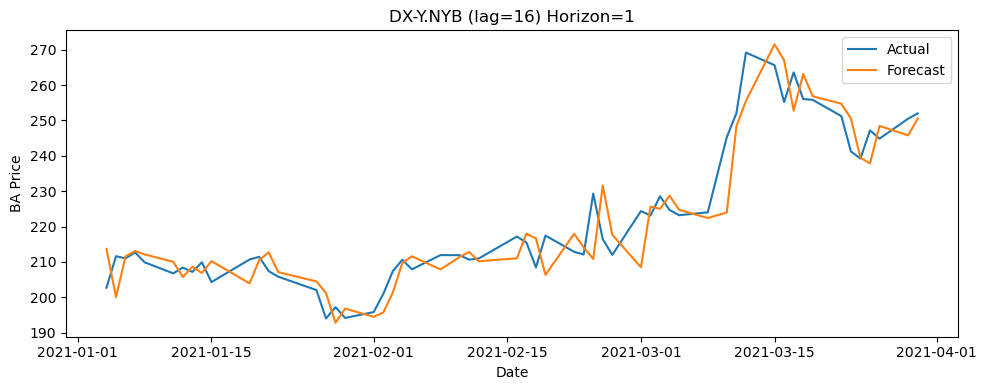

DX-Y.NYB (lag=16) - Horizon 3 | RMSE: 11.08, MAE: 7.89, MAPE: 3.43%


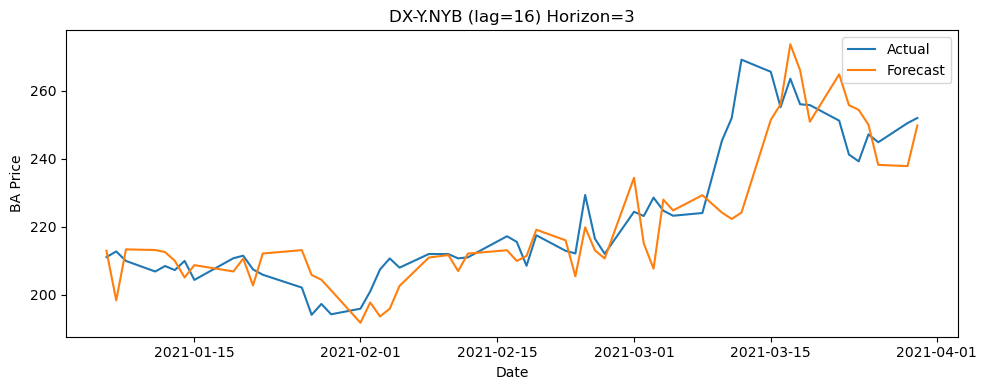

DX-Y.NYB (lag=16) - Horizon 7 | RMSE: 17.23, MAE: 12.79, MAPE: 5.51%


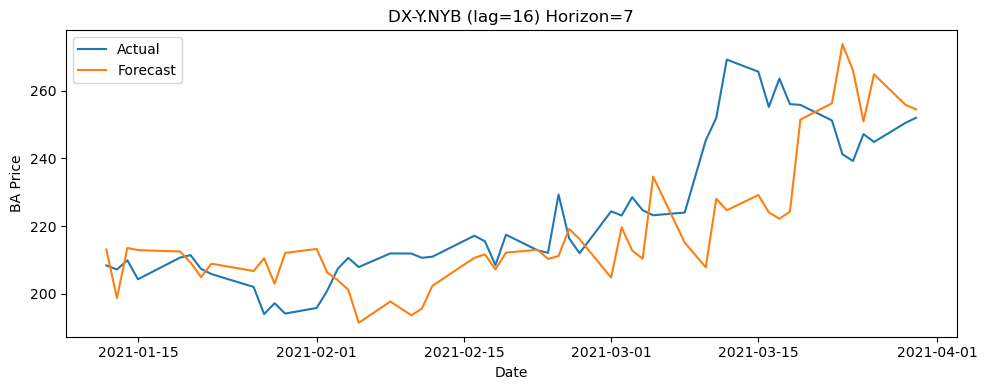


 Metrics for DX-Y.NYB saved to: exo_eval_best.csv
JETS (lag=12) - Horizon 1 | RMSE: 6.81, MAE: 5.25, MAPE: 2.33%


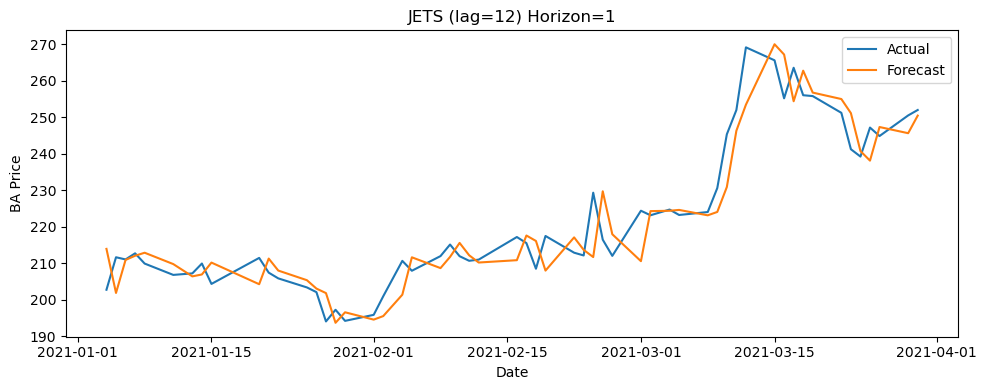

JETS (lag=12) - Horizon 3 | RMSE: 10.36, MAE: 7.54, MAPE: 3.28%


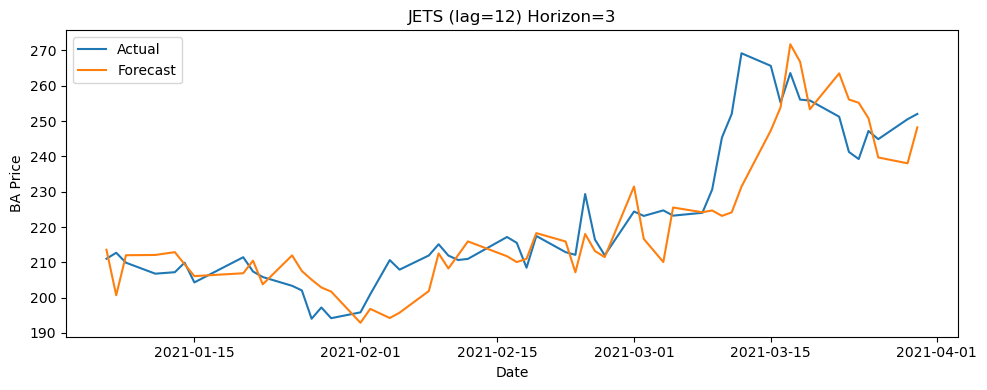

JETS (lag=12) - Horizon 7 | RMSE: 17.21, MAE: 12.96, MAPE: 5.57%


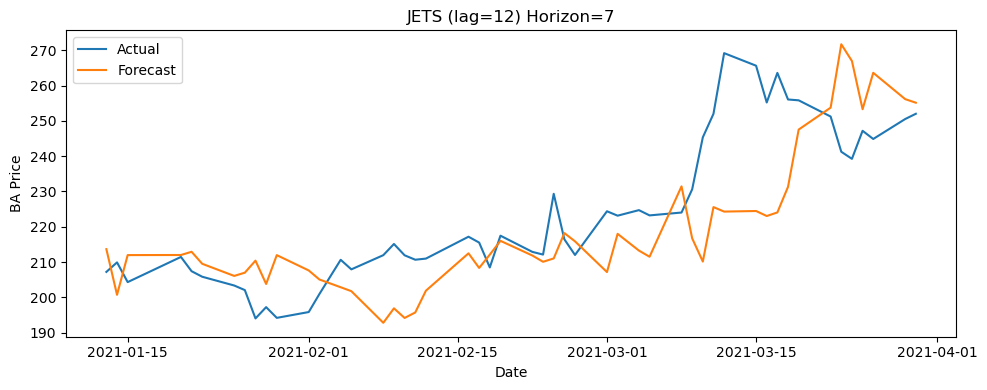


 Metrics for JETS saved to: exo_eval_best.csv
XLI (lag=1) - Horizon 1 | RMSE: 6.49, MAE: 5.02, MAPE: 2.22%


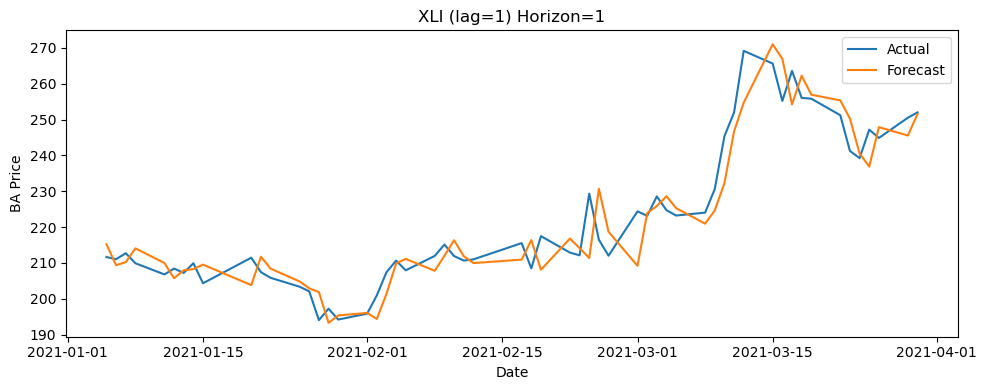

XLI (lag=1) - Horizon 3 | RMSE: 10.42, MAE: 7.59, MAPE: 3.30%


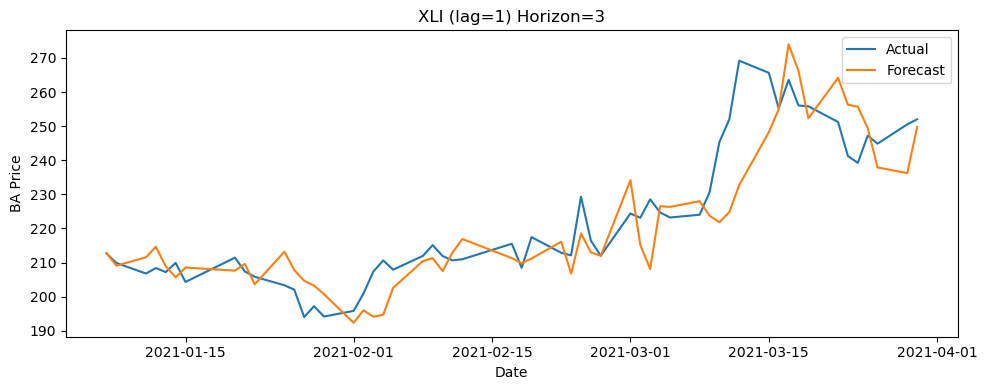

XLI (lag=1) - Horizon 7 | RMSE: 16.71, MAE: 12.63, MAPE: 5.44%


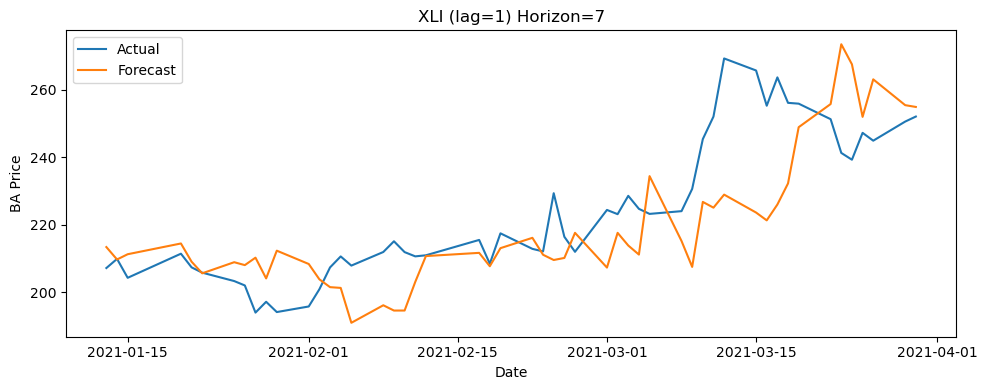


 Metrics for XLI saved to: exo_eval_best.csv
IYT (lag=2) - Horizon 1 | RMSE: 6.89, MAE: 5.35, MAPE: 2.38%


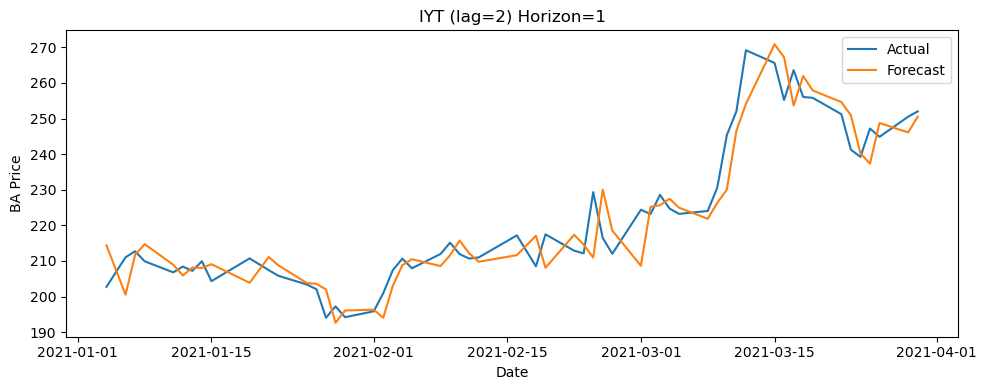

IYT (lag=2) - Horizon 3 | RMSE: 10.13, MAE: 7.27, MAPE: 3.16%


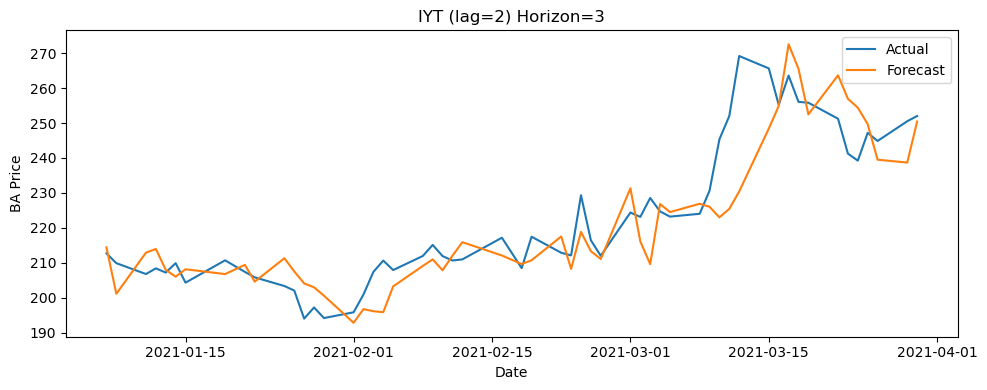

IYT (lag=2) - Horizon 7 | RMSE: 16.45, MAE: 12.49, MAPE: 5.37%


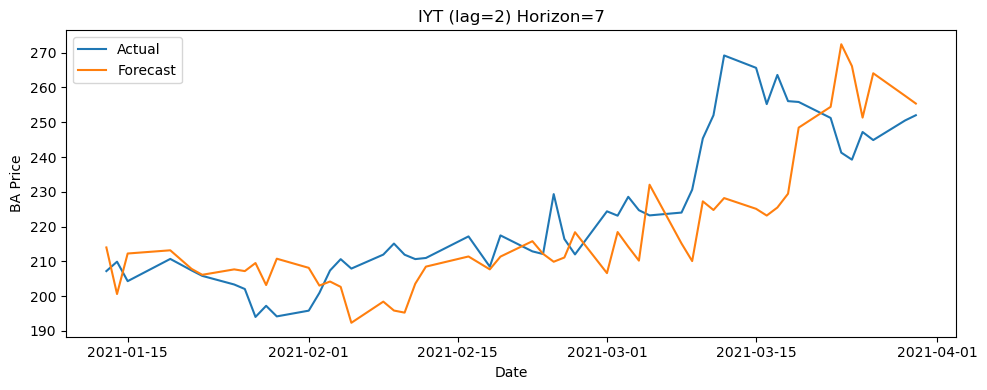


 Metrics for IYT saved to: exo_eval_best.csv


In [54]:
# with "best" lags
for var, lag in exog_lags_best.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original target (non-differenced)
        exog_df=df_diff,                # stationary/differenced exogenous inputs
        var_name=var,
        lag=lag,
        model_order=(0, 1, 2),
        forecast_horizons=[1, 3, 7],
        train_end_date="2020-12-31",
        test_start_date="2021-01-01",
        output_csv_path="exo_eval_best.csv",
        seasonal_order=None,
        append_csv=True,
        plot=True
    )

### Evaluating individual exo variables SARIMAX

^VIX (lag=3) - Horizon 1 | RMSE: 6.79, MAE: 5.50, MAPE: 2.45%


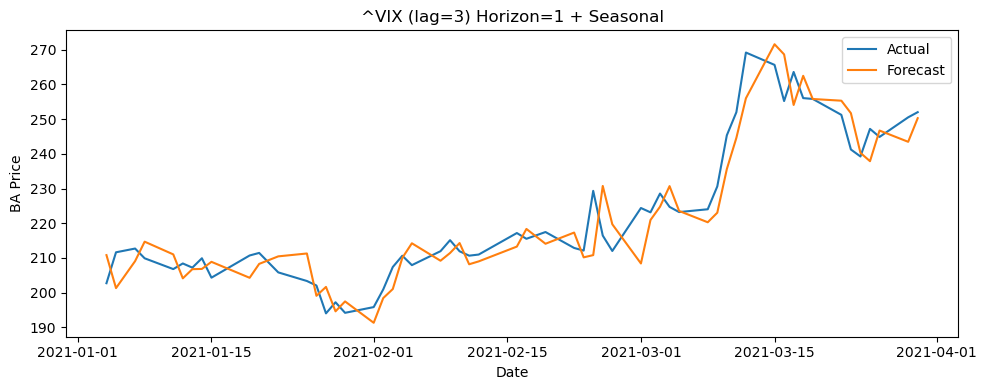

^VIX (lag=3) - Horizon 3 | RMSE: 10.85, MAE: 8.42, MAPE: 3.67%


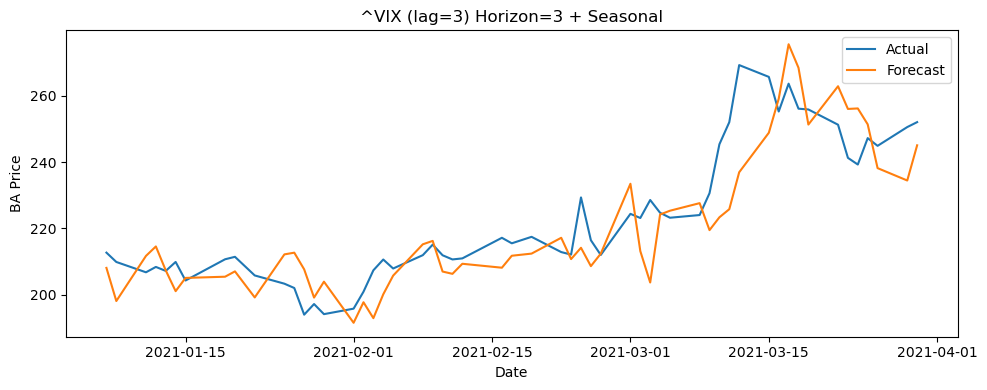

^VIX (lag=3) - Horizon 7 | RMSE: 16.77, MAE: 13.15, MAPE: 5.69%


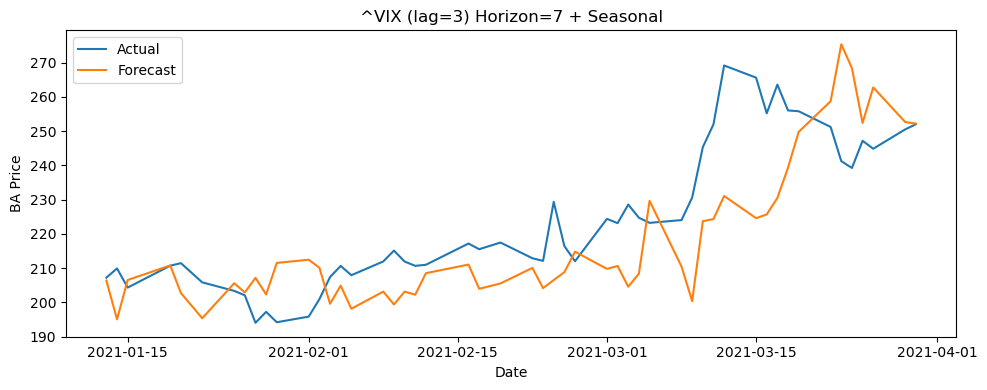


 Metrics for ^VIX saved to: exo_eval_sensible_seasonal.csv
^TNX (lag=9) - Horizon 1 | RMSE: 6.74, MAE: 5.25, MAPE: 2.33%


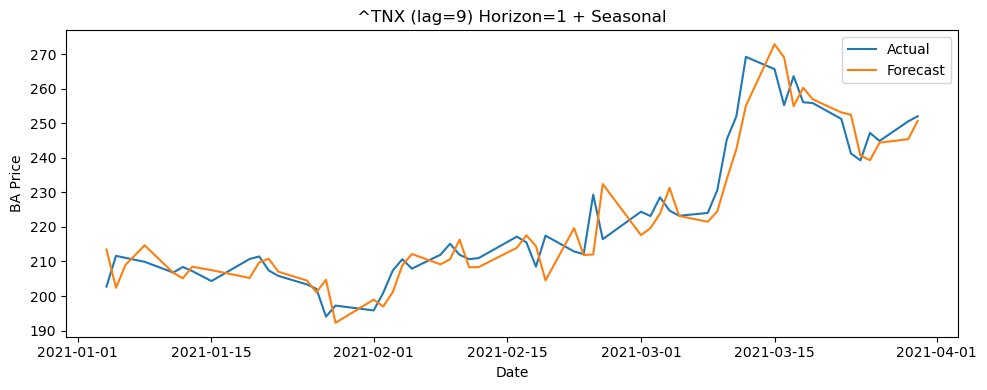

^TNX (lag=9) - Horizon 3 | RMSE: 10.65, MAE: 7.87, MAPE: 3.39%


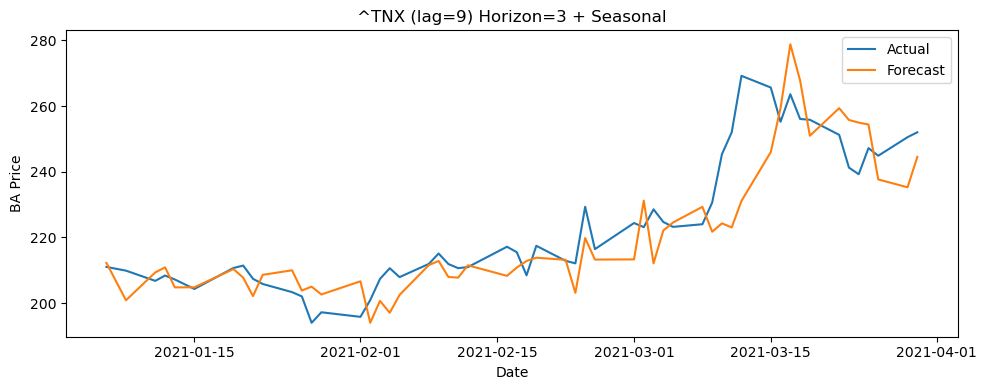

^TNX (lag=9) - Horizon 7 | RMSE: 16.48, MAE: 12.23, MAPE: 5.22%


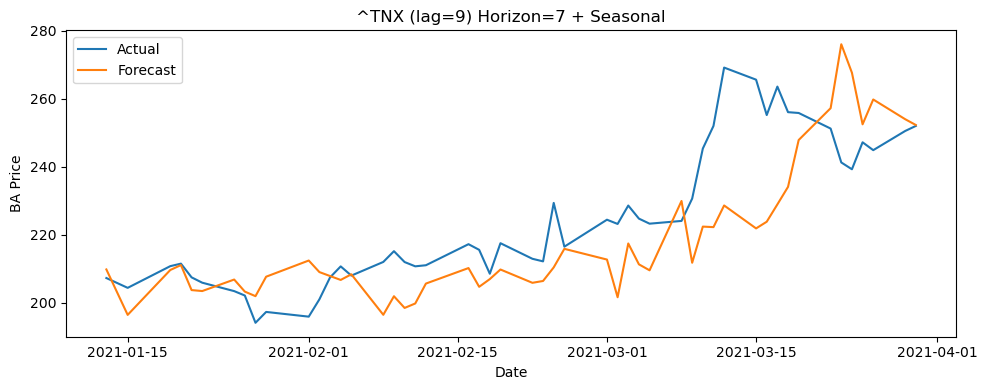


 Metrics for ^TNX saved to: exo_eval_sensible_seasonal.csv
DX-Y.NYB (lag=5) - Horizon 1 | RMSE: 6.77, MAE: 5.40, MAPE: 2.41%


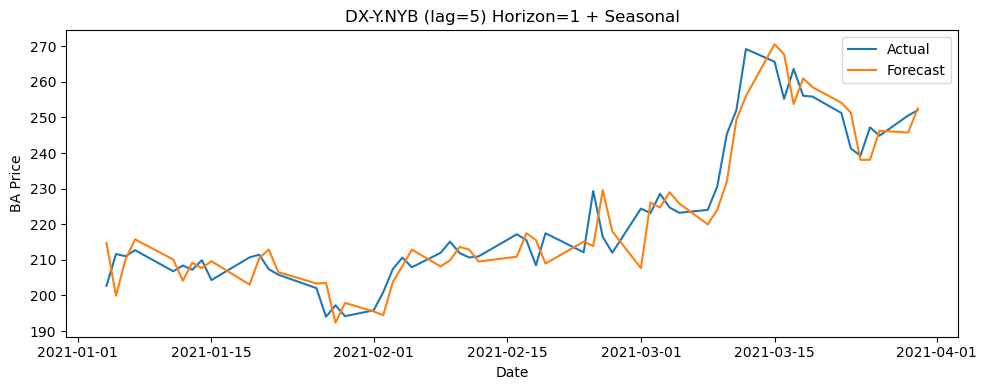

DX-Y.NYB (lag=5) - Horizon 3 | RMSE: 10.68, MAE: 7.95, MAPE: 3.47%


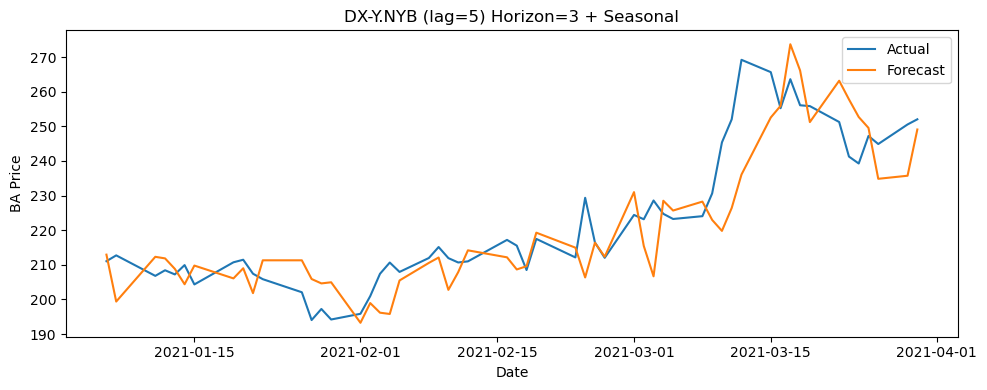

DX-Y.NYB (lag=5) - Horizon 7 | RMSE: 16.47, MAE: 12.75, MAPE: 5.53%


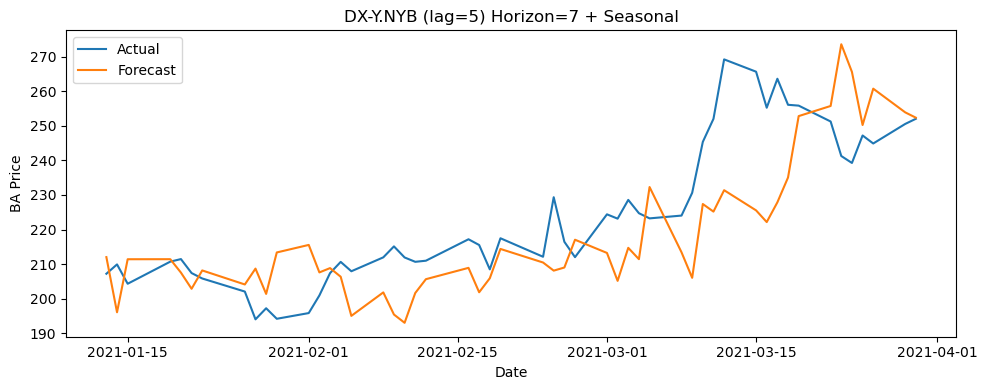


 Metrics for DX-Y.NYB saved to: exo_eval_sensible_seasonal.csv
JETS (lag=6) - Horizon 1 | RMSE: 6.54, MAE: 5.04, MAPE: 2.23%


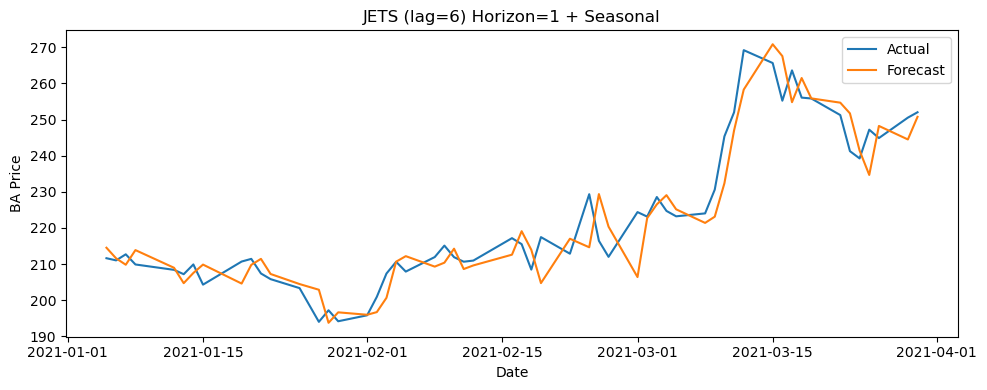

JETS (lag=6) - Horizon 3 | RMSE: 11.12, MAE: 7.99, MAPE: 3.46%


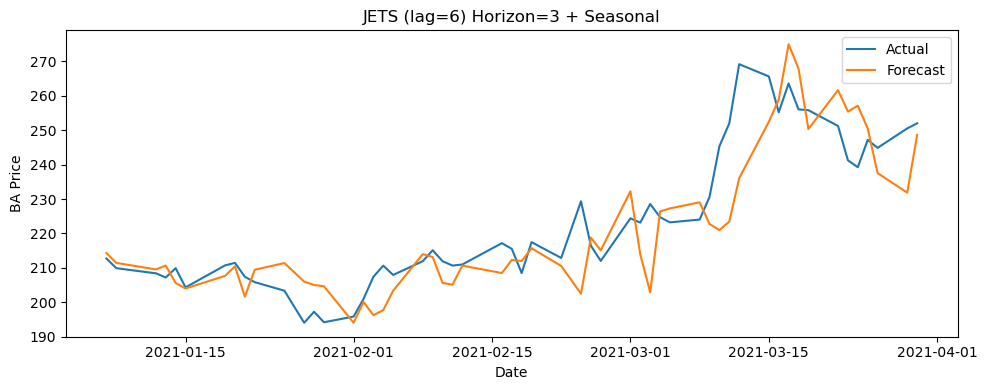

JETS (lag=6) - Horizon 7 | RMSE: 16.85, MAE: 13.05, MAPE: 5.64%


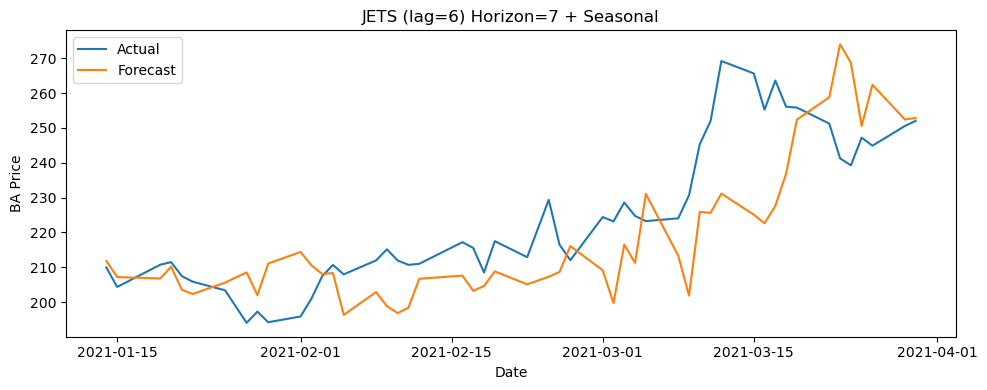


 Metrics for JETS saved to: exo_eval_sensible_seasonal.csv
XLI (lag=1) - Horizon 1 | RMSE: 6.70, MAE: 5.14, MAPE: 2.28%


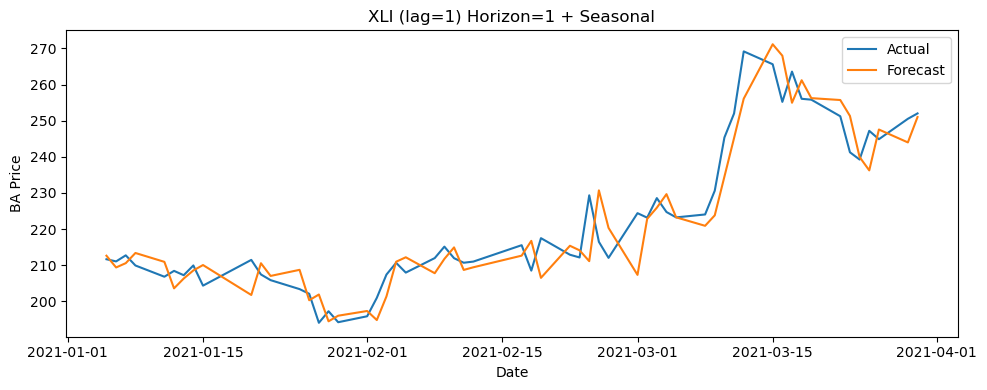

XLI (lag=1) - Horizon 3 | RMSE: 10.70, MAE: 7.92, MAPE: 3.44%


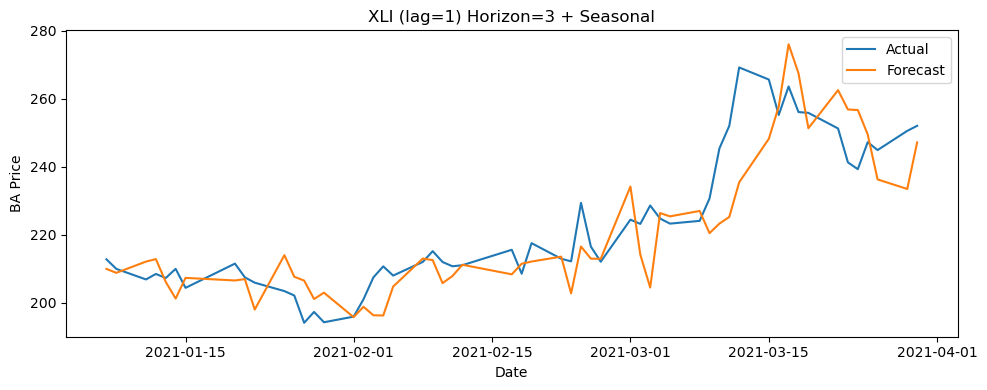

XLI (lag=1) - Horizon 7 | RMSE: 16.81, MAE: 12.95, MAPE: 5.59%


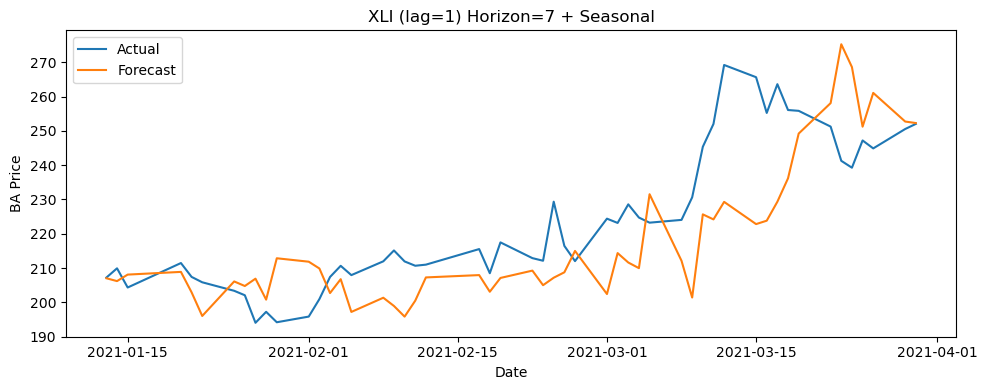


 Metrics for XLI saved to: exo_eval_sensible_seasonal.csv
IYT (lag=2) - Horizon 1 | RMSE: 6.94, MAE: 5.35, MAPE: 2.38%


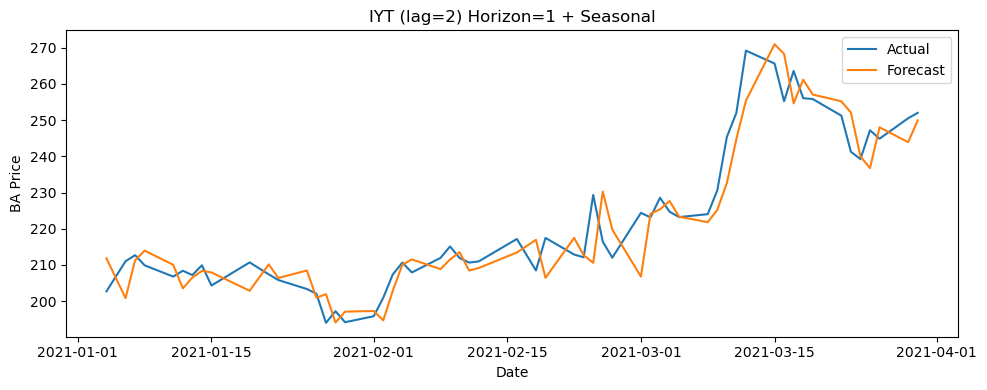

IYT (lag=2) - Horizon 3 | RMSE: 10.42, MAE: 7.67, MAPE: 3.33%


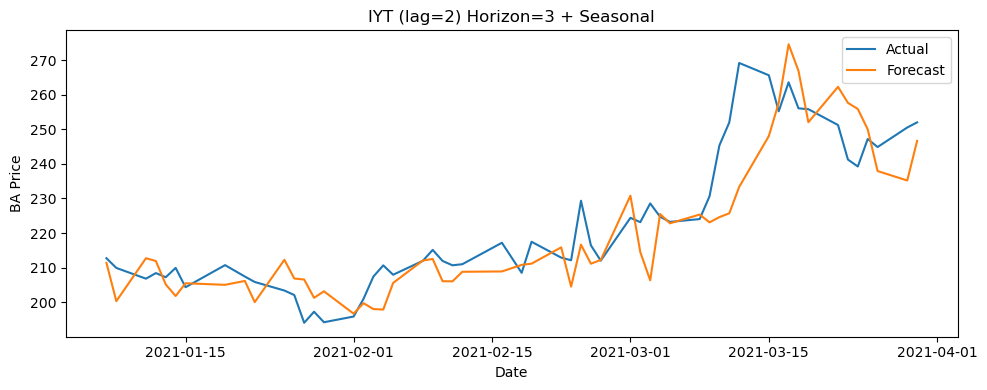

IYT (lag=2) - Horizon 7 | RMSE: 16.77, MAE: 13.01, MAPE: 5.62%


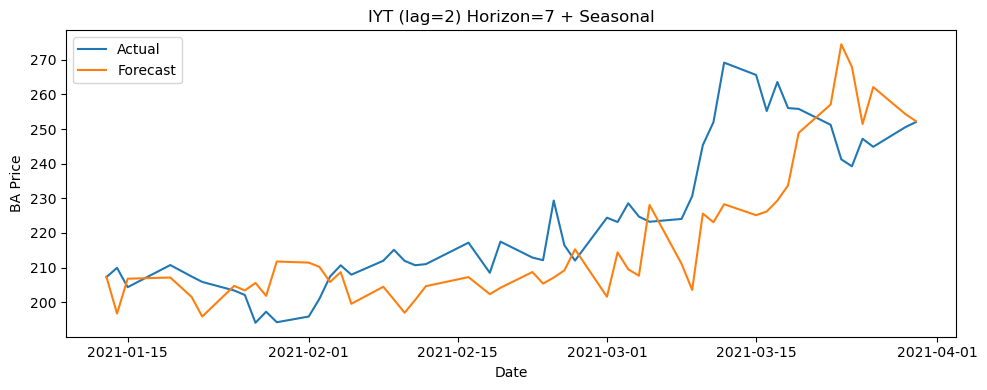


 Metrics for IYT saved to: exo_eval_sensible_seasonal.csv


In [56]:
#sesonal version
for var, lag in exog_lags_sensible.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original (non-differenced) BA series
        exog_df=df_diff,                # differenced/stationary exogenous inputs
        var_name=var,
        lag=lag,
        model_order=(0, 1, 2),
        forecast_horizons=[1, 3, 7],
        train_end_date="2020-12-31",
        test_start_date="2021-01-01",
        output_csv_path="exo_eval_sensible_seasonal.csv",
        seasonal_order=(1, 0, 1, 30),
        append_csv=True,
        plot=True
    )

^VIX (lag=4) - Horizon 1 | RMSE: 6.75, MAE: 5.21, MAPE: 2.31%


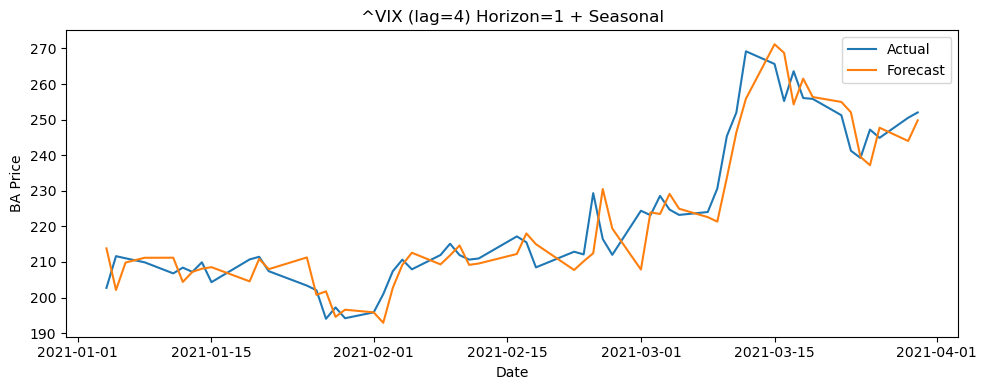

^VIX (lag=4) - Horizon 3 | RMSE: 11.11, MAE: 8.15, MAPE: 3.55%


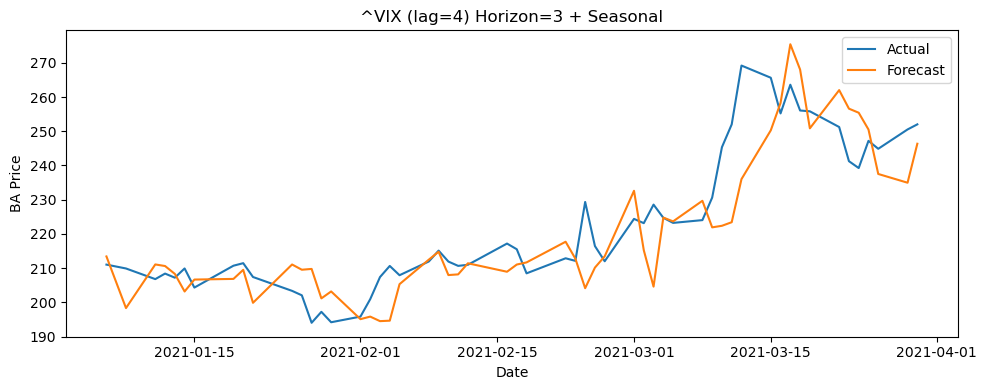

^VIX (lag=4) - Horizon 7 | RMSE: 16.76, MAE: 13.02, MAPE: 5.64%


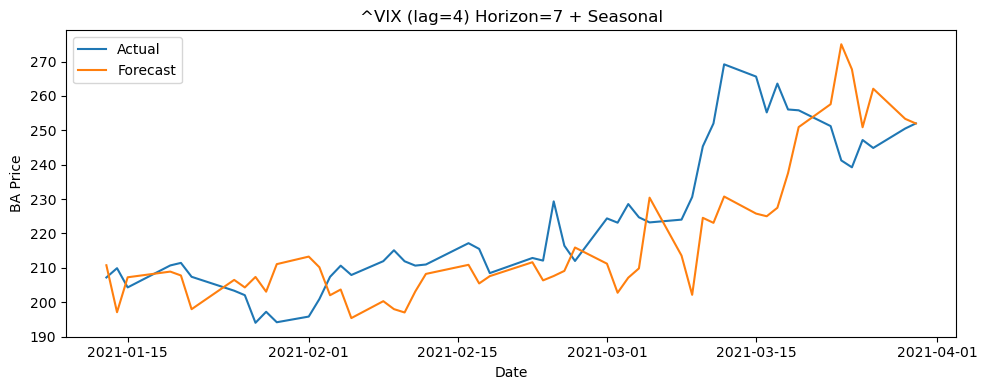


 Metrics for ^VIX saved to: exo_eval_best_seasonal.csv
^TNX (lag=9) - Horizon 1 | RMSE: 6.74, MAE: 5.25, MAPE: 2.33%


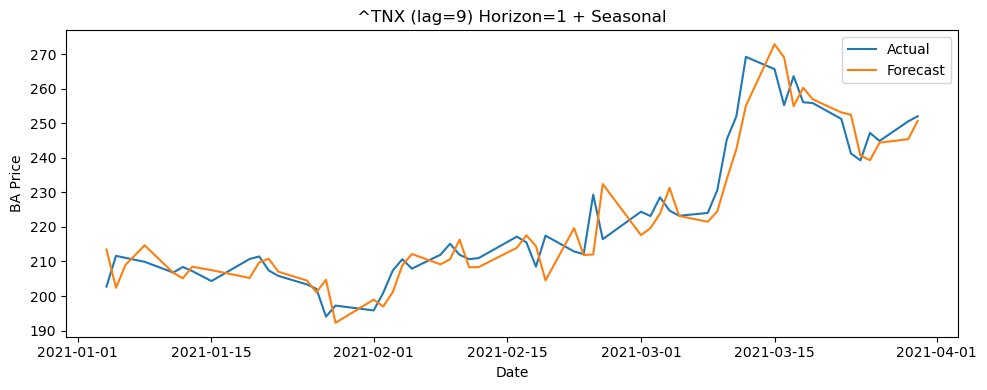

^TNX (lag=9) - Horizon 3 | RMSE: 10.65, MAE: 7.87, MAPE: 3.39%


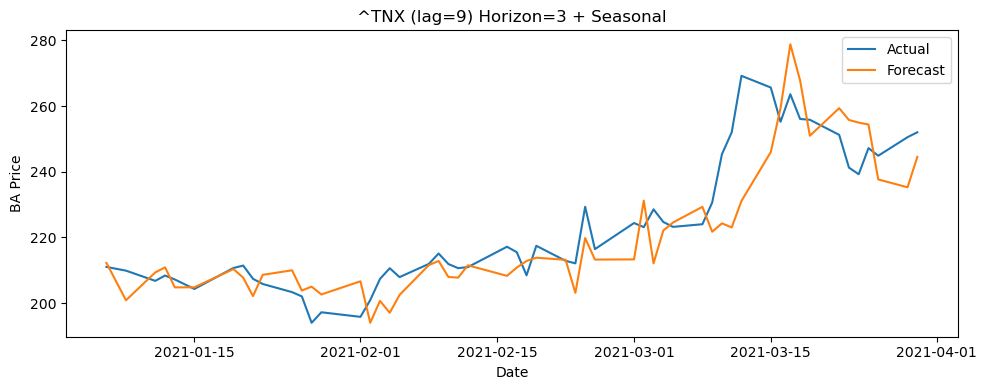

^TNX (lag=9) - Horizon 7 | RMSE: 16.48, MAE: 12.23, MAPE: 5.22%


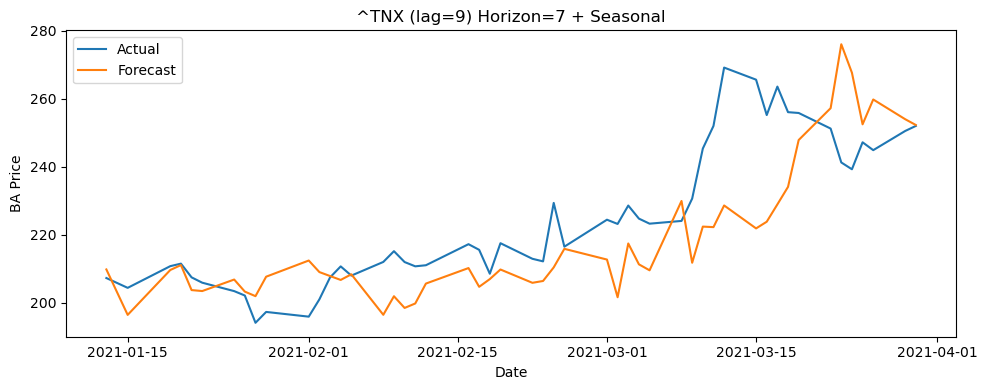


 Metrics for ^TNX saved to: exo_eval_best_seasonal.csv
DX-Y.NYB (lag=16) - Horizon 1 | RMSE: 7.09, MAE: 5.36, MAPE: 2.38%


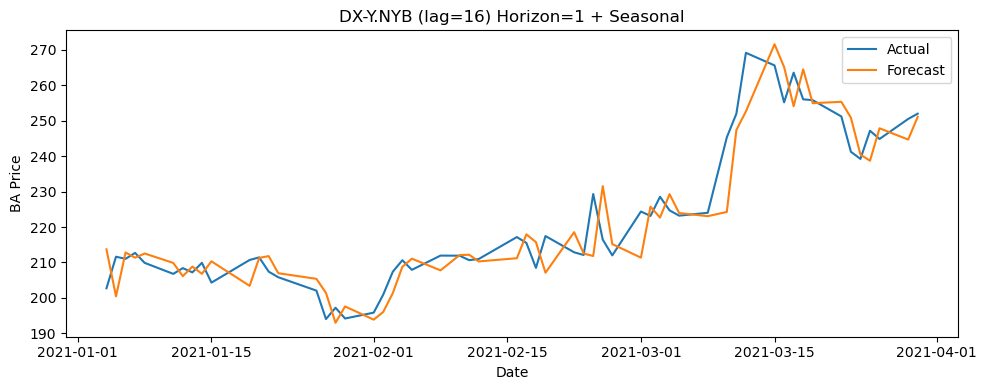

DX-Y.NYB (lag=16) - Horizon 3 | RMSE: 10.80, MAE: 7.60, MAPE: 3.31%


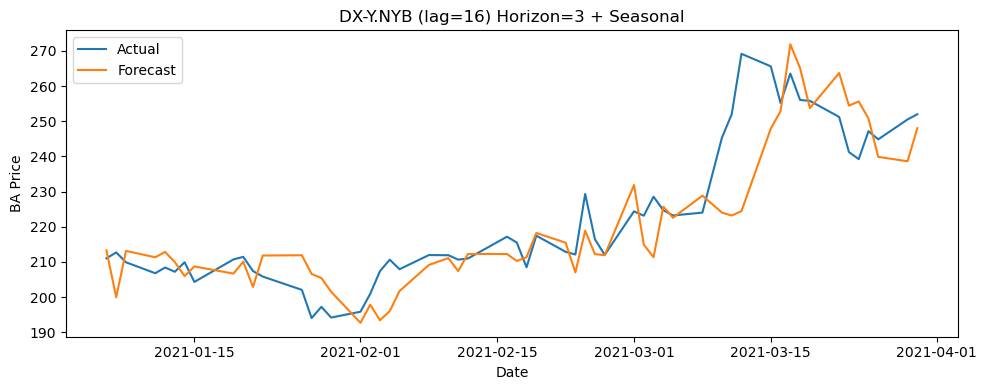

DX-Y.NYB (lag=16) - Horizon 7 | RMSE: 16.86, MAE: 12.46, MAPE: 5.36%


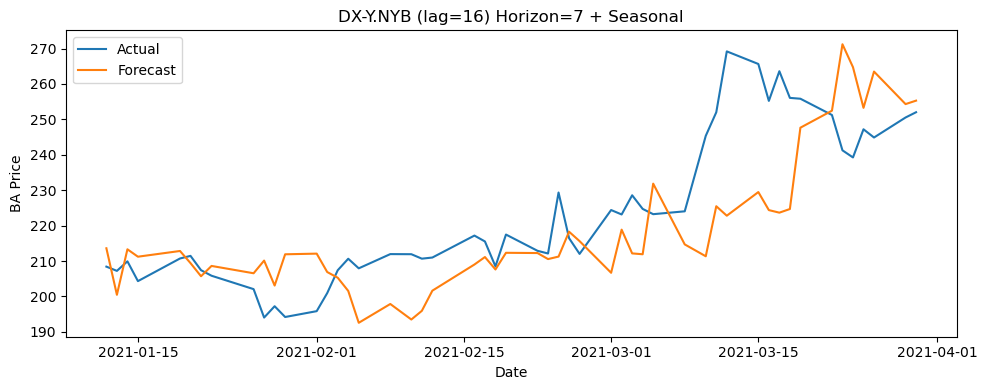


 Metrics for DX-Y.NYB saved to: exo_eval_best_seasonal.csv
JETS (lag=12) - Horizon 1 | RMSE: 6.86, MAE: 5.24, MAPE: 2.32%


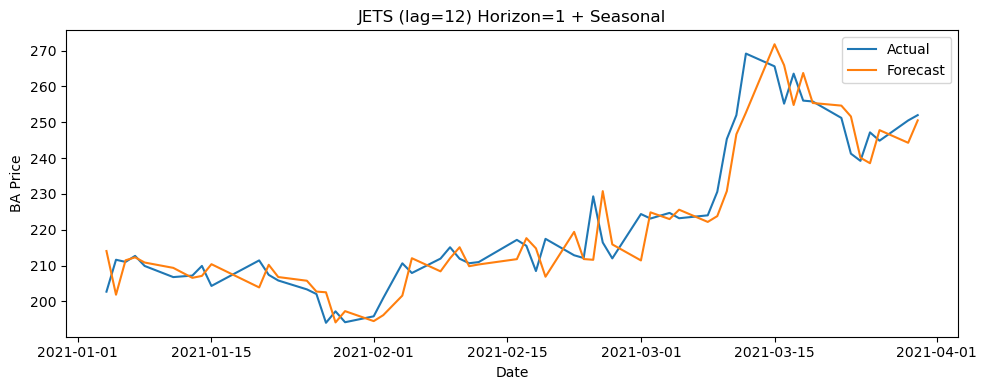

JETS (lag=12) - Horizon 3 | RMSE: 10.22, MAE: 7.31, MAPE: 3.17%


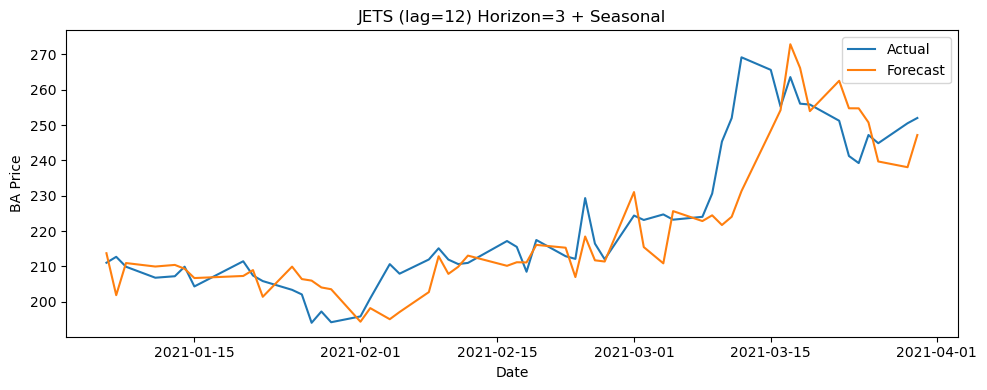

JETS (lag=12) - Horizon 7 | RMSE: 16.87, MAE: 12.42, MAPE: 5.33%


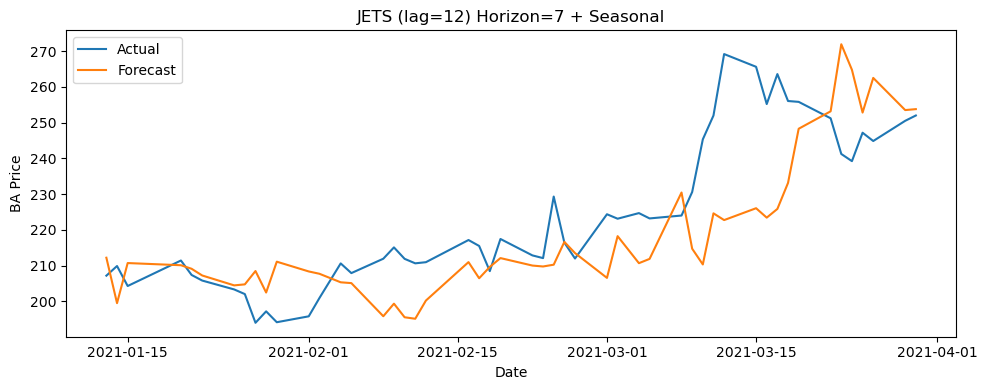


 Metrics for JETS saved to: exo_eval_best_seasonal.csv
XLI (lag=1) - Horizon 1 | RMSE: 6.70, MAE: 5.14, MAPE: 2.28%


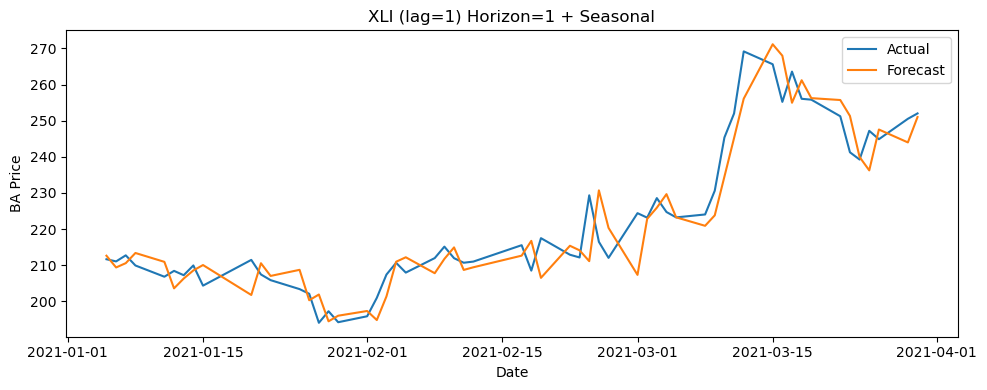

XLI (lag=1) - Horizon 3 | RMSE: 10.70, MAE: 7.92, MAPE: 3.44%


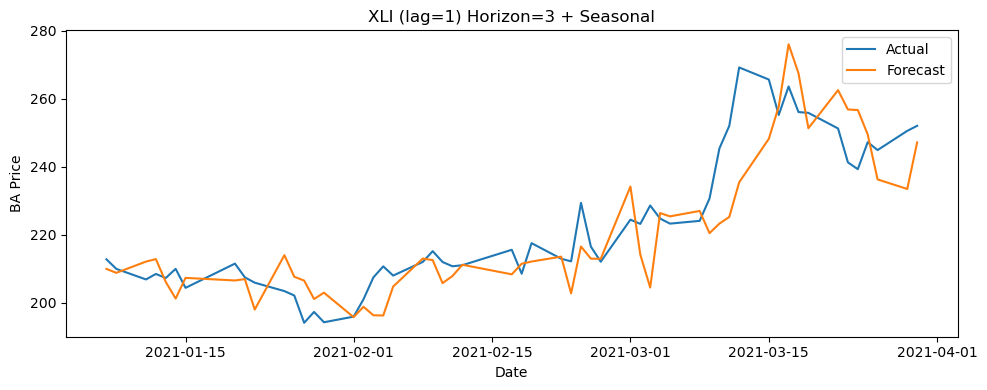

XLI (lag=1) - Horizon 7 | RMSE: 16.81, MAE: 12.95, MAPE: 5.59%


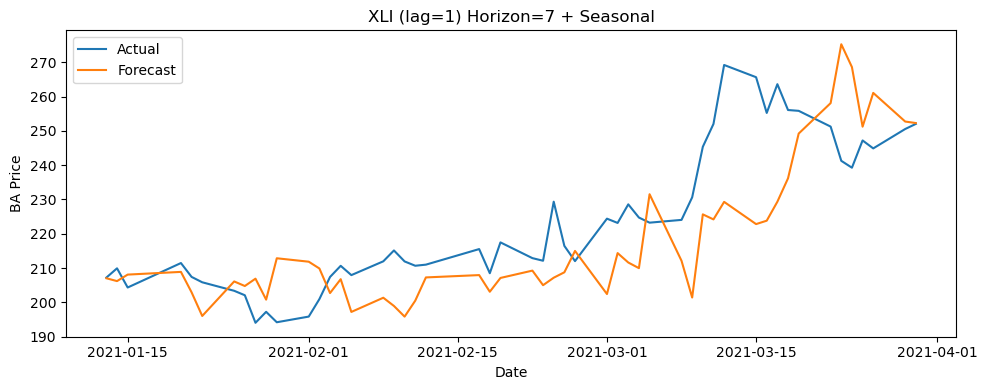


 Metrics for XLI saved to: exo_eval_best_seasonal.csv
IYT (lag=2) - Horizon 1 | RMSE: 6.94, MAE: 5.35, MAPE: 2.38%


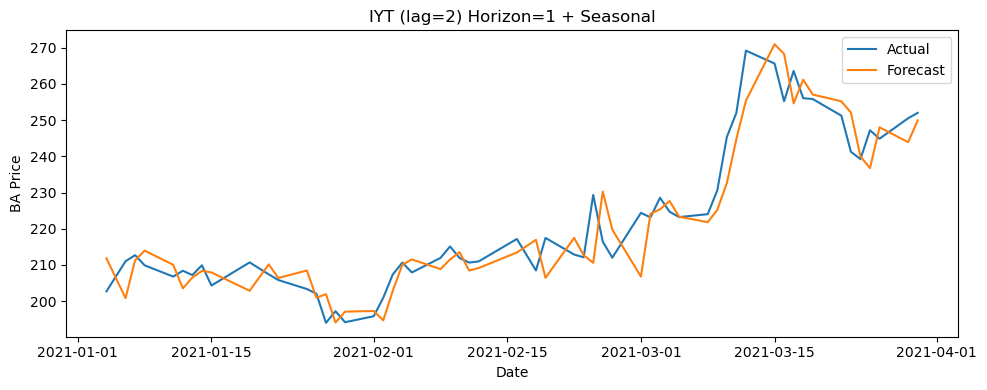

IYT (lag=2) - Horizon 3 | RMSE: 10.42, MAE: 7.67, MAPE: 3.33%


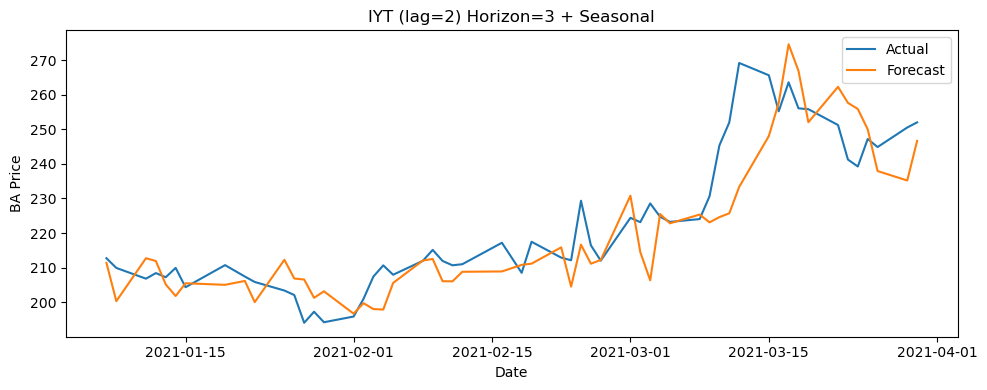

IYT (lag=2) - Horizon 7 | RMSE: 16.77, MAE: 13.01, MAPE: 5.62%


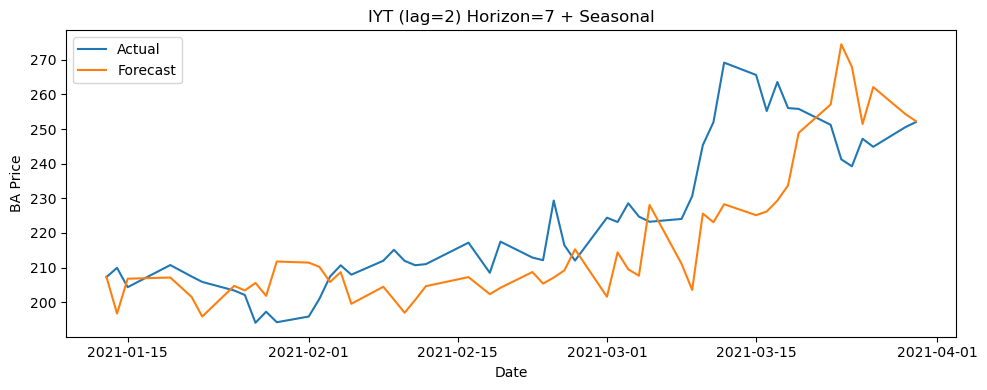


 Metrics for IYT saved to: exo_eval_best_seasonal.csv


In [57]:
for var, lag in exog_lags_best.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original, non-differenced BA prices
        exog_df=df_diff,                # differenced/stationary exogenous input
        var_name=var,
        lag=lag,
        model_order=(0, 1, 2),
        forecast_horizons=[1, 3, 7],
        train_end_date="2020-12-31",
        test_start_date="2021-01-01",
        output_csv_path="exo_eval_best_seasonal.csv",
        seasonal_order=(1, 0, 1, 30),
        append_csv=True,
        plot=True
    )

### Building LSTM baseline model for BA

Very simple architechture first...
- no dropout, 1 layer
- relu, adam, mse loss 

In [72]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100
#initial simple basline model
def create_lstm_baseline_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

def evaluate_lstm_baseline(
    df,
    forecast_horizons=[1, 3, 7],
    train_end="2020-12-31",
    test_start="2021-01-01",
    window_size=30,
    epochs=20,
    output_csv_path="lstm_baseline_metrics.csv",
    plot=True
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq('B')
    series = df['BA'].dropna().to_frame()

    # Scale data
    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series)

    # Split into train/test
    split_train = series.index <= train_end
    split_test = series.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(series_scaled) - h):
            if not split_test[i + h]:
                continue

            X = series_scaled[i - window_size:i].reshape(1, window_size, 1)
            y = series_scaled[i + h][0]

            # Rebuild model each time to prevent data leakage
            X_train_full = []
            y_train_full = []
            for j in range(window_size, i):
                X_train_full.append(series_scaled[j - window_size:j])
                y_train_full.append(series_scaled[j][0])
            X_train_full = np.array(X_train_full)
            y_train_full = np.array(y_train_full)

            model = create_lstm_baseline_model((window_size, 1))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled]])[0][0]
            actual = series.iloc[i + h][0]

            preds.append(pred)
            actuals.append(actual)
            dates.append(series.index[i + h])

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Horizon {h}: RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")
            
            all_metrics.append({
                "model": "LSTM (baseline)",
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"LSTM Baseline Forecast - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("BA Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    df_metrics = pd.DataFrame(all_metrics)
    df_metrics.to_csv(output_csv_path, index=False)
    print(f" Saved baseline LSTM metrics to {output_csv_path}")
    return df_metrics

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

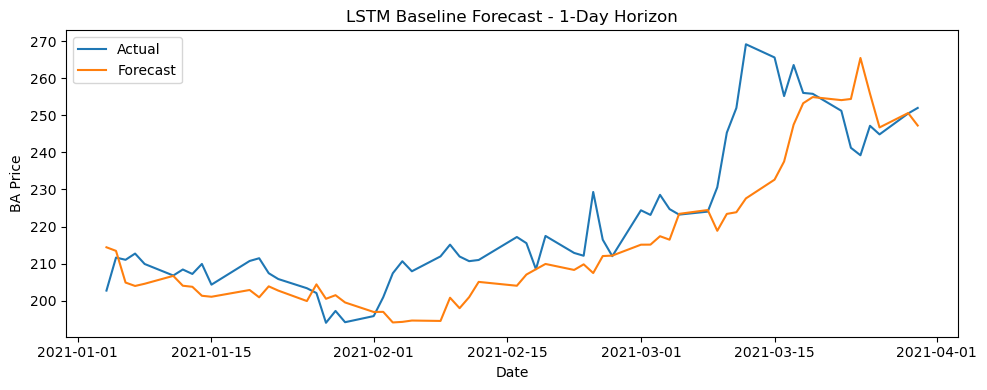

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

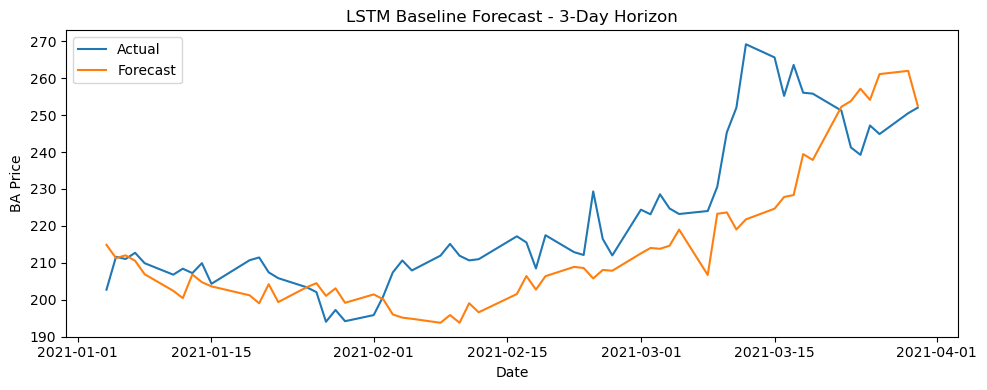

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

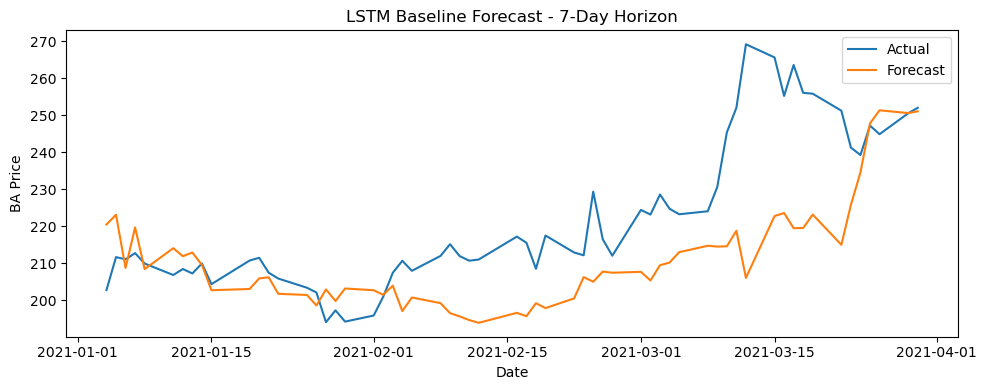

 Saved baseline LSTM metrics to lstm_baseline_metrics.csv


In [74]:
lstm_baseline_results = evaluate_lstm_baseline(
    df=df,
    forecast_horizons=[1, 3, 7],
    train_end="2020-12-31",
    test_start="2021-01-01",
    window_size=30,
    epochs=20,
    output_csv_path="lstm_baseline_metrics.csv",
    plot=True
)


Function to evealuate more complex models and model tweaks

In [76]:
def evaluate_lstm_model(
    df,
    model_fn,
    forecast_horizons=[1, 3, 7],
    train_end="2020-12-31",
    test_start="2021-01-01",
    window_size=30,
    epochs=20,
    output_csv_path="lstm_metrics.csv",
    plot=True,
    callbacks=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq('B')
    series = df['BA'].dropna().to_frame()

    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series)

    split_train = series.index <= train_end
    split_test = series.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(series_scaled) - h):
            if not split_test[i + h]:
                continue

            X = series_scaled[i - window_size:i].reshape(1, window_size, 1)
            y = series_scaled[i + h][0]

            X_train_full, y_train_full = [], []
            for j in range(window_size, i):
                X_train_full.append(series_scaled[j - window_size:j])
                y_train_full.append(series_scaled[j][0])
            X_train_full = np.array(X_train_full)
            y_train_full = np.array(y_train_full)

            model = model_fn((window_size, 1))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0, callbacks=callbacks)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled]])[0][0]
            actual = series.iloc[i + h][0]

            preds.append(pred)
            actuals.append(actual)
            dates.append(series.index[i + h])

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Horizon {h}: RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

            all_metrics.append({
                "model": model_fn.__name__,
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"{model_fn.__name__} - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("BA Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    df_metrics = pd.DataFrame(all_metrics)
    df_metrics.to_csv(output_csv_path, index=False)
    print(f"\n Saved metrics to {output_csv_path}")
    return df_metrics

Slightly more complex model for baseline
- using tanh instead of relu
- adding in dropout
- adding in early stopping

In [78]:
def create_lstm_tanh_dropout_model(input_shape):
    model = Sequential()
    model.add(LSTM(64, activation='tanh', input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

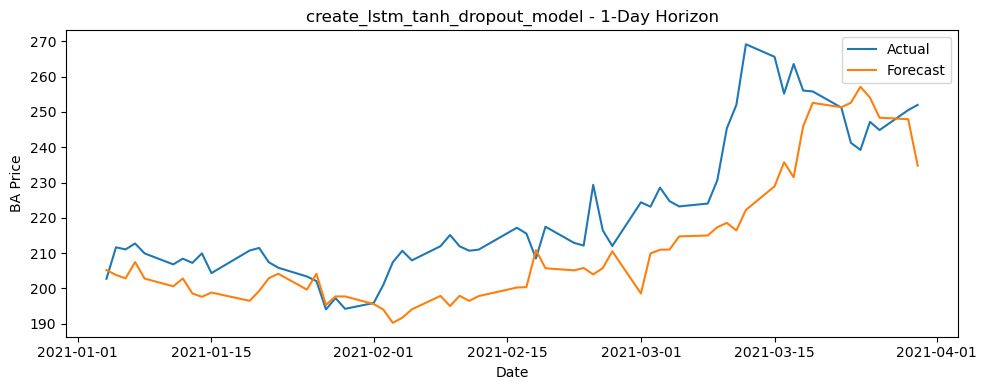

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

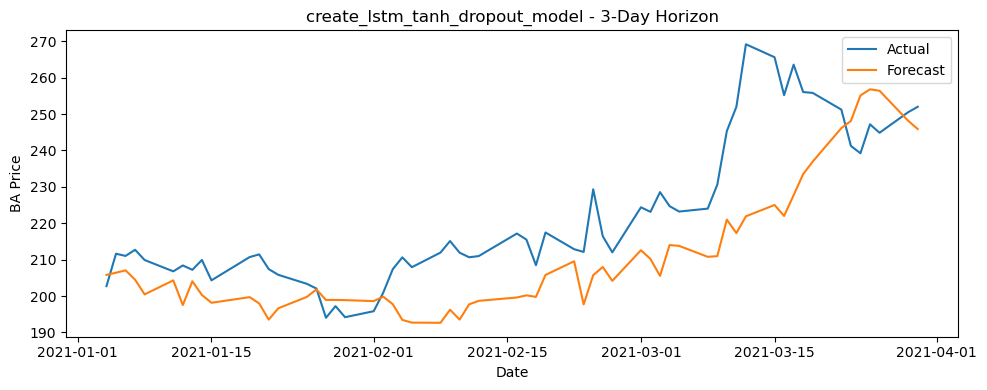

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

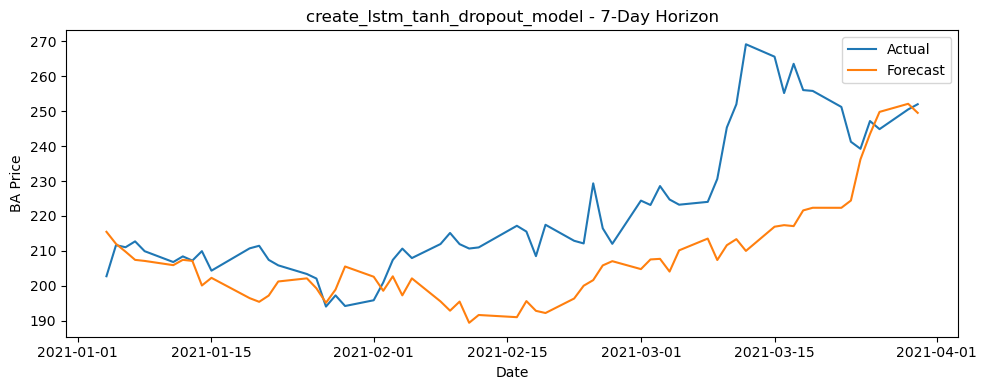


 Saved metrics to lstm_tanh_dropout.csv


,model,horizon,rmse,mae,mape
0,create_lstm_tanh_dropout_model,1,15.325448,11.928586,5.212243
1,create_lstm_tanh_dropout_model,3,16.289845,12.985596,5.652868
2,create_lstm_tanh_dropout_model,7,20.157840,15.087255,6.513470


In [79]:
#call this model with early stopping
early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_tanh_dropout_model,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_tanh_dropout.csv",
    callbacks=[early_stop]
)

This model proving worse that prvious despite dropout etc. Going to try same model architecture again...but just swap back in relu for tanh

In [81]:
def create_lstm_relu_dropout_model(input_shape):
    model = Sequential()
    model.add(LSTM(64, activation='relu', input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

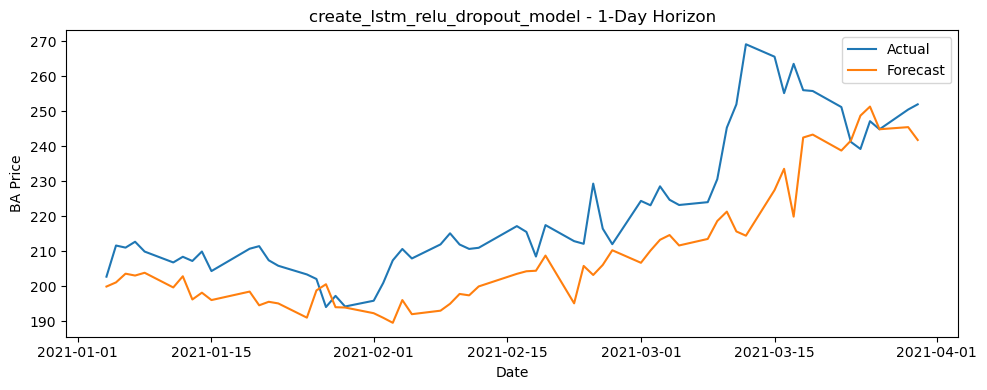

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

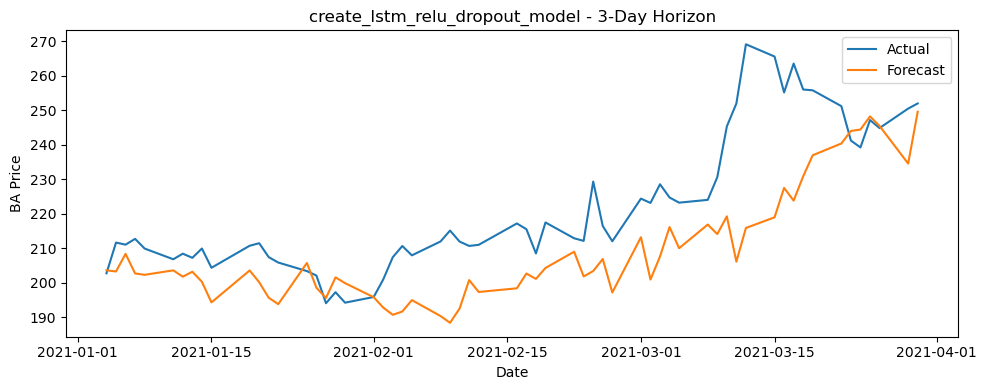

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

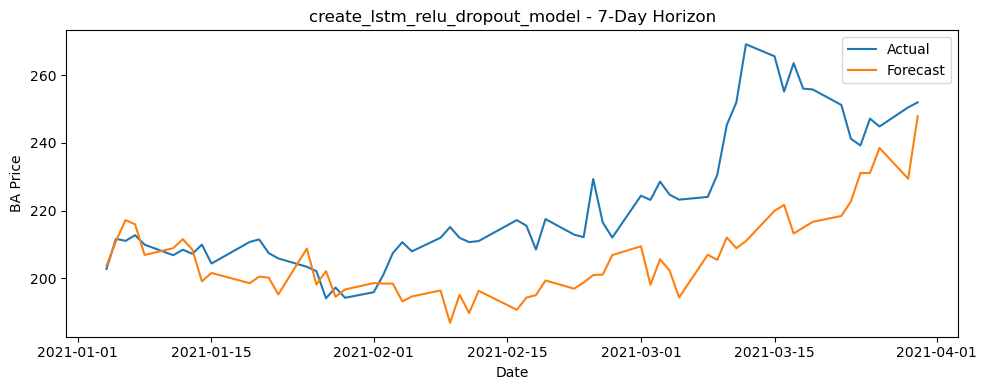


 Saved metrics to lstm_relu_dropout.csv


,model,horizon,rmse,mae,mape
0,create_lstm_relu_dropout_model,1,16.334454,12.898895,5.655764
1,create_lstm_relu_dropout_model,3,17.706985,13.507470,5.878575
2,create_lstm_relu_dropout_model,7,21.502888,16.762616,7.219398


In [82]:
#call this model with early stopping
early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_relu_dropout_model,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_relu_dropout.csv",
    callbacks=[early_stop]
)

Removing dropout and just swapping out relu for tanh in baseline
- trying without early stopping, then with (commenting out)

Without early stopping metrics:
- LSTM (baseline)	1	13.08928465	9.426040136	4.101541786
- LSTM (baseline)	3	14.55810478	10.75792063	4.655816478
- LSTM (baseline)	7	19.38965701	14.05542444	6.030511182

In [84]:
def create_lstm_baseline_model_tanh(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='tanh', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

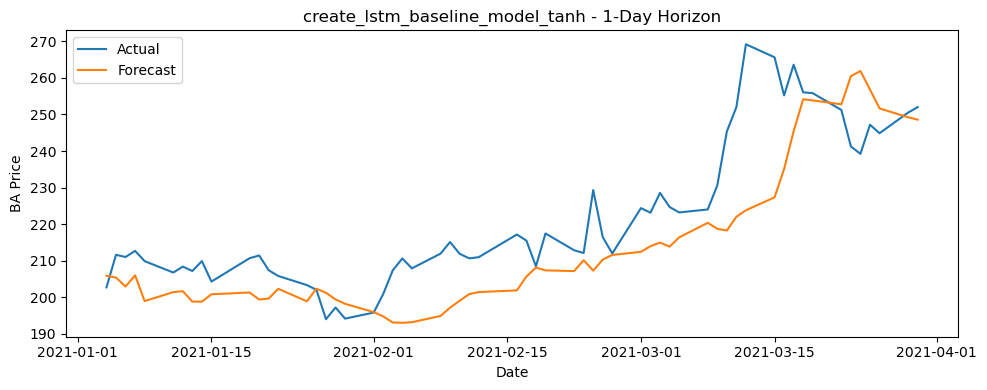

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

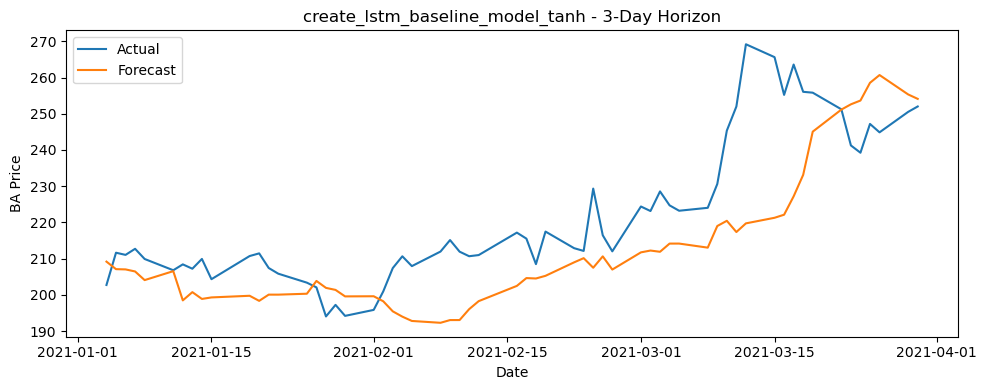

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

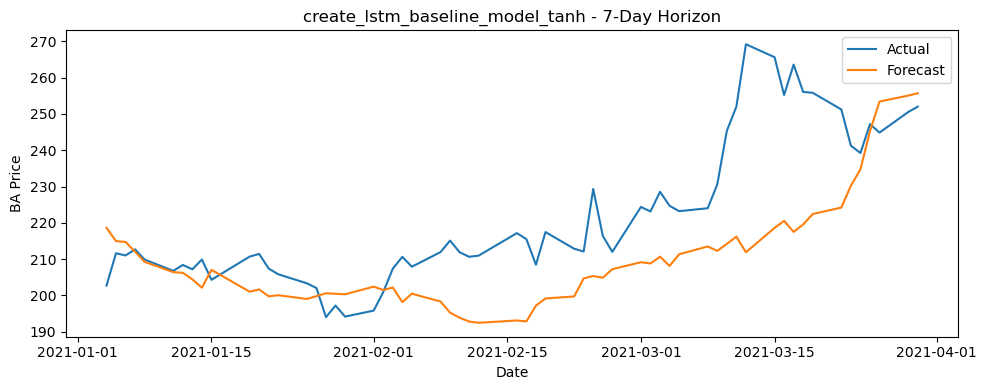


 Saved metrics to lstm_relu.csv


,model,horizon,rmse,mae,mape
0,create_lstm_baseline_model_tanh,1,13.750098,10.467820,4.585852
1,create_lstm_baseline_model_tanh,3,15.979437,12.281339,5.335965
2,create_lstm_baseline_model_tanh,7,18.808171,14.006063,6.033141


In [85]:
#call this model with early stopping
early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)
#early stopping had better metrics for 7 day forecast but worse for others
evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_baseline_model_tanh,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_relu.csv",
    callbacks=[early_stop]
)

Trying a deeper model 

In [87]:
def create_lstm_deep_model_relu(input_shape):
    model = Sequential()
    model.add(LSTM(64, activation='relu', return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(LSTM(32, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

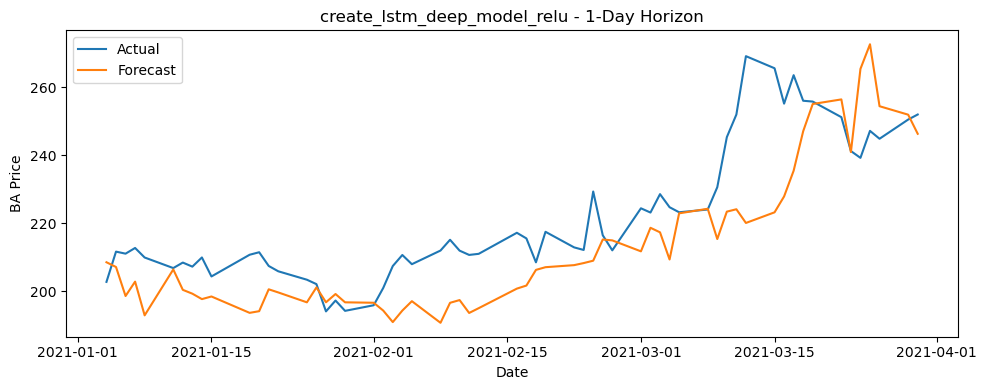

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

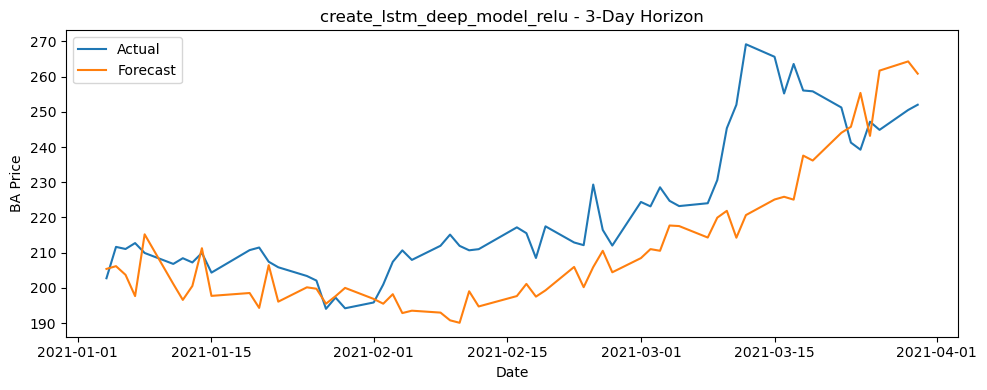

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

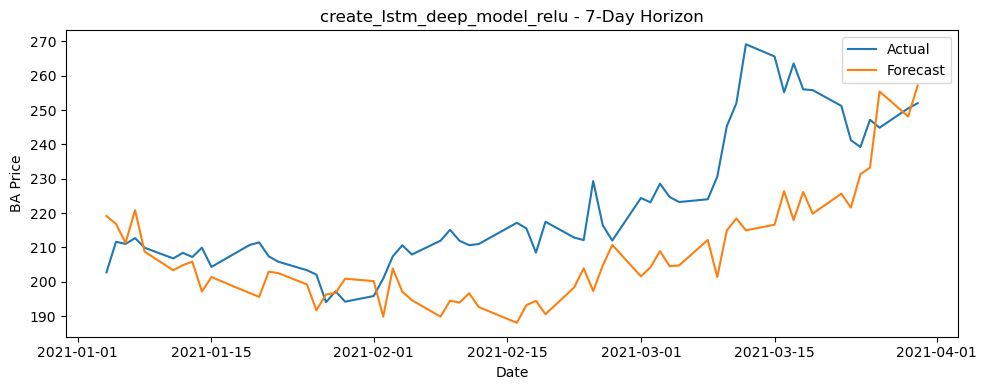


 Saved metrics to lstm_deep_relu.csv


,model,horizon,rmse,mae,mape
0,create_lstm_deep_model_relu,1,15.448135,11.699216,5.119429
1,create_lstm_deep_model_relu,3,16.589325,13.134604,5.713988
2,create_lstm_deep_model_relu,7,20.066567,15.833921,6.867845


In [88]:
early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_deep_model_relu,  
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_deep_relu.csv",
    callbacks=[early_stop]
)

This deeper model in underperfoming compared to the simpler ones i've worked with so far...
I'm going to try it without eary stopping and also
I'm going to swap out relu for tanh and reduce complexity slightly to see if that helps.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

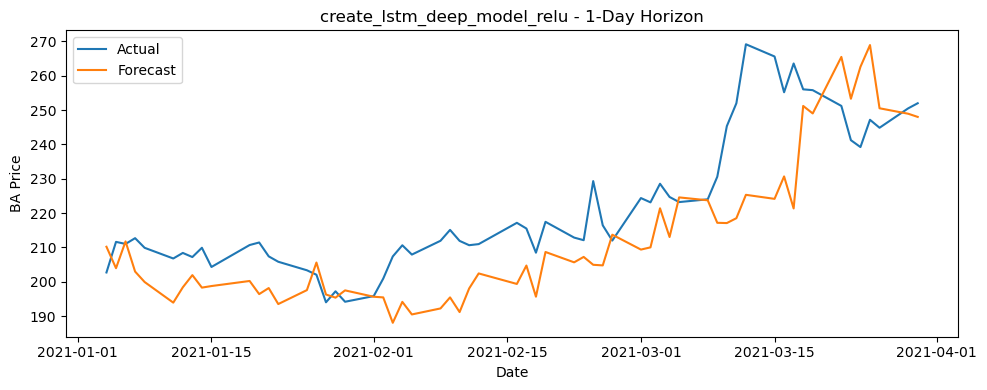

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

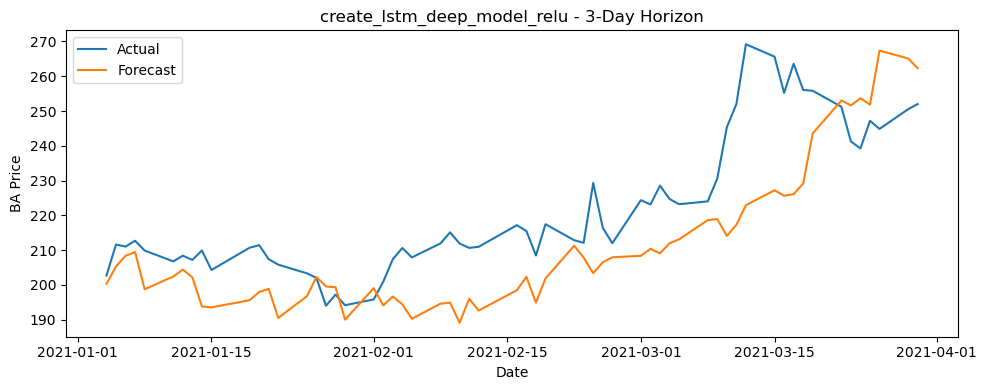

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

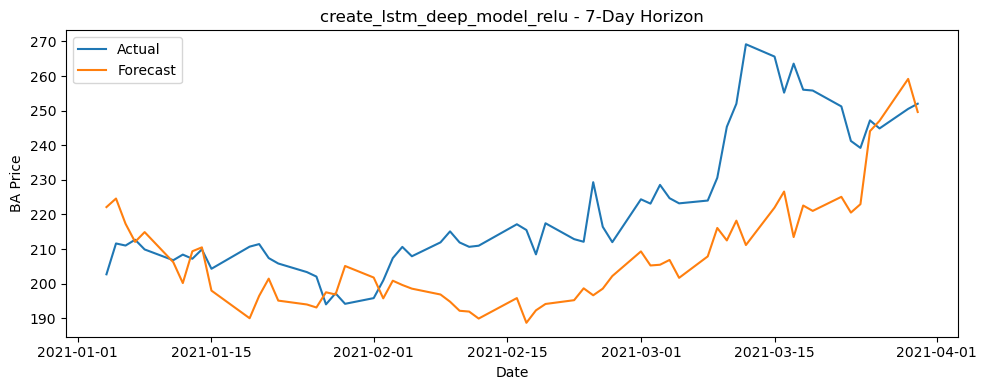


 Saved metrics to lstm_deep_relu.csv


,model,horizon,rmse,mae,mape
0,create_lstm_deep_model_relu,1,16.076275,12.583362,5.505328
1,create_lstm_deep_model_relu,3,16.857338,13.583351,5.927075
2,create_lstm_deep_model_relu,7,20.356557,16.336204,7.119609


In [90]:
#early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_deep_model_relu,  
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_deep_relu.csv",
    #callbacks=[early_stop]
)

In [91]:
def create_lstm_deep_model_small_tanh(input_shape):
    model = Sequential()
    model.add(LSTM(32, activation='tanh', return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.1))
    model.add(LSTM(16, activation='tanh'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

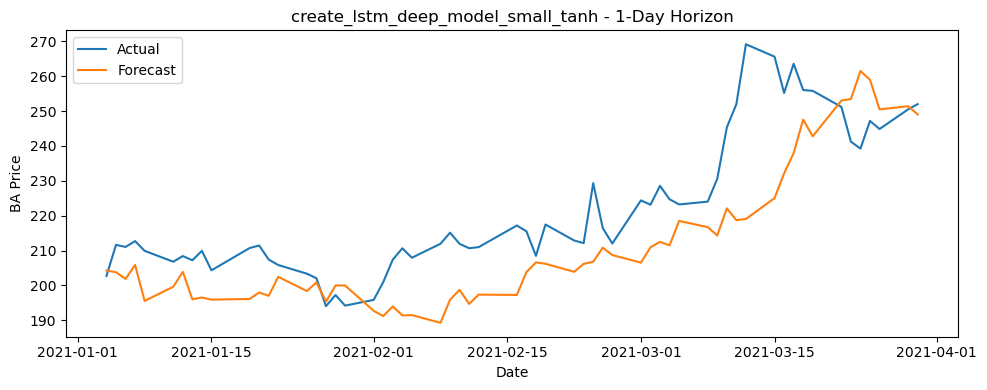

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

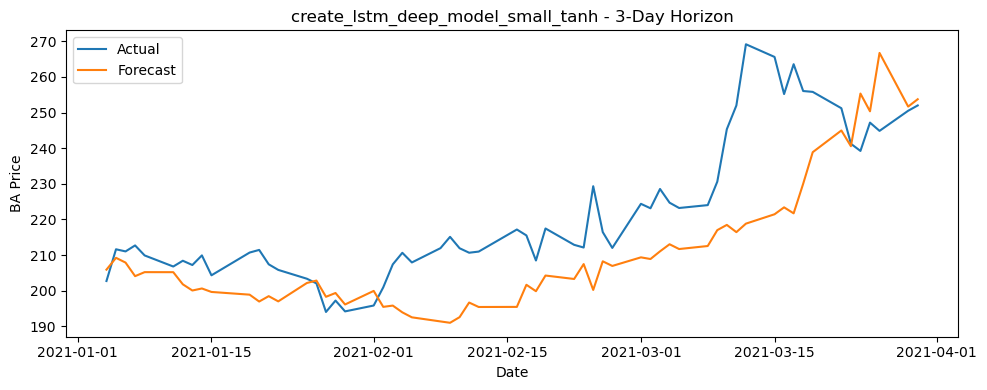

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

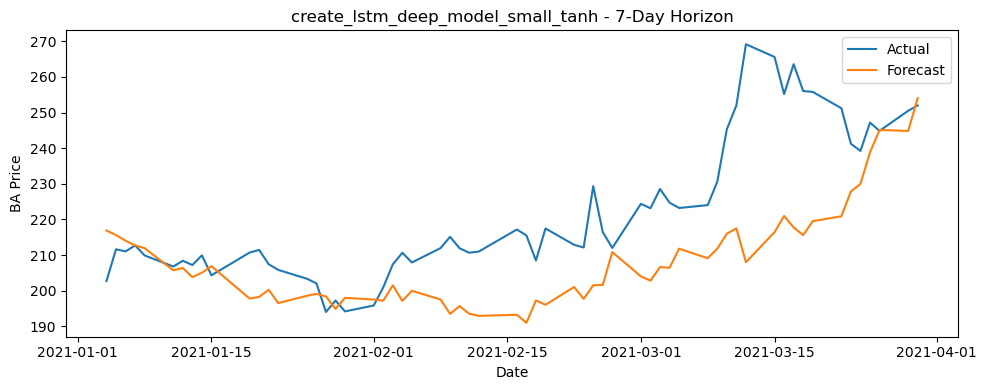


 Saved metrics to lstm_deep_model_small_tanh.csv


,model,horizon,rmse,mae,mape
0,create_lstm_deep_model_small_tanh,1,15.547903,12.386239,5.439703
1,create_lstm_deep_model_small_tanh,3,17.157944,13.105825,5.691244
2,create_lstm_deep_model_small_tanh,7,19.946372,14.931317,6.428186


In [92]:
early_stop = EarlyStopping(monitor='loss', patience=7, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_deep_model_small_tanh,  
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_deep_model_small_tanh.csv",
    callbacks=[early_stop]
)

trying to use keras tuner to speed up process...

In [94]:
#defining tunable model
class LSTMHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()
        model.add(
            LSTM(
                units=hp.Int("units_1", min_value=16, max_value=128, step=16),
                activation=hp.Choice("activation_1", ["relu", "tanh"]),
                return_sequences=hp.Boolean("return_seq"),
                input_shape=self.input_shape
            )
        )
        if hp.Boolean("add_second_layer"):
            model.add(Dropout(hp.Float("dropout_1", 0.0, 0.4, step=0.1)))
            model.add(
                LSTM(
                    units=hp.Int("units_2", min_value=16, max_value=64, step=16),
                    activation=hp.Choice("activation_2", ["relu", "tanh"]),
                )
            )
        model.add(Dense(1))
        model.compile(
            optimizer="adam",
            loss="mse",
            metrics=["mae"]
        )
        return model


In [95]:
#wrappper for keras tuning

def tune_lstm_model(input_shape):
    tuner = RandomSearch(
        LSTMHyperModel(input_shape),
        objective='val_loss',
        max_trials=10,
        executions_per_trial=1,
        directory='tuning',
        project_name='lstm_tuning',
        seed = seed
    )

    # Dummy data to tune on (required)
    X_dummy = np.random.rand(100, input_shape[0], input_shape[1])
    y_dummy = np.random.rand(100)

    tuner.search(X_dummy, y_dummy, epochs=5, validation_split=0.2, verbose=1)
    
    best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
    best_model = tuner.hypermodel.build(best_hp)
    return best_model, best_hp

Reloading Tuner from tuning\lstm_tuning\tuner0.json
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/st

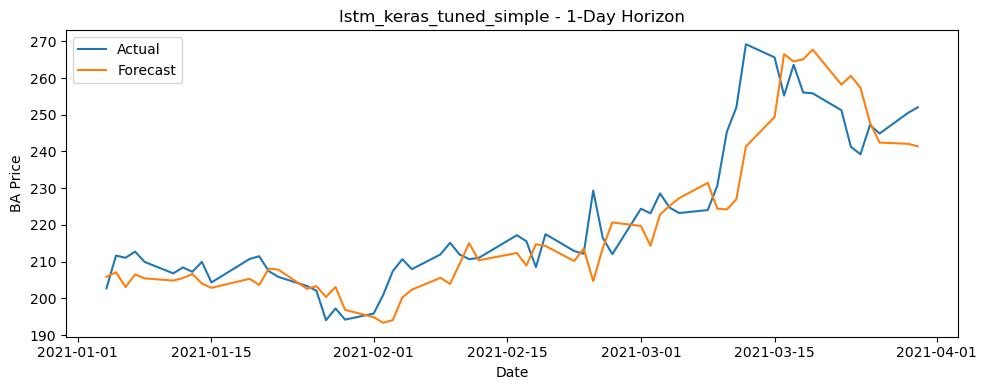

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━

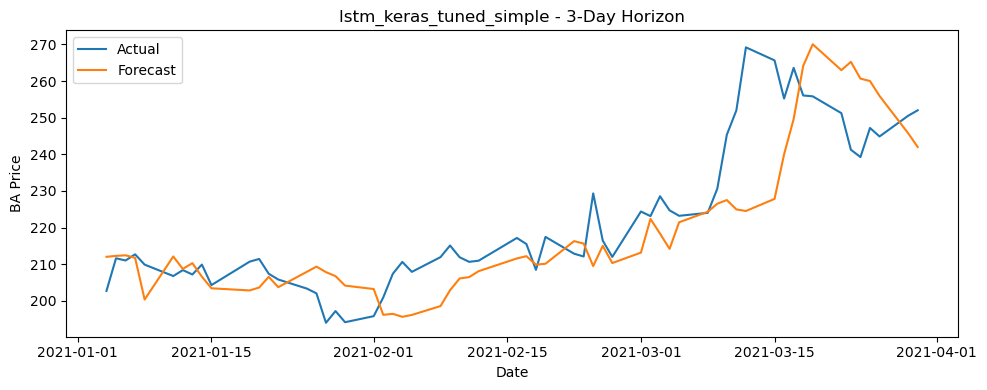

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━

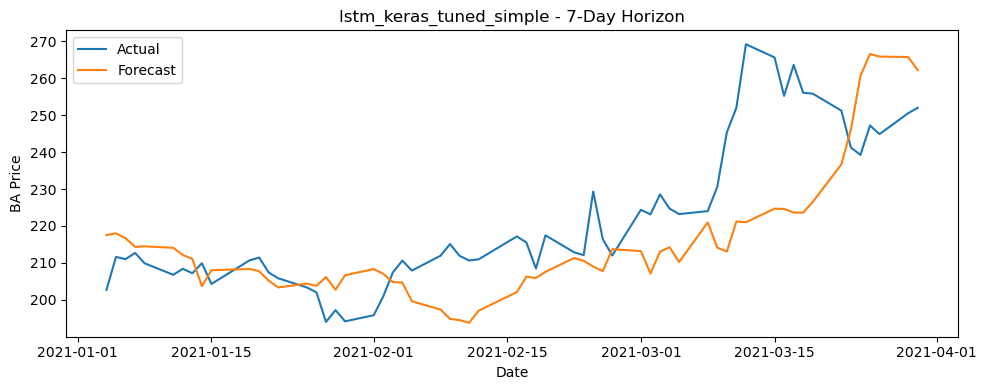


 Saved metrics to lstm_keras_tuned_simple_metrics.csv


,model,horizon,rmse,mae,mape
0,lstm_keras_tuned_simple,1,9.497777,7.056660,3.075238
1,lstm_keras_tuned_simple,3,12.506724,9.127331,3.956600
2,lstm_keras_tuned_simple,7,16.779674,12.788588,5.496636


In [96]:
#adapting evaluating function to accept a pre built model
input_shape = (30, 1)  
best_model_simple, best_hp_simple = tune_lstm_model(input_shape)

# Wrapper to pass to evaluator
def lstm_keras_tuned_simple(input_shape):
    return best_model_simple  # built from simple tuner
    
evaluate_lstm_model(
    df=df,
    model_fn=lstm_keras_tuned_simple,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_keras_tuned_simple_metrics.csv",
    callbacks=[EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)]
)

In [97]:
#defining hypermodel for keras tuner

class LSTMHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()

        # First LSTM layer
        activation_1 = hp.Choice("activation_1", ["relu", "tanh", "leaky_relu"])
        units_1 = hp.Int("units_1", min_value=16, max_value=128, step=16)
        return_seq = hp.Boolean("return_seq_1")

        if activation_1 == "leaky_relu":
            model.add(LSTM(units_1, activation=None, return_sequences=return_seq, input_shape=self.input_shape))
            model.add(LeakyReLU(alpha=hp.Float("leaky_relu_alpha_1", 0.01, 0.3, step=0.05)))
        else:
            model.add(LSTM(units_1, activation=activation_1, return_sequences=return_seq, input_shape=self.input_shape))

        # Optional second LSTM layer — only if first returns sequences
        if return_seq and hp.Boolean("add_second_lstm"):
            model.add(Dropout(hp.Float("dropout_1", 0.0, 0.4, step=0.1)))
            units_2 = hp.Int("units_2", min_value=16, max_value=64, step=16)
            activation_2 = hp.Choice("activation_2", ["relu", "tanh", "leaky_relu"])
            if activation_2 == "leaky_relu":
                model.add(LSTM(units_2, activation=None))
                model.add(LeakyReLU(alpha=hp.Float("leaky_relu_alpha_2", 0.01, 0.3, step=0.05)))
            else:
                model.add(LSTM(units_2, activation=activation_2))

        # Optional final dropout
        if hp.Boolean("add_final_dropout"):
            model.add(Dropout(hp.Float("final_dropout", 0.0, 0.3, step=0.1)))

        # Output layer
        model.add(Dense(1))  # Avoided activation=None/linear choice to keep tuner stable

        # Optimizer
        optimizer_name = hp.Choice("optimizer", ["adam", "rmsprop"])
        learning_rate = hp.Float("learning_rate", 1e-5, 1e-2, sampling="log")
        optimizer = optimizers.Adam(learning_rate) if optimizer_name == "adam" else optimizers.RMSprop(learning_rate)

        model.compile(optimizer=optimizer, loss="mse", metrics=["mae"])
        return model

In [98]:
#preparing input data

# Define window size
window_size = 30
input_shape = (window_size, 1)
# Prepare scaled BA series
df = df.copy()
df.index = pd.to_datetime(df.index)
df = df.asfreq("B")
series = df["BA"].dropna().to_frame()

scaler = MinMaxScaler()
series_scaled = scaler.fit_transform(series)

# Generate training sequences
X_train, y_train = [], []
for i in range(window_size, int(len(series_scaled) * 0.8)):
    X_train.append(series_scaled[i - window_size:i])
    y_train.append(series_scaled[i][0])

X_train = np.array(X_train)
y_train = np.array(y_train)

In [99]:
# Setup tuner
tuner = RandomSearch(
    LSTMHyperModel(input_shape=(window_size, 1)),
    objective="val_loss",
    max_trials=20,
    executions_per_trial=1,
    directory="lstm_tuning",
    project_name="baseline_tune",
    seed = seed
)

# Run tuning
early_stop = EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)
tuner.search(X_train, y_train, validation_split=0.2, epochs=20, callbacks=[early_stop])

# Get best model + hyperparameters
best_hp = tuner.get_best_hyperparameters(1)[0]
best_model_complex = tuner.hypermodel.build(best_hp)

# Display best config
print("\n Best Hyperparameter Configuration:")
for k, v in best_hp.values.items():
    print(f"{k}: {v}")

Reloading Tuner from lstm_tuning\baseline_tune\tuner0.json

 Best Hyperparameter Configuration:
activation_1: tanh
units_1: 64
return_seq_1: False
add_second_lstm: False
add_final_dropout: True
output_activation: linear
optimizer: adam
learning_rate: 0.006571970090025509
dropout_1: 0.4
units_2: 64
activation_2: relu
leaky_relu_alpha_1: 0.11
final_dropout: 0.2


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━

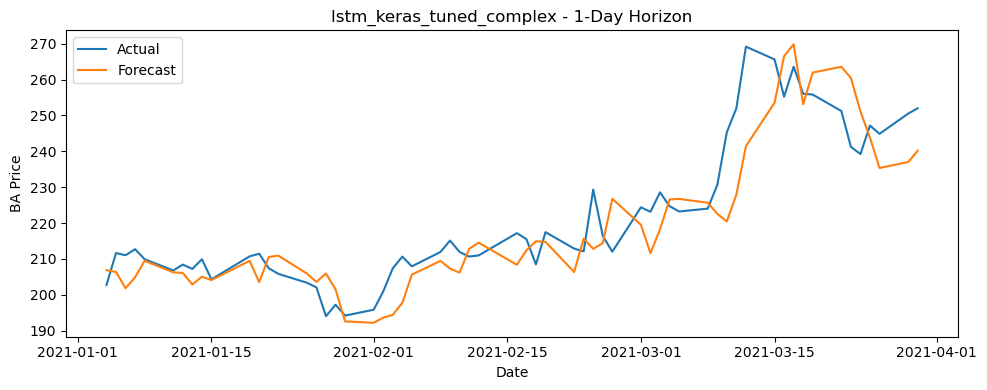

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━

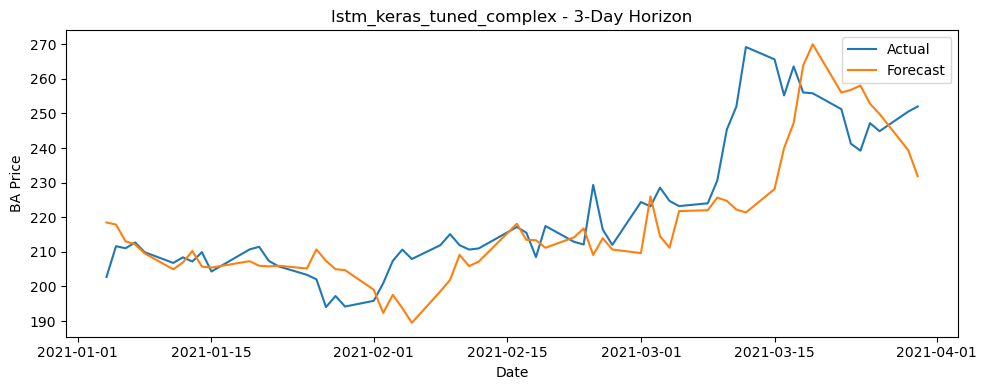

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━

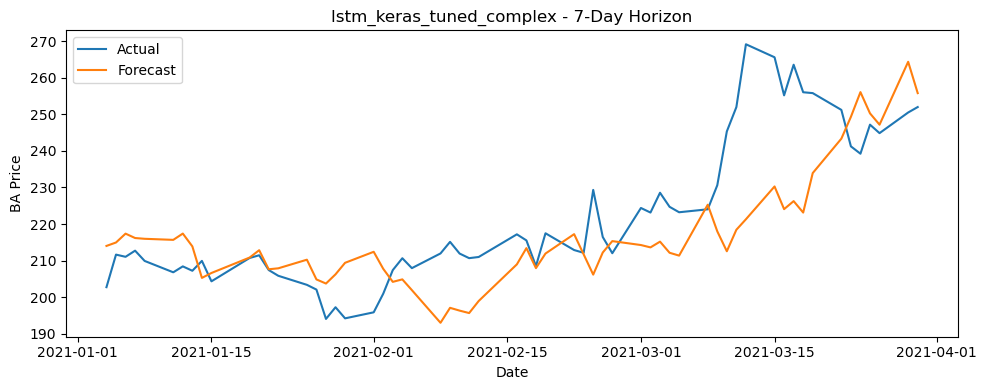


 Saved metrics to lstm_keras_tuned_metrics.csv


,model,horizon,rmse,mae,mape
0,lstm_keras_tuned_complex,1,9.560131,7.378764,3.227092
1,lstm_keras_tuned_complex,3,12.986955,9.208097,3.986629
2,lstm_keras_tuned_complex,7,15.518981,11.322639,4.894951


In [100]:
#wrapper
def lstm_keras_tuned_complex(input_shape):
    return best_model_complex
    
#evaluate
evaluate_lstm_model(
    df=df,
    model_fn=lstm_keras_tuned_complex,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_keras_tuned_metrics.csv",
    callbacks=[early_stop]
)

In [101]:
#saving best model for use with exo variables later
best_hp = tuner.get_best_hyperparameters(1)[0]

def best_model_fn(input_shape):
    model = LSTMHyperModel(input_shape).build(best_hp)
    return model

In [102]:
def evaluate_lstm_model_with_exo(
    df,
    exo_var=None,
    model_fn=None,
    forecast_horizons=[1, 3, 7],
    train_end="2020-12-31",
    test_start="2021-01-01",
    window_size=30,
    epochs=20,
    output_csv_path="metrics.csv",
    plot=True,
    callbacks=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq("B")
    
    features = ["BA"] + (exo_var if isinstance(exo_var, list) else [exo_var] if exo_var else [])
    df = df[features].dropna()

    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(df)

    split_train = df.index <= train_end
    split_test = df.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(data_scaled) - h):
            if not split_test[i + h]:
                continue

            X = data_scaled[i - window_size:i].reshape(1, window_size, len(features))
            y = data_scaled[i + h][0]

            X_train_full, y_train_full = [], []
            for j in range(window_size, i):
                X_train_full.append(data_scaled[j - window_size:j])
                y_train_full.append(data_scaled[j][0])
            X_train_full = np.array(X_train_full, dtype=np.float32)
            y_train_full = np.array(y_train_full, dtype=np.float32)

            model = model_fn((window_size, len(features)))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0, callbacks=callbacks)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled] + [0] * (len(features) - 1)])[0][0]
            actual = df.iloc[i + h]["BA"]

            preds.append(pred)
            actuals.append(actual)
            dates.append(df.index[i + h])

            # M
            del model, X_train_full, y_train_full, X
            gc.collect()

        # getting metrics and plot
        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Exo: {exo_var or 'None'} - Horizon {h} -> RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

            all_metrics.append({
                "model": model_fn.__name__,
                "exo_var": exo_var or "None",
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"{exo_var or 'No Exo'} - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("BA Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

        # cleaning up at horizon level to save memory
        K.clear_session()
        gc.collect()

    df_metrics = pd.DataFrame(all_metrics)
    df_metrics.to_csv(output_csv_path, index=False)
    print(f"\nSaved metrics to {output_csv_path}")
    return df_metrics


 Evaluating with exogenous variable: SLX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━

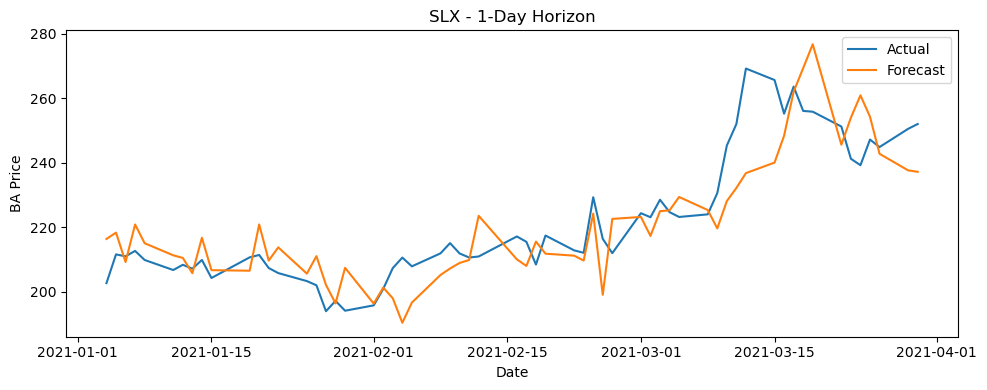


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━

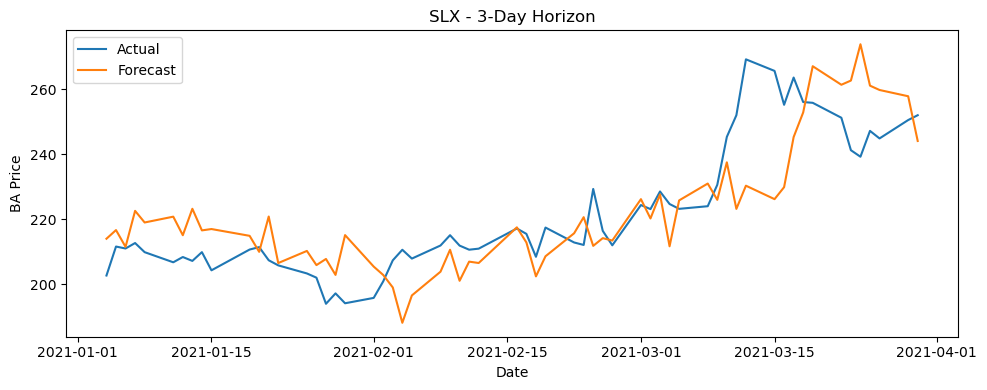

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

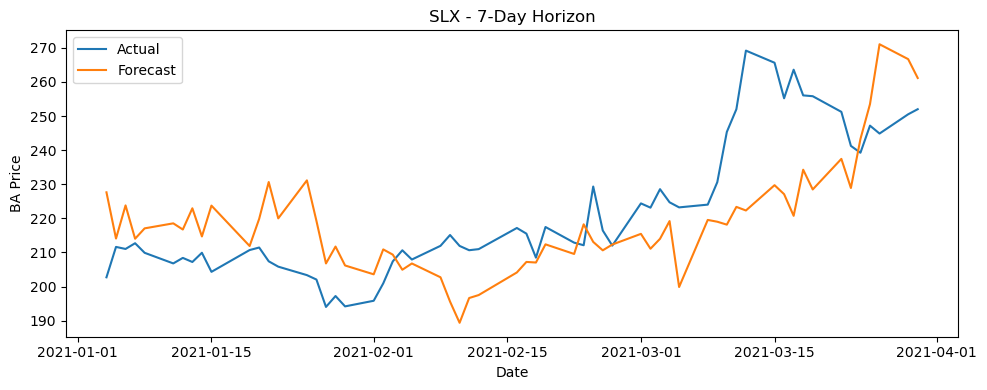


Saved metrics to metrics_lstm_exo_SLX.csv

 Evaluating with exogenous variable: CL=F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━

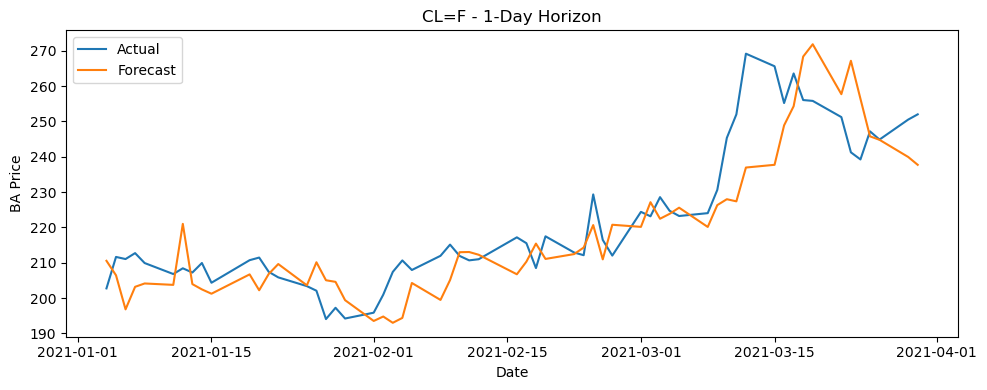

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

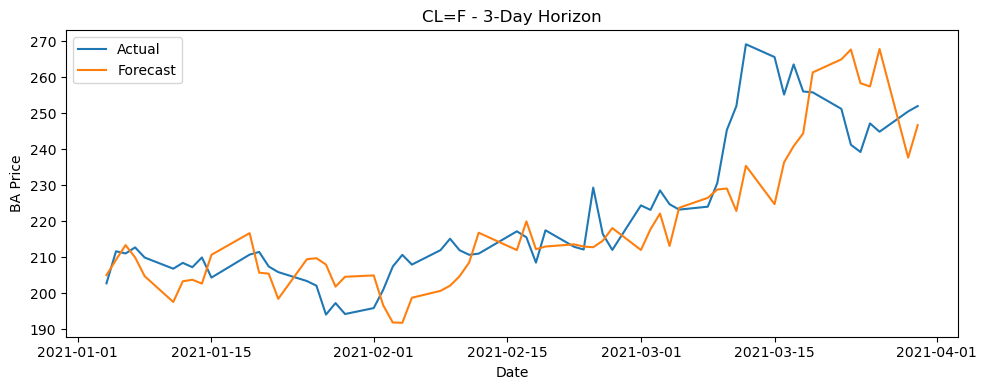

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

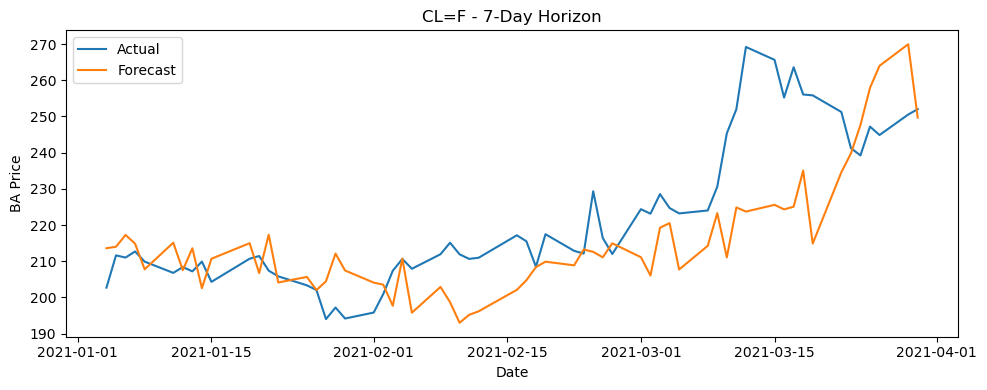


Saved metrics to metrics_lstm_exo_CLF.csv

 Evaluating with exogenous variable: ITA
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━

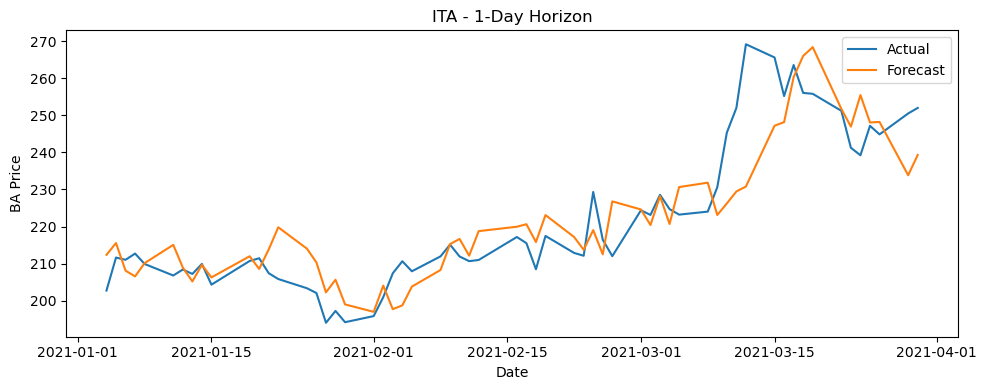

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

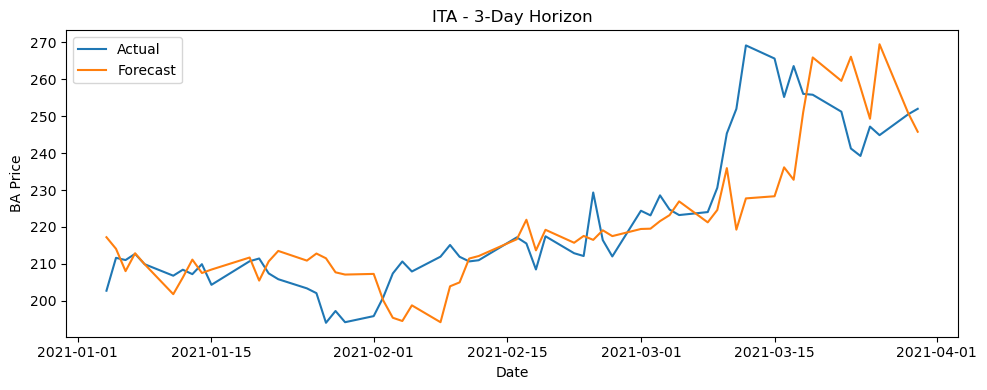

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

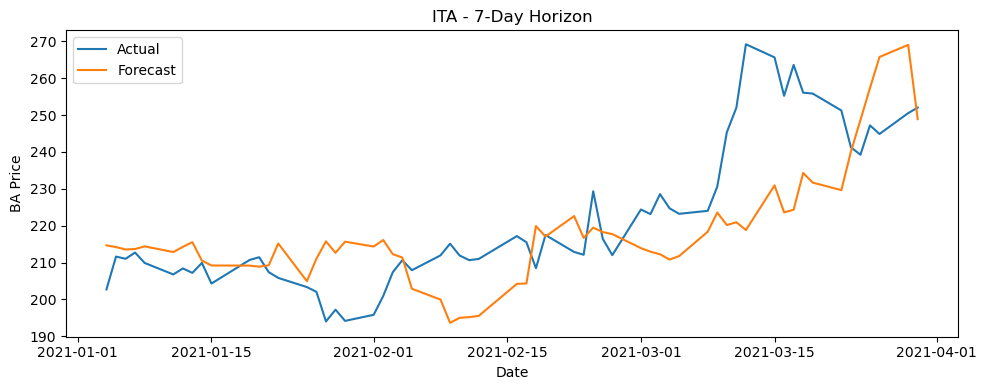


Saved metrics to metrics_lstm_exo_ITA.csv

 Evaluating with exogenous variable: ^VIX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━

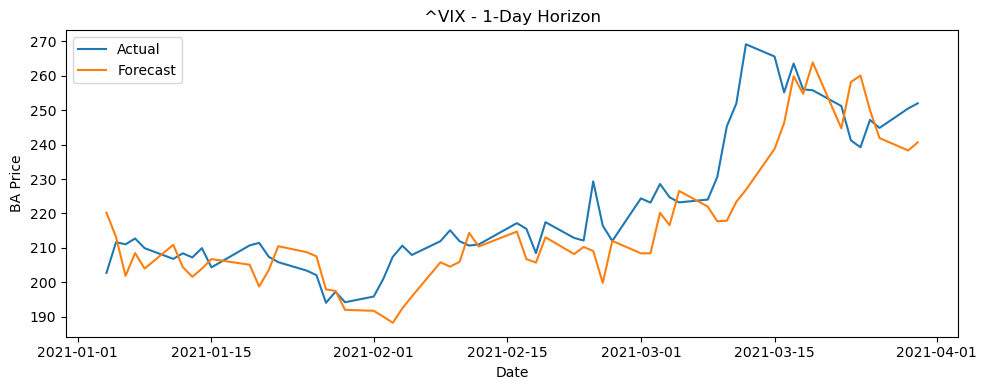

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

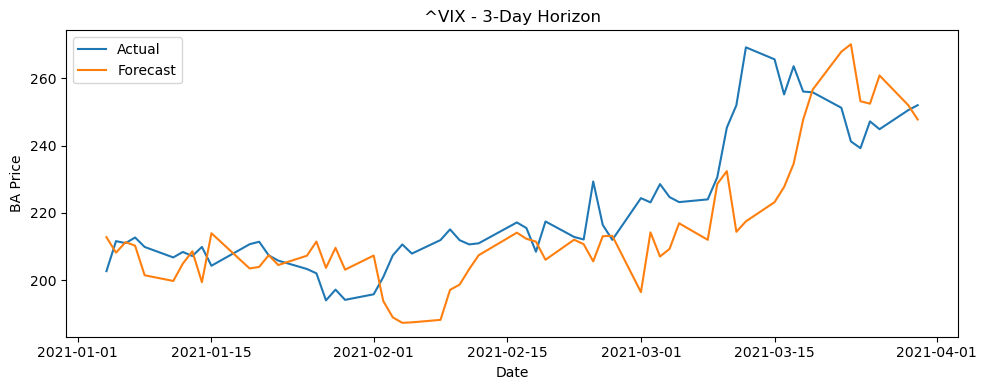

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

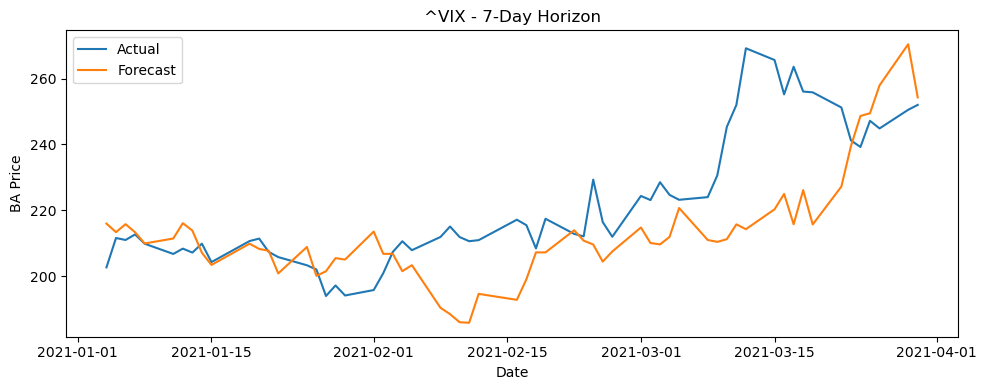


Saved metrics to metrics_lstm_exo_VIX.csv

 Evaluating with exogenous variable: ^TNX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━

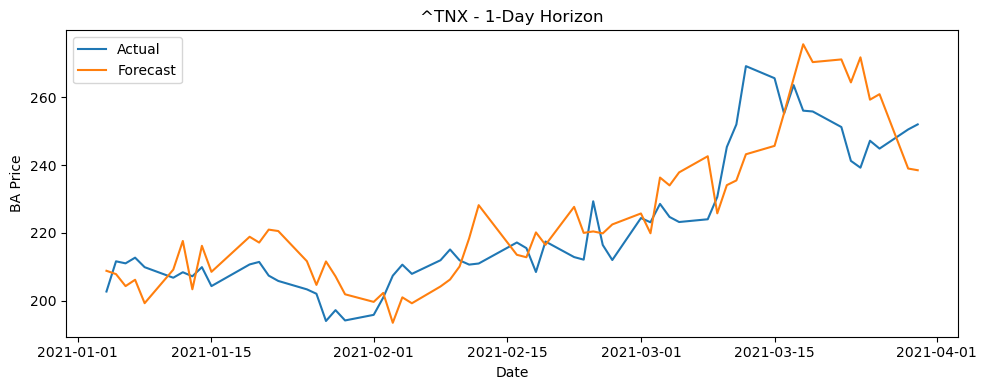

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

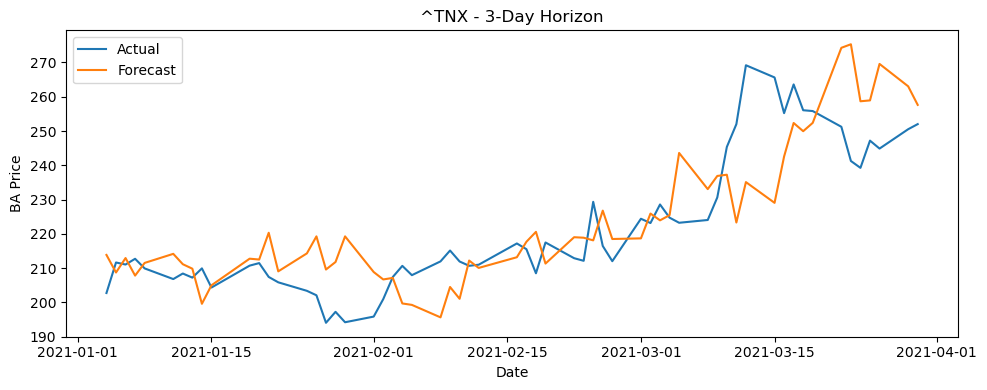

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

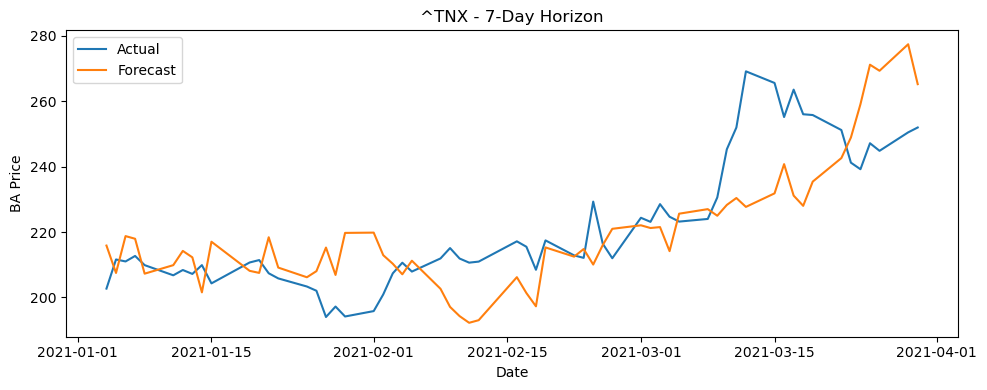


Saved metrics to metrics_lstm_exo_TNX.csv

 Evaluating with exogenous variable: DX-Y.NYB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━

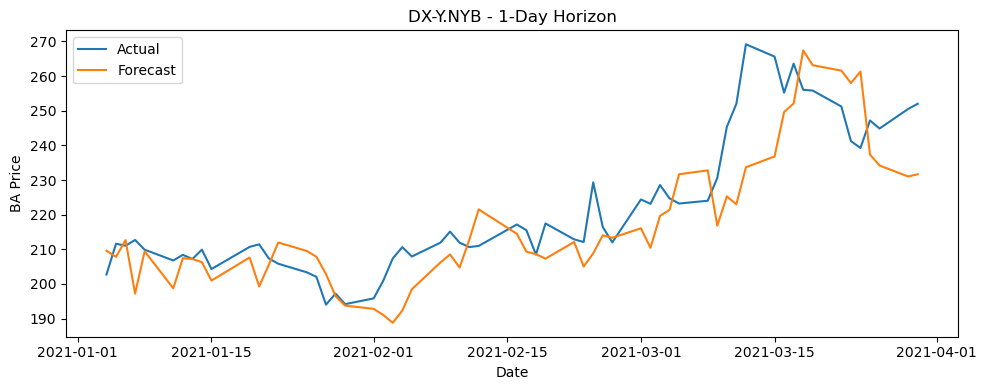

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

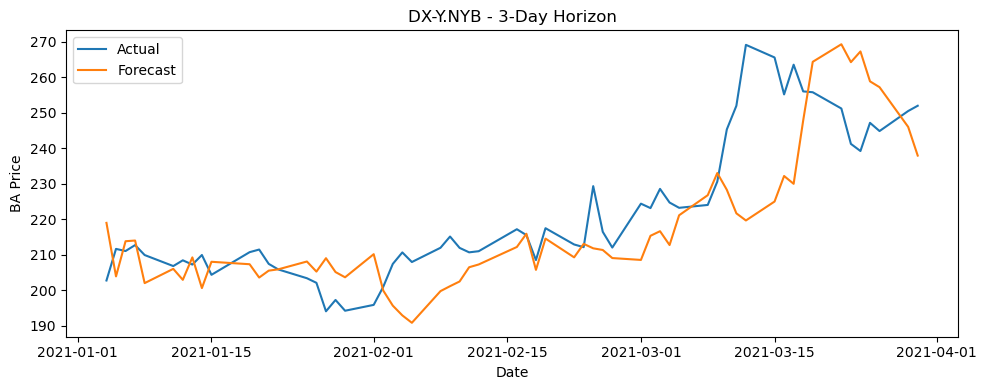

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

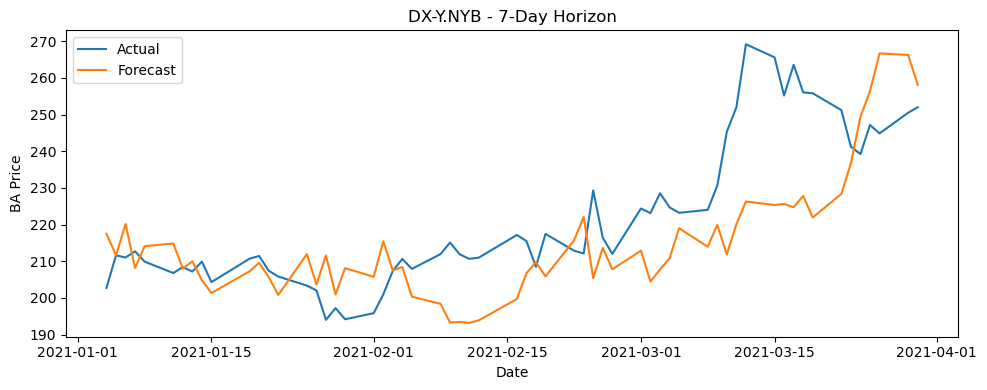


Saved metrics to metrics_lstm_exo_DXY.NYB.csv

 Evaluating with exogenous variable: JETS
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
1/1 ━━━━━━━━━

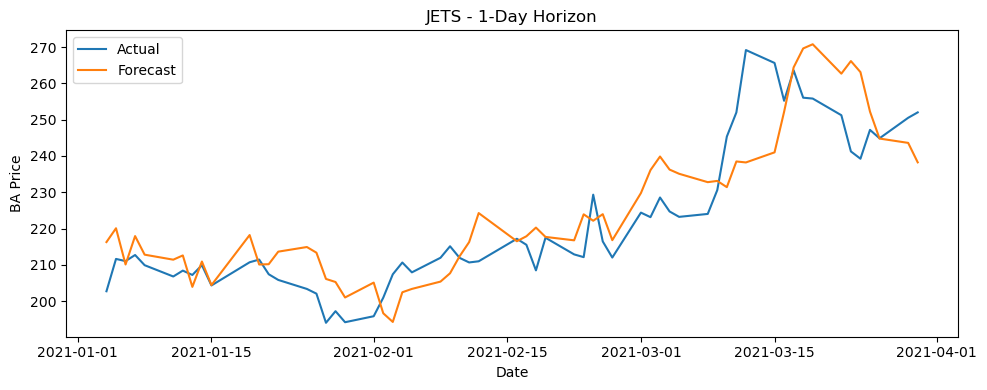

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

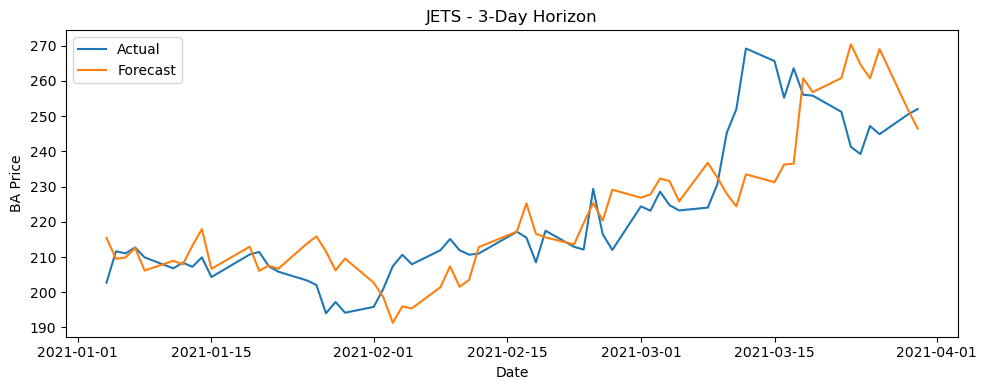

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

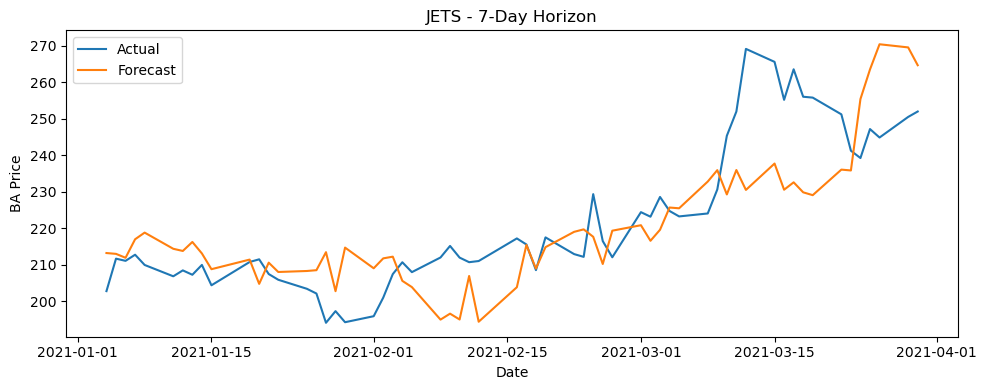


Saved metrics to metrics_lstm_exo_JETS.csv

 Evaluating with exogenous variable: XLI
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━

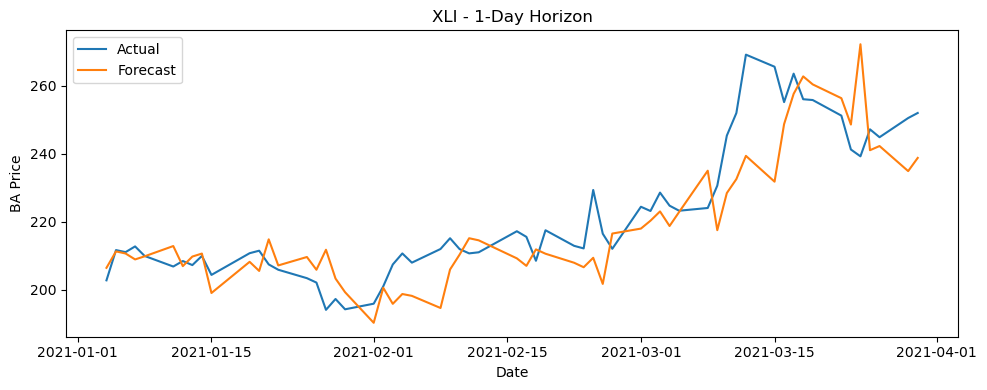

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

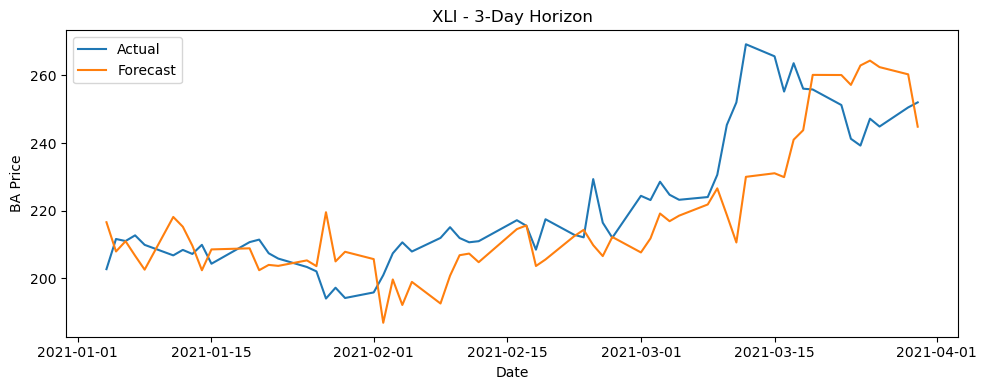

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

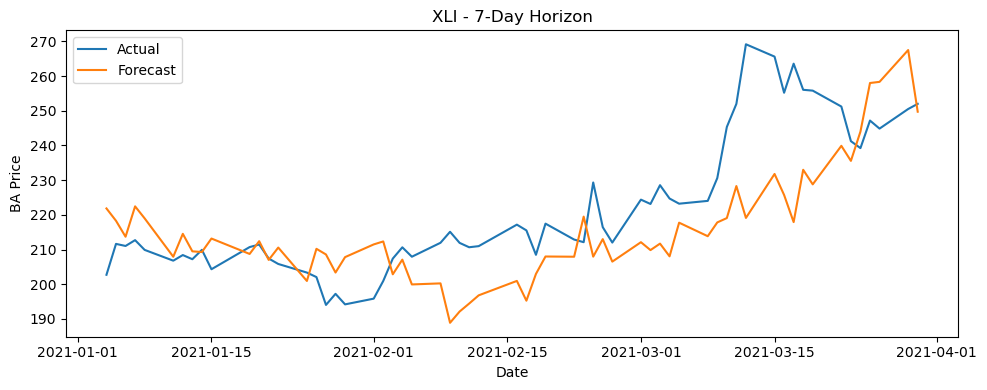


Saved metrics to metrics_lstm_exo_XLI.csv

 Evaluating with exogenous variable: IYT
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step
1/1 ━━━━━━━━━━━━━━

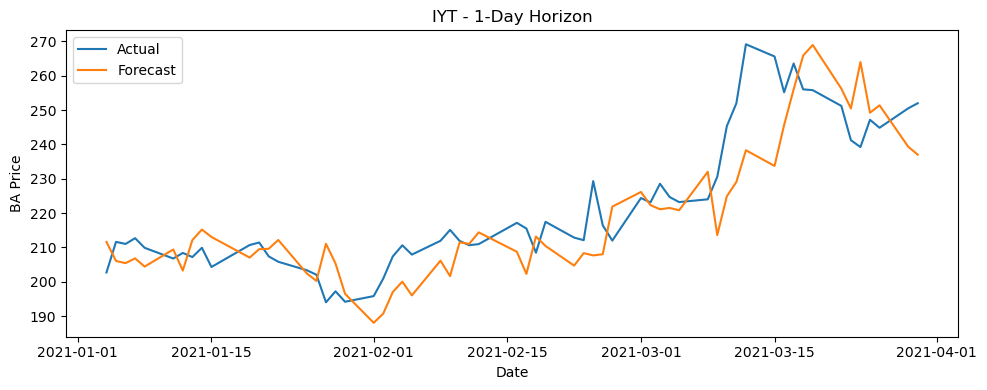

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

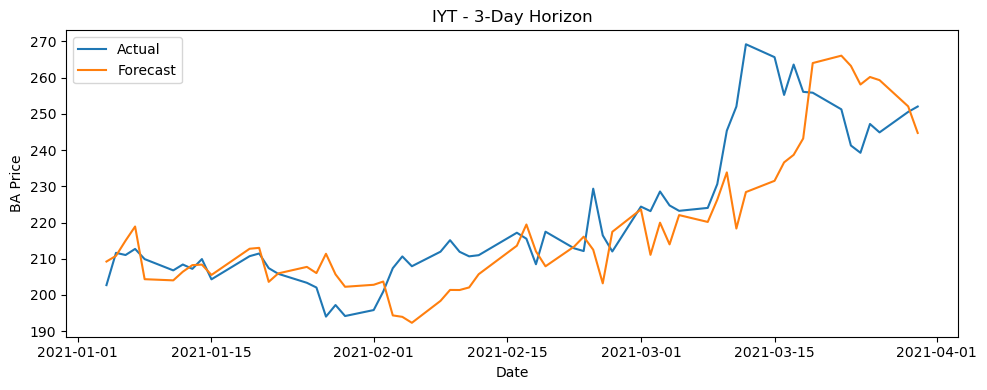

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

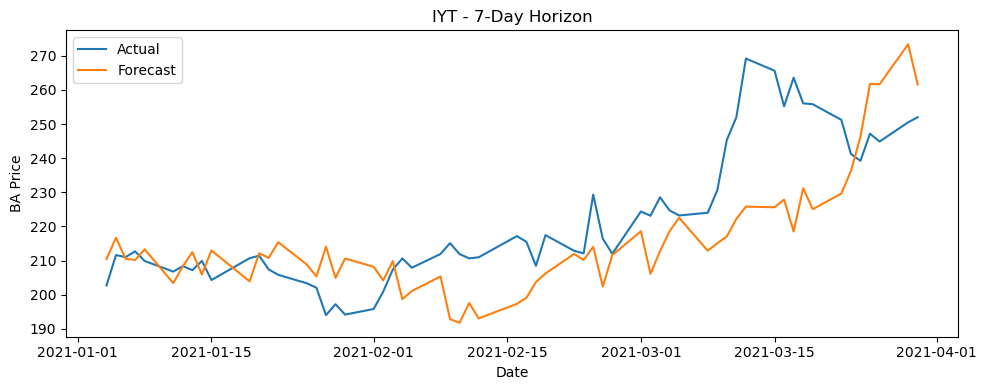


Saved metrics to metrics_lstm_exo_IYT.csv


In [125]:
# loop over exo variables one at a time
exo_vars = ["SLX", "CL=F", "ITA", "^VIX", "^TNX", "DX-Y.NYB", "JETS", "XLI", "IYT"]

for var in exo_vars:
    print(f"\n Evaluating with exogenous variable: {var}")
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var,
        model_fn=best_model_fn,
        forecast_horizons=[1, 3, 7],
        output_csv_path=f"metrics_lstm_exo_{var.replace('=', '').replace('^', '').replace('-', '')}.csv",
        callbacks=[early_stop]
    )

In [126]:
#grouping exo variables by type
grouped_exo_vars = {
    "commodities": ["CL=F", "DX-Y.NYB", "SLX"],           # Oil, Dollar Index, Steel ETF
    "macro": ["^VIX", "^TNX"],                     # Volatility index, treasury yield
    "sectoral": ["XLI", "JETS", "IYT", "ITA"]             # Sector-specific ETFs... Industrials, airlines
}


 Evaluating group: commodities with variables: ['CL=F', 'DX-Y.NYB', 'SLX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 740ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 692ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s

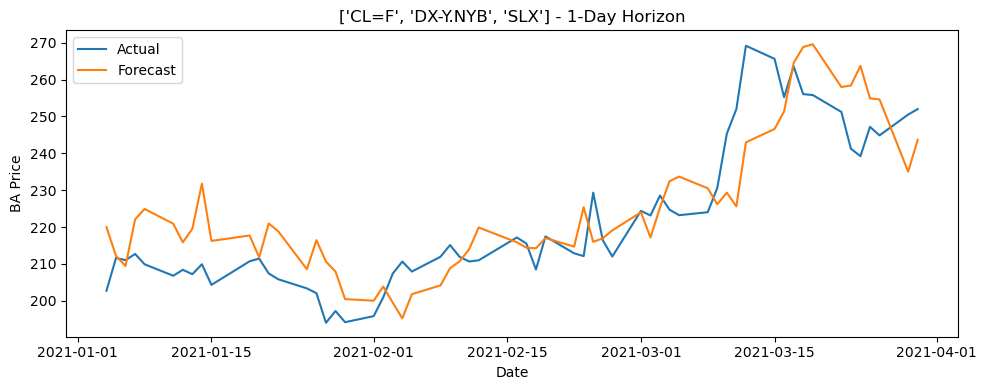


Saved metrics to metrics_lstm_group_commodities_horizon_1.csv

 Evaluating group: macro with variables: ['^VIX', '^TNX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step
1/1 ━━━━━━━━━━━━━━━━

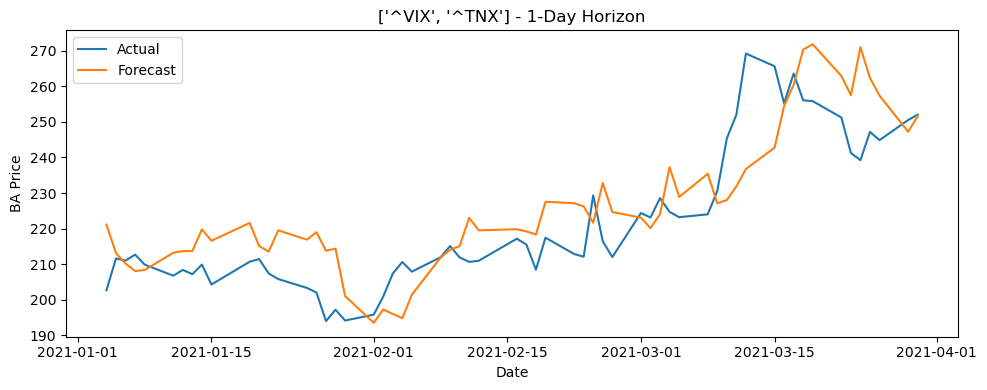


Saved metrics to metrics_lstm_group_macro_horizon_1.csv

 Evaluating group: sectoral with variables: ['XLI', 'JETS', 'IYT', 'ITA']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 839ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 690ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 654ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━

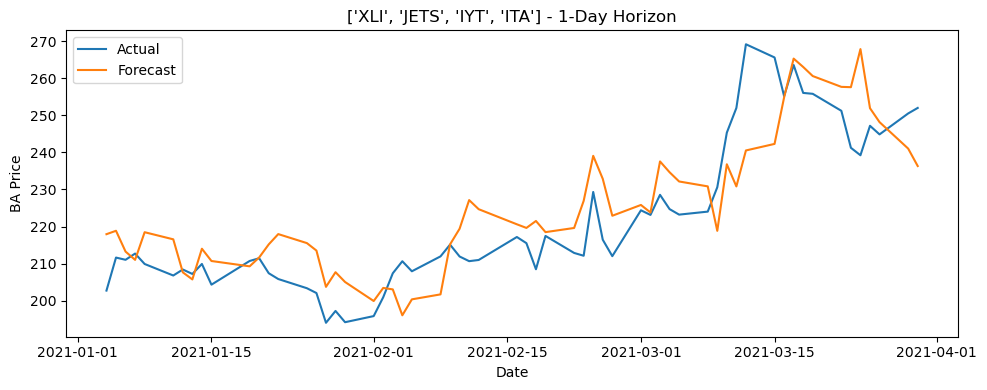


Saved metrics to metrics_lstm_group_sectoral_horizon_1.csv


In [127]:
#loop for evauating grouped variables
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating group: {group_name} with variables: {var_list}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var_list,  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[1], #trying one horizon at a time to deal with memory error
        output_csv_path=f"metrics_lstm_group_{group_name}_horizon_1.csv",
        callbacks=[early_stop]
    )


 Evaluating group: commodities with variables: ['CL=F', 'DX-Y.NYB', 'SLX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 703ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 696ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 782ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

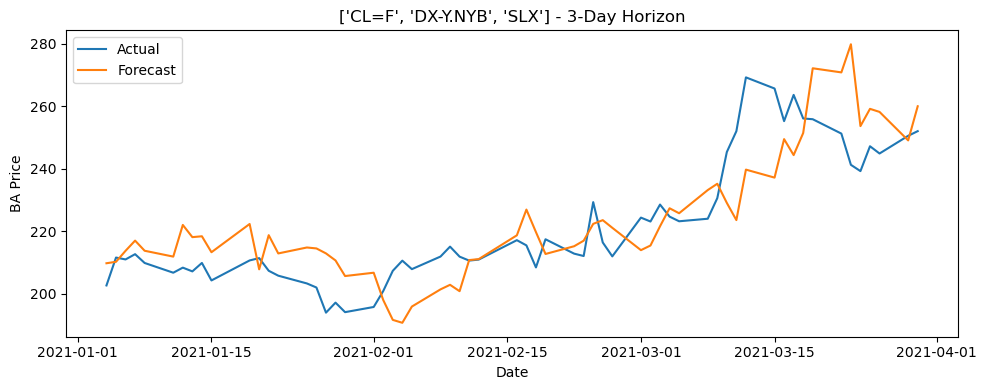


Saved metrics to metrics_lstm_group_commodities_horizon_3.csv

 Evaluating group: macro with variables: ['^VIX', '^TNX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 807ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 838ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━

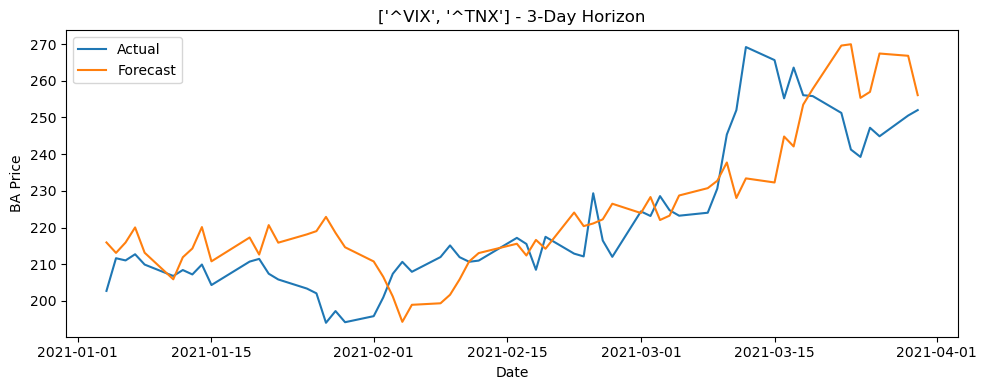


Saved metrics to metrics_lstm_group_macro_horizon_3.csv

 Evaluating group: sectoral with variables: ['XLI', 'JETS', 'IYT', 'ITA']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 756ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step
1/1 ━━━━━━

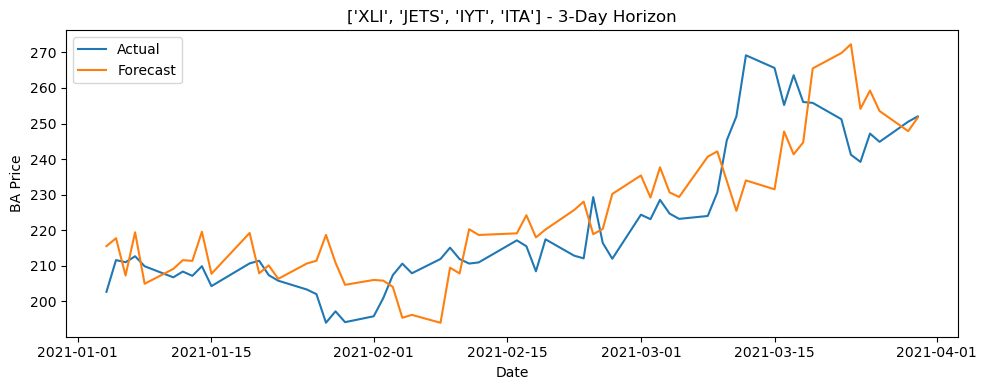


Saved metrics to metrics_lstm_group_sectoral_horizon_3.csv


In [128]:
#loop for evauating grouped variables
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating group: {group_name} with variables: {var_list}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var_list,  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[3],
        output_csv_path=f"metrics_lstm_group_{group_name}_horizon_3.csv",
        callbacks=[early_stop]
    )


 Evaluating group: commodities with variables: ['CL=F', 'DX-Y.NYB', 'SLX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 795ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 708ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 637ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s

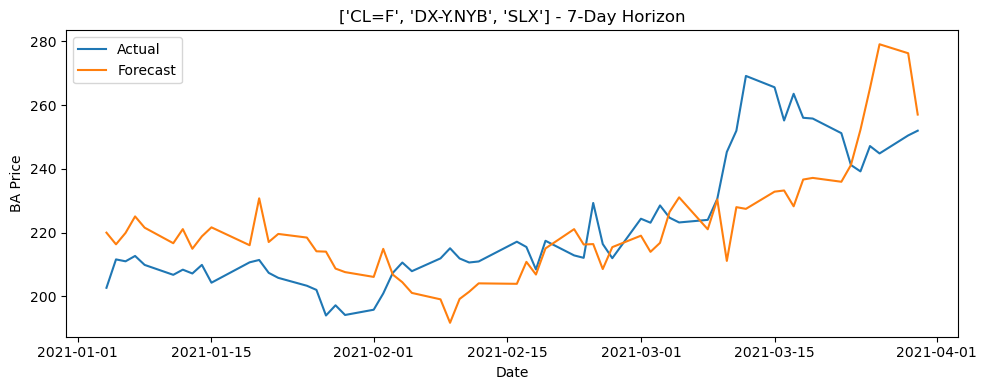


Saved metrics to metrics_lstm_group_commodities_horizon_7.csv

 Evaluating group: macro with variables: ['^VIX', '^TNX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step
1/1 ━━━━━━━━━━━━━━━━

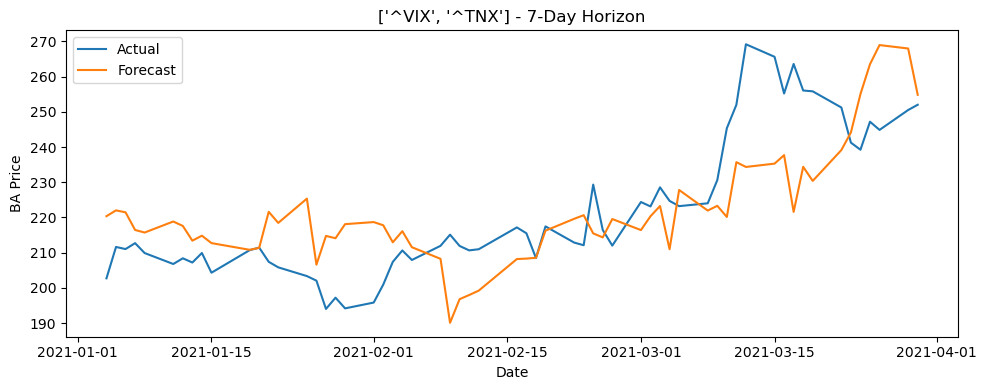


Saved metrics to metrics_lstm_group_macro_horizon_7.csv

 Evaluating group: sectoral with variables: ['XLI', 'JETS', 'IYT', 'ITA']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 735ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 640ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 644ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step
1/1 ━━━━━━

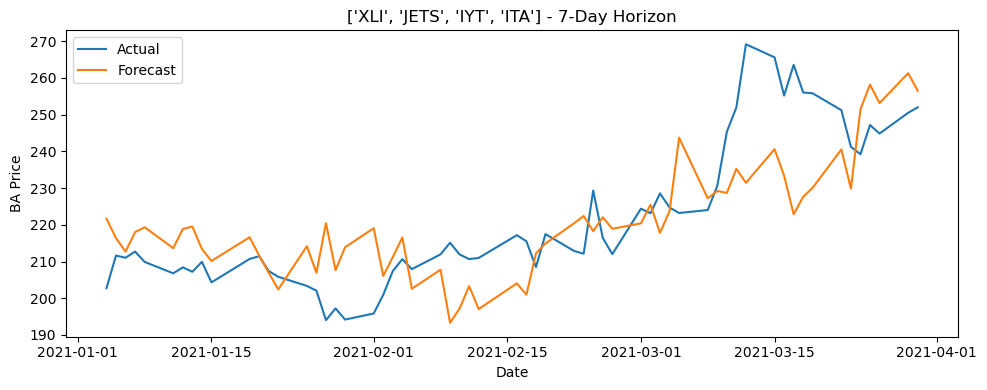


Saved metrics to metrics_lstm_group_sectoral_horizon_7.csv


In [129]:
#loop for evauating grouped variables
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating group: {group_name} with variables: {var_list}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var_list,  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[7],
        output_csv_path=f"metrics_lstm_group_{group_name}_horizon_7.csv",
        callbacks=[early_stop]
    )

### Getting best score from each exo variable type to include as exo variables 

In [132]:
# Defining the variables again to loop through
exo_vars = ["SLX", "CL=F", "ITA", "^VIX", "^TNX", "DX-Y.NYB", "JETS", "XLI", "IYT"]

combined_dfs = []

for var in exo_vars:
    safe_var = var.replace("=", "").replace("^", "").replace("-", "")
    filename = f"metrics_lstm_exo_{safe_var}.csv"

    if os.path.exists(filename):
        df_temp = pd.read_csv(filename)
        df_temp["exo_var"] = var  # adding the original exogenous variable name
        combined_dfs.append(df_temp)
    else:
        print(f"Missing: {filename}")

# Combine and save
if combined_dfs:
    df_all = pd.concat(combined_dfs, ignore_index=True)
    df_all.to_csv("metrics_lstm_all_exo_combined.csv", index=False)
    print("Combined results saved to: metrics_lstm_all_exo_combined.csv")
else:
    print("No data to combine.")

Combined results saved to: metrics_lstm_all_exo_combined.csv


In [133]:
df_all = df_all.drop_duplicates(subset=["exo_var", "horizon"])

#print best inputs
df_all.sort_values(by="mape").groupby("horizon").first()

,model,exo_var,rmse,mae,mape
horizon,,,,,
1,best_model_fn,ITA,9.671369,7.030681,3.083361
3,best_model_fn,ITA,12.983699,9.096539,3.964897
7,best_model_fn,JETS,13.796036,10.755224,4.684570


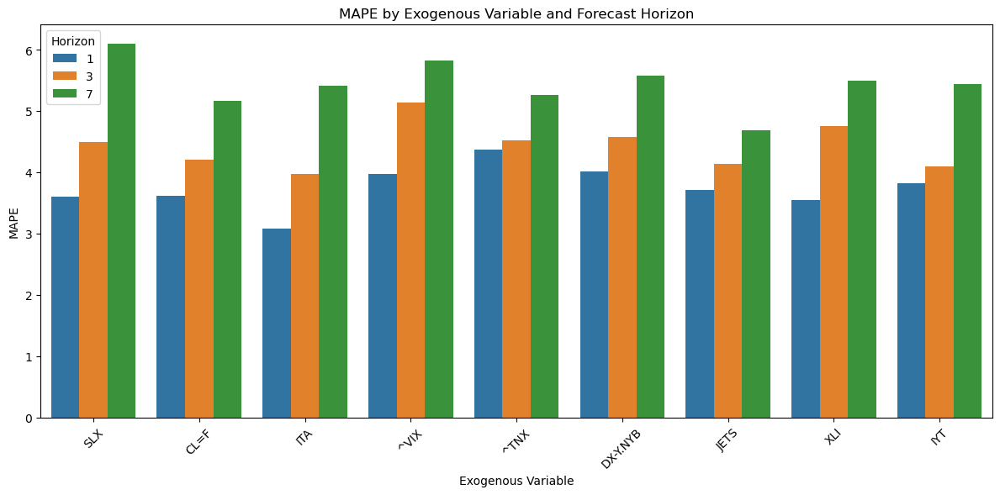

In [134]:
#plotting to compare across multiple horizons

plt.figure(figsize=(12, 6))
sns.barplot(
    data=df_all,
    x="exo_var",
    y="mape",
    hue="horizon",
    palette="tab10"
)
plt.title("MAPE by Exogenous Variable and Forecast Horizon")
plt.xlabel("Exogenous Variable")
plt.ylabel("MAPE")
plt.legend(title="Horizon")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

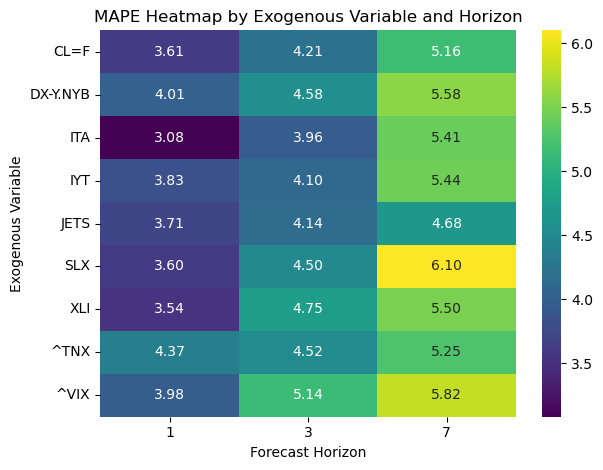

In [135]:
#heatmap
pivot = df_all.pivot(index="exo_var", columns="horizon", values="mape")
sns.heatmap(pivot, annot=True, fmt=".2f", cmap="viridis")
plt.title("MAPE Heatmap by Exogenous Variable and Horizon")
plt.ylabel("Exogenous Variable")
plt.xlabel("Forecast Horizon")
plt.tight_layout()
plt.show()

In [136]:
# mapping labels to tickers
label_mapping = {
    "commodities": ["CL=F", "DX-Y.NYB", "SLX"],
    "macro": ["^VIX", "^TNX"],
    "sectoral": ["XLI", "JETS", "IYT", "ITA"]
}

# inverting the mapping to map each ticker to its category
ticker_to_category = {ticker: label for label, tickers in label_mapping.items() for ticker in tickers}

# assigning the category to each row
df_all["category"] = df_all["exo_var"].map(ticker_to_category)

# Save the updated DataFrame with category column to a new CSV
df_all.to_csv("metrics_with_categories.csv", index=False)

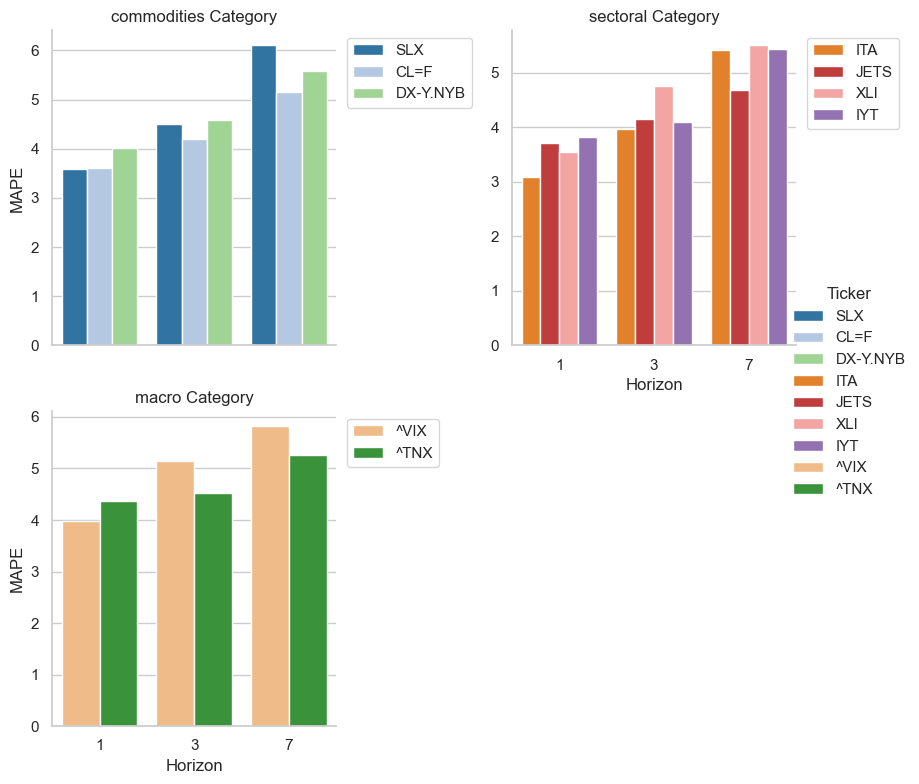

In [137]:
# setting style
sns.set(style="whitegrid")

# using unique color for each ticker
unique_tickers = df_all["exo_var"].unique()
palette = sns.color_palette("tab20", n_colors=len(unique_tickers))
color_map = dict(zip(unique_tickers, palette))

# FacetGrid creation
g = sns.FacetGrid(df_all, col="category", col_wrap=2, height=4, sharey=False)

# plot
g.map_dataframe(
    sns.barplot,
    x="horizon", y="mape", hue="exo_var",
    palette=color_map,
    errorbar=None
)

# key
g.add_legend(title="Ticker")
for ax in g.axes.flatten():
    ax.legend(loc='upper left', bbox_to_anchor=(1.01, 1))

# Set axis labels and titles
g.set_axis_labels("Horizon", "MAPE")
g.set_titles(col_template="{col_name} Category")
plt.tight_layout()
plt.show()


In [149]:
# best from each category identified - defining list to use in model
best_exo_by_horizon = {
    1: ["SLX", "ITA", "^VIX"],
    3: ["CL=F", "ITA", "^TNX"],
    7: ["CL=F", "JETS", "^TNX"]
}


Evaluating best exogenous variables for horizon 1: ['SLX', 'ITA', '^VIX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 684ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 742ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 785ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 731ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 745ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 721ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 713ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 849ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 848ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 716ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

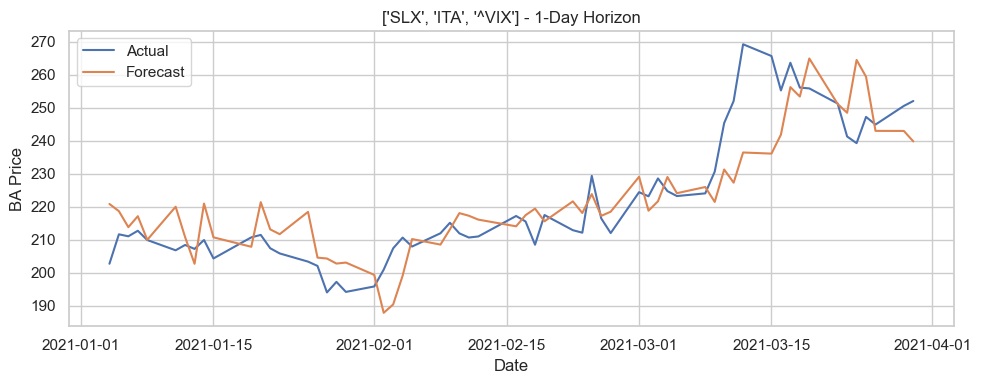


Saved metrics to metrics_lstm_bestof_horizon_1_boeing.csv

Evaluating best exogenous variables for horizon 3: ['CL=F', 'ITA', '^TNX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 843ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 762ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 723ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step
1/1 ━━━

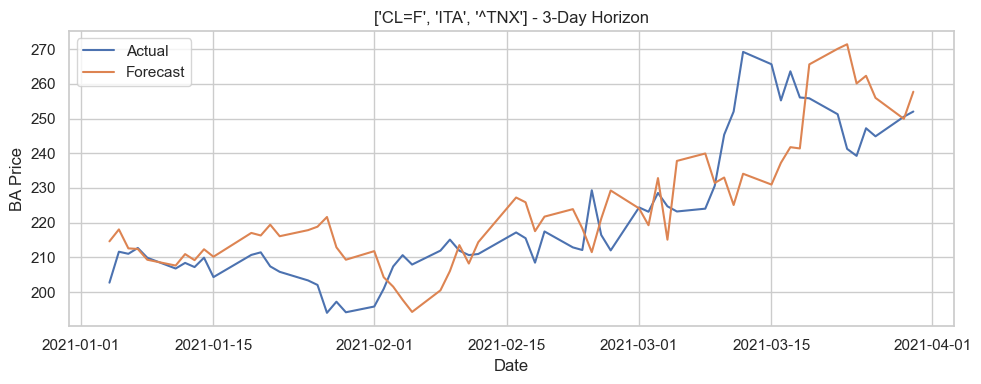


Saved metrics to metrics_lstm_bestof_horizon_3_boeing.csv

Evaluating best exogenous variables for horizon 7: ['CL=F', 'JETS', '^TNX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 817ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 728ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 780ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 750ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 677ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 786ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 693ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 813ms/step
1/1 ━━

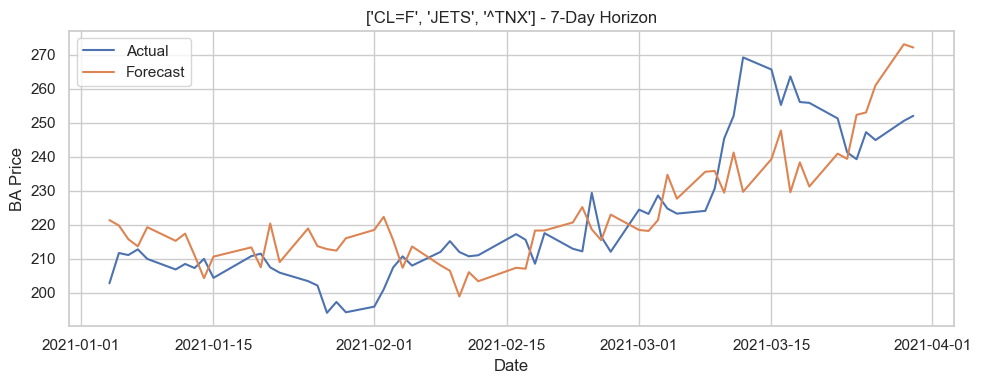


Saved metrics to metrics_lstm_bestof_horizon_7_boeing.csv


In [151]:
# looping over each horizon and using its best exogenous variables
for h, exo_list in best_exo_by_horizon.items():
    print(f"\nEvaluating best exogenous variables for horizon {h}: {exo_list}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=exo_list,
        model_fn=best_model_fn,
        forecast_horizons=[h],  # just one at a time
        output_csv_path=f"metrics_lstm_bestof_horizon_{h}_boeing.csv",
        callbacks=[early_stop]
    )
